# Plotting Notebook
Please use this is a guide to the type plots that you can create, as examples of the `hist`, `mplhep`, and other packages, as well as the use of the various functions that we have written in `plot_utils.py`. <br>
Use the the Table of Contents in Jupyter to view the different sections of the notebook to help navigating it.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 1

In [3]:
import os, sys, glob, random
import pickle
import math
import multiprocessing
import itertools
import warnings
import json
import time
import numpy as np
from typing import Dict, List
from rich import print
from rich.pretty import pprint
from rich.console import Console
from rich.table import Table
from rich.progress import Progress, track
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
from cycler import cycler
import hist
from hist import Hist
import mplhep as hep
from tabulate import tabulate
import scipy
import uproot
import ROOT
from iminuit import Minuit
from iminuit.cost import LeastSquares
from jacobi import propagate

%aimport plot_utils
%aimport plot_utils_extras
%aimport fill_utils
%aimport generic_utils

In [4]:
warnings.filterwarnings("ignore")
mpl.rcParams.update({"figure.max_open_warning": 0})
mpl.rcParams["figure.facecolor"] = "white"
hep.style.use("CMS")
np.set_printoptions(suppress=True)

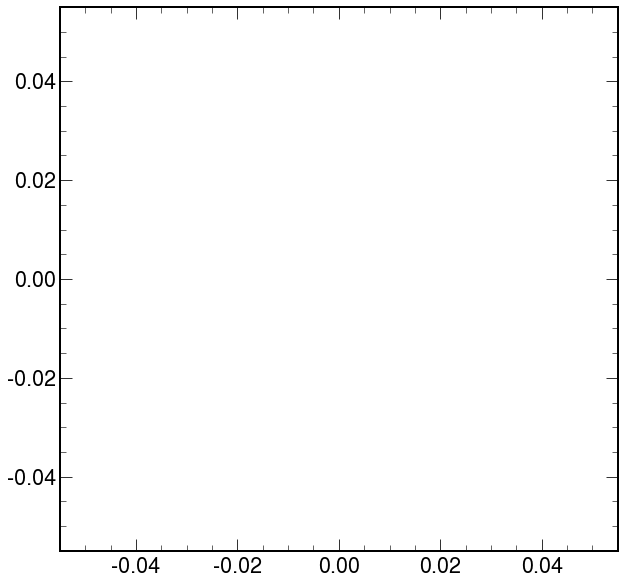

In [11]:
plt.plot()
hep.style.use(hep.style.CMS)

In [6]:
print("The following output directories are available:")
!ls | grep output_histograms

The following output directories are available:

CR_cb_34mu_output_histograms
CR_cb_combine_output_histograms
CR_cb_output_histograms
CR_cb_postDYstudy_output_histograms
CR_light_postDYstudy_output_histograms
CR_prompt_34mu_leading_output_histograms
CR_prompt_34mu_output_histograms
CR_prompt_combine_output_histograms
CR_prompt_dimuon_output_histograms
CR_prompt_dystudy_output_histograms
CR_prompt_leading_output_histograms
CR_prompt_output_histograms
CR_prompt_postDYstudy_output_histograms
DYstudy_2_output_histograms
DYstudy_3_output_histograms
DYstudy_4_output_histograms
DYstudy_5_output_histograms
DYstudy_output_histograms
DYstudy_trigger_match_double_output_histograms
DYstudy_trigger_match_triple_output_histograms
DYstudy_trigger_one_path_output_histograms
fake_rate_output_histograms
kinematics_output_histograms
nbjet_comparison_output_histograms
SR_combine_new_trigger_output_histograms
SR_combine_old_trigger_output_histograms
SR_combine_output_histograms
SR_extrapolation_new_from_mini_output_histograms
SR_extrapolation_new_output_

## Load plots

In [7]:
plots = generic_utils.loader(tag="kinematics")

These are all the samples loaded.

In [8]:
keys = list(plots.keys())
pprint(keys)

[
│   'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
│   'SUEP_mS125_mPhi2_T2_modehadronic_2018',
│   'SUEP_mS125_mPhi8_T32_modehadronic_2018',
│   'QCD_Pt-1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt_MuEnriched_2018',
│   'QCD_Pt-120To170_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-15To20_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-170To300_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-20To30_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-300To470_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-30To50_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-470To600_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-50To80_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-600To800_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-800To1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-80To120_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018',
│   'QCD_Pt-1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-120To170_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-15To20_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-170To300_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-20To30_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-300To470_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-30To50_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-470To600_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-50To80_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-600To800_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-800To1000_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018',
│   'QCD_Pt-80To120_MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_2018'
]

In [9]:
for key in plots["SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018"].keys():
    pprint(f"{key}")

'nMuon_muon_miniPFRelIso_all_cut_15'

'nMuon_muon_miniPFRelIso_neutral_cut_0p1'

'nMuon_muon_miniPFRelIso_neutral_cut_1'

'muon_miniPFRelIso_neutral_vs_nMuon'

'muon_pfRelIso03_neutral_vs_nMuon'

'Jet_chHEF_vs_nMuon'

'Jet_muEF_vs_nMuon'

'Jet_muonSubtrFactor_vs_nMuon'

'Jet_nMuons_vs_nMuon'

'Jet_neEmEF_vs_nMuon'

'Jet_neHEF_vs_nMuon'

'HT_neutral_vs_HT_charged_vs_nMuon'

'nPFCands_neutral_vs_nPFCands_charged_vs_nMuon'

'iso_ratio_vs_nMuon'

'iso_ratio_vs_nMuon_iso_cut'

'Muon_pfRelIso03_all_vs_Muon_pfRelIso03_chg_vs_nMuon'

'Muon_pfRelIso03_all_vs_Muon_pfRelIso04_all_vs_nMuon'

'Muon_miniPFRelIso_all_vs_Muon_miniPFRelIso_chg_vs_nMuon'

'Muon_miniPFRelIso_all_vs_Muon_pfRelIso03_all_vs_nMuon'

'b_vetoed_vs_miniPFRelIso_cut_vs_nMuon'

'b_vetoed_vs_pfRelIso03_cut_vs_nMuon'

'b_vetoed_vs_miniPFRelIso_invcut_vs_nMuon'

'b_vetoed_vs_pfRelIso03_invcut_vs_nMuon'

'muon_pt'

'muon_pt_max'

'nJet_vs_nMuon'

'nFatJet_vs_nMuon'

'ht_vs_nMuon'

'tot_muon_charge_vs_nMuon'

QCD_Pt_MuEnriched_2018

0.1 WeightedSum(value=3557.71, variance=9.30184e+06)

SUEP_mS125_mPhi8_T32_modehadronic_2018

0.1 WeightedSum(value=0, variance=0)

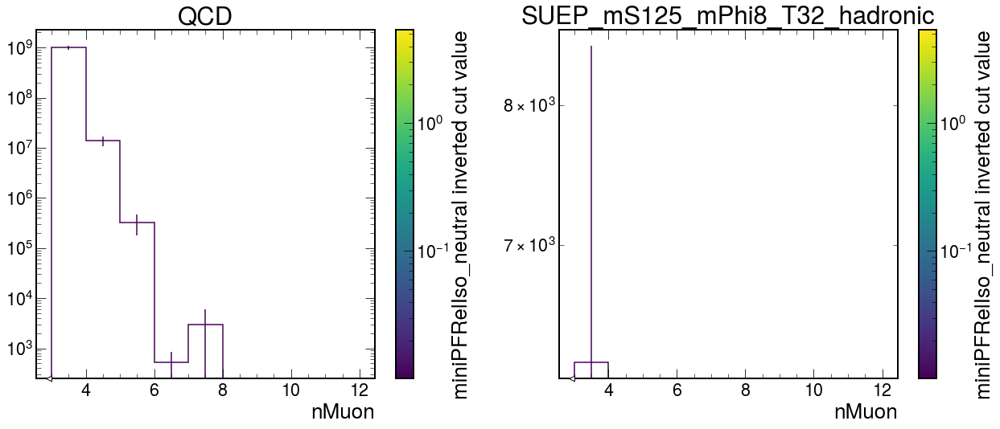

In [12]:
hist_name = "b_vetoed_vs_miniPFRelIso_invcut_vs_nMuon"

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

cuts = np.logspace(-2, 1, 12)[:-1] * 1.01

plt.rcParams["axes.prop_cycle"] = plt.cycler(
    color=plt.cm.viridis(np.linspace(0, 1, 11))
)

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(18, 8))
for i, p in enumerate(processes):
    print(p)
    ax = axs[i]
    # for cut in cuts:
    cut = 0.1
    histogram = plots[p][hist_name][True, cut * 1j, :]
    print(cut, histogram[6j::sum])
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        ax=ax,
    )
    ax.set_title(
        p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", "")
    )

    norm = mpl.colors.LogNorm(vmin=min(cuts), vmax=max(cuts))
    sm = mpl.cm.ScalarMappable(cmap=mpl.cm.viridis, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("miniPFRelIso_neutral inverted cut value")

    # plt.legend()
    # plt.ylim(1e-1, 1e12)
    ax.set_yscale("log")
plt.tight_layout()
plt.show()

QCD_Pt_MuEnriched_2018

0.0101 WeightedSum(value=3622.9, variance=9.30346e+06)

0.01892555597088988 WeightedSum(value=3622.9, variance=9.30346e+06)

0.03546303651557282 WeightedSum(value=3622.9, variance=9.30346e+06)

0.06645125569041437 WeightedSum(value=3622.9, variance=9.30346e+06)

0.12451752068364866 WeightedSum(value=3622.9, variance=9.30346e+06)

0.23332309970839907 WeightedSum(value=3613.89, variance=9.30339e+06)

0.4372048893893888 WeightedSum(value=3605.58, variance=9.30333e+06)

0.8192421390975837 WeightedSum(value=544.414, variance=106674)

1.5351101937824625 WeightedSum(value=515.205, variance=105899)

2.876516227120157 WeightedSum(value=248.653, variance=53324)

5.39006622351837 WeightedSum(value=0, variance=0)

SUEP_mS125_mPhi8_T32_modehadronic_2018

0.0101 WeightedSum(value=0, variance=0)

0.01892555597088988 WeightedSum(value=0, variance=0)

0.03546303651557282 WeightedSum(value=0, variance=0)

0.06645125569041437 WeightedSum(value=0, variance=0)

0.12451752068364866 WeightedSum(value=0, variance=0)

0.23332309970839907 WeightedSum(value=0, variance=0)

0.4372048893893888 WeightedSum(value=0, variance=0)

0.8192421390975837 WeightedSum(value=0, variance=0)

1.5351101937824625 WeightedSum(value=0, variance=0)

2.876516227120157 WeightedSum(value=0, variance=0)

5.39006622351837 WeightedSum(value=0, variance=0)

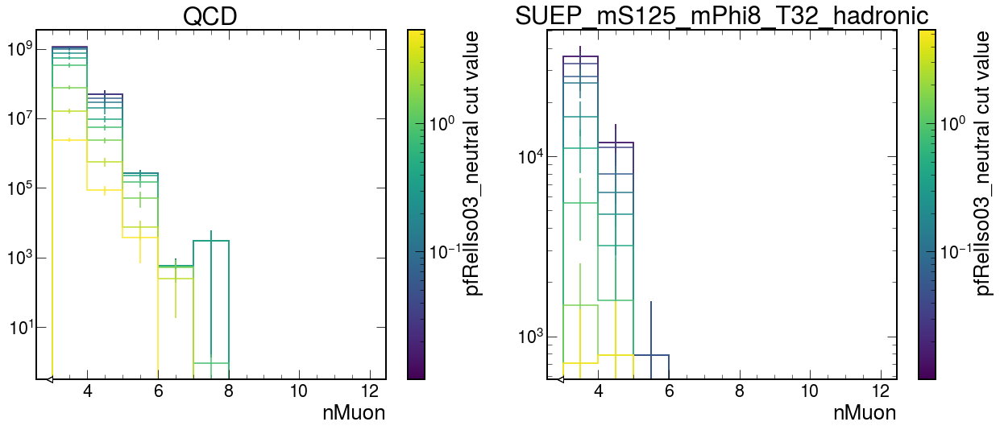

In [24]:
hist_name = "b_vetoed_vs_pfRelIso03_invcut_vs_nMuon"

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

cuts = np.logspace(-2, 1, 12)[:-1] * 1.01

plt.rcParams["axes.prop_cycle"] = plt.cycler(
    color=plt.cm.viridis(np.linspace(0, 1, 11))
)

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(18, 8))
for i, p in enumerate(processes):
    print(p)
    ax = axs[i]
    for cut in cuts:
        histogram = plots[p][hist_name][True, cut * 1j, :]
        print(cut, histogram[6j::sum])
        histogram.plot(
            yerr=np.sqrt(histogram.variances()),
            ax=ax,
        )
    ax.set_title(
        p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", "")
    )

    norm = mpl.colors.LogNorm(vmin=min(cuts), vmax=max(cuts))
    sm = mpl.cm.ScalarMappable(cmap=mpl.cm.viridis, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label("pfRelIso03_neutral cut value")

    # plt.legend()
    # plt.ylim(1e-1, 1e12)
    ax.set_yscale("log")
plt.tight_layout()
plt.show()

## Fake rate method 1

In [40]:
hist_name = "b_vetoed_vs_miniPFRelIso_invcut_vs_nMuon"
process = "QCD_Pt_MuEnriched_2018"
histogram = plots[process][hist_name][True, 0.1 * 1j, :]
print("yield nMuon < 6 (inv cuts): ", histogram[:6j:sum].value)
print("yield nMuon ≥ 6 (inv cuts): ", histogram[6j::sum].value)
print("ratio r: ", histogram[6j::sum].value / histogram[:6j:sum].value)

yield nMuon < 6 (inv cuts):  192262423204.84

yield nMuon ≥ 6 (inv cuts):  3557.709752114466

ratio r:  1.850444664542699e-08

In [42]:
r = 1.850444664542699e-08
hist_name = "b_vetoed_vs_miniPFRelIso_cut_vs_nMuon"
process = "QCD_Pt_MuEnriched_2018"
histogram = plots[process][hist_name][True, 0.1 * 1j, :]
print("yield nMuon < 6 (normal cuts): ", histogram[:6j:sum].value)
print("Estimated yield for ≥ 6 (normal cuts): ", histogram[:6j:sum].value * r)

yield nMuon < 6 (normal cuts):  15740144063.175209

Estimated yield for ≥ 6 (normal cuts):  291.26265600836007

## Fake rate method 2

In [47]:
process = "QCD_Pt_MuEnriched_2018"
hist_name_cut = "b_vetoed_vs_miniPFRelIso_cut_vs_nMuon"
hist_name_invcut = "b_vetoed_vs_miniPFRelIso_invcut_vs_nMuon"
histogram_cut = plots[process][hist_name_cut][True, 0.1 * 1j, :]
histogram_invcut = plots[process][hist_name_invcut][True, 0.1 * 1j, :]

r = histogram_cut[:4j:sum].value / histogram_invcut[:4j:sum].value

print(f"yield nMuon < 4 (inv cuts): {histogram_invcut[:4j:sum].value:.3f}")
print(f"yield nMuon < 4 (normal cuts): {histogram_cut[:4j:sum].value:.3f}")
print(f"ratio r = {r:.3f}")
print(f"yield nMuon ≥ 4 (inv cuts): {histogram_invcut[4j::sum].value:.3f}")
print(f"yield nMuon ≥ 4 (normal cuts): {histogram_cut[4j::sum].value:.3f}")
print(
    f"Estimate for nMuon ≥ 4 (normal cuts): {histogram_invcut[4j::sum].value * r:.3f}"
)

yield nMuon < 4 (inv cuts): 192248315449.270

yield nMuon < 4 (normal cuts): 15732463942.943

ratio r = 0.082

yield nMuon ≥ 4 (inv cuts): 14111313.280

yield nMuon ≥ 4 (normal cuts): 7680120.232

Estimate for nMuon ≥ 4 (normal cuts): 1154786.334

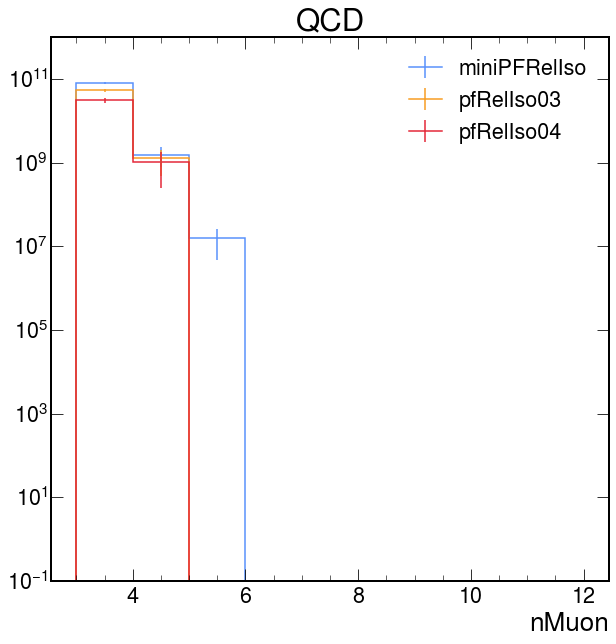

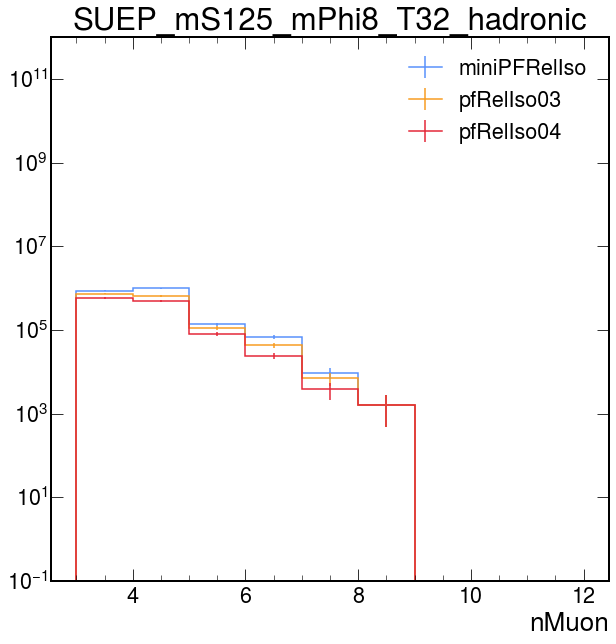

In [45]:
hists = [
    "b_vetoed_vs_miniPFRelIso_cut_vs_nMuon",
    "b_vetoed_vs_pfRelIso03_cut_vs_nMuon",
    "b_vetoed_vs_pfRelIso04_cut_vs_nMuon",
]

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]


for p in processes:
    for h in hists:
        histogram = plots[p][h][False, 1j, :]
        histogram.plot(yerr=np.sqrt(histogram.variances()), label=h[12:-13])
    plt.title(p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""))
    plt.legend()
    plt.ylim(1e-1, 1e12)
    plt.yscale("log")
    plt.show()

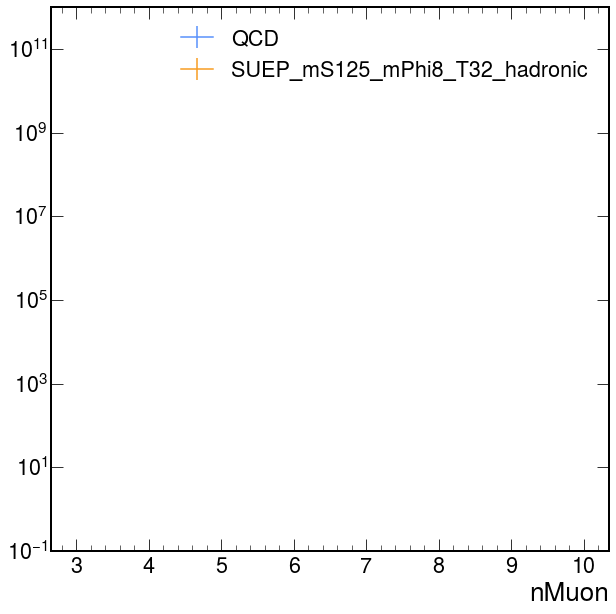

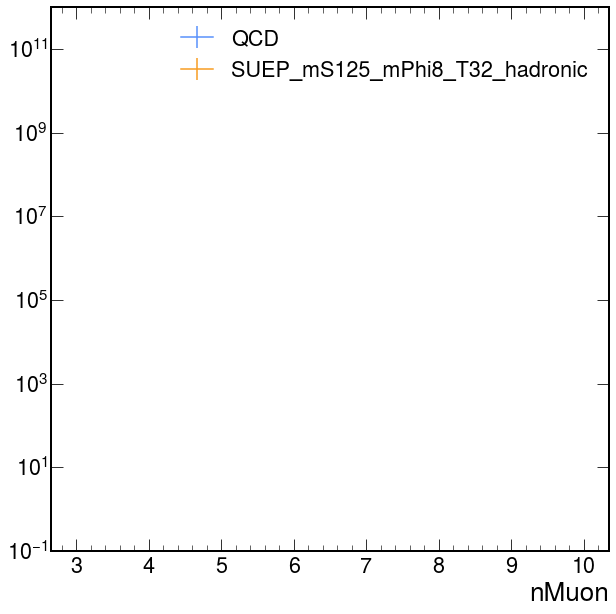

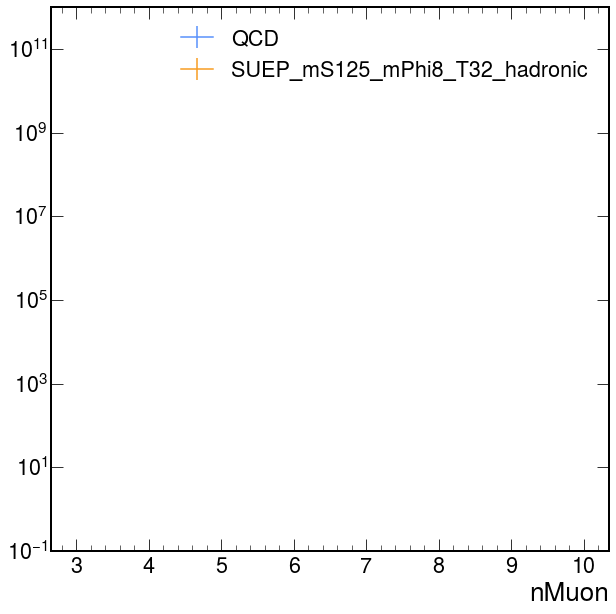

In [41]:
hists = [
    "nMuon_muon_miniPFRelIso_all_cut_15",
    "nMuon_muon_miniPFRelIso_neutral_cut_1",
    "nMuon_muon_miniPFRelIso_neutral_cut_0p1",
]

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for h in hists:
    for p in processes:
        histogram = plots[p][h]
        histogram.plot(
            yerr=np.sqrt(histogram.variances()),
            label=p.replace("_2018", "")
            .replace("mode", "")
            .replace("_Pt_MuEnriched", ""),
        )
    plt.legend()
    plt.ylim(1e-1, 1e12)
    plt.yscale("log")
    plt.show()

WeightedSum(value=8.29507e+06, variance=1.06159e+13)

WeightedSum(value=699952, variance=5.60482e+08)

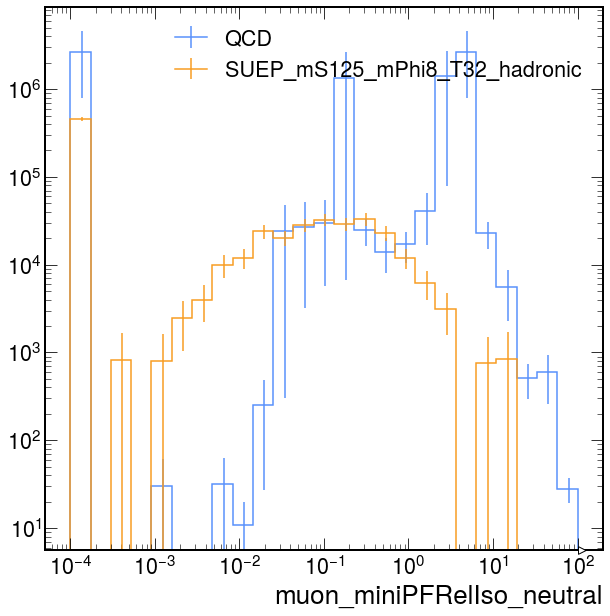

WeightedSum(value=8.29507e+06, variance=1.06159e+13)

WeightedSum(value=699952, variance=5.60482e+08)

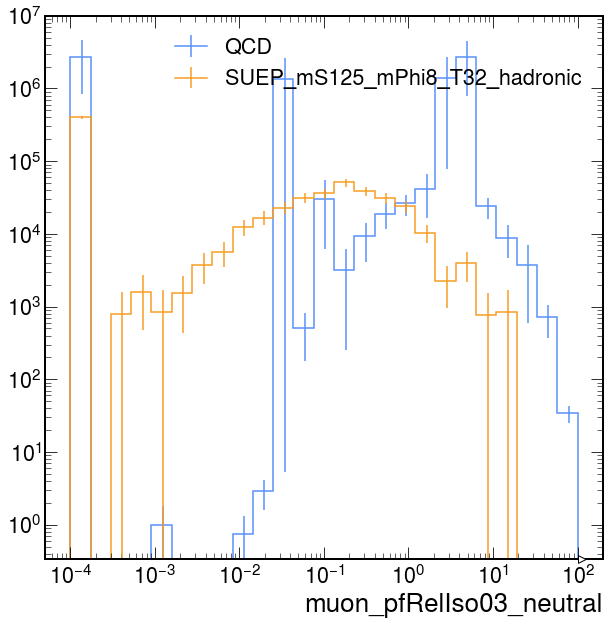

In [17]:
hists = [
    "muon_miniPFRelIso_neutral_vs_nMuon",
    "muon_pfRelIso03_neutral_vs_nMuon",
]

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for h in hists:
    for p in processes:
        print(plots[p][h][:, 6j::sum].sum(flow=True))
        histogram = plots[p][h][:, 6j::sum]
        histogram.plot(
            yerr=np.sqrt(histogram.variances()),
            label=p.replace("_2018", "")
            .replace("mode", "")
            .replace("_Pt_MuEnriched", ""),
        )
    plt.legend()
    plt.xscale("log")
    plt.yscale("log")
    plt.show()

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

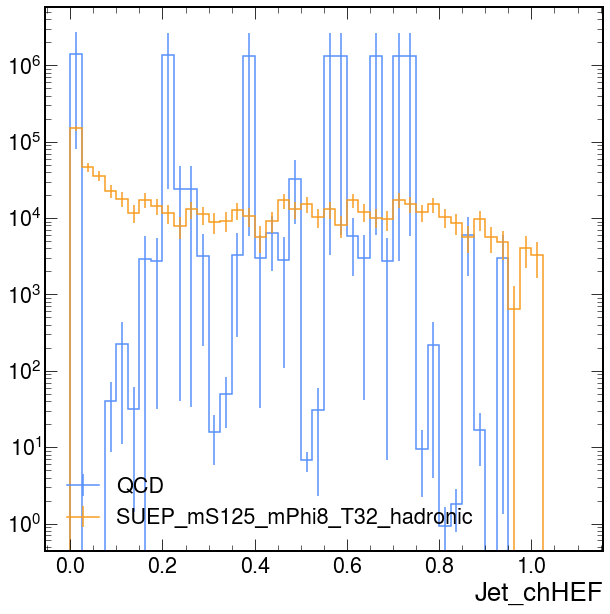

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

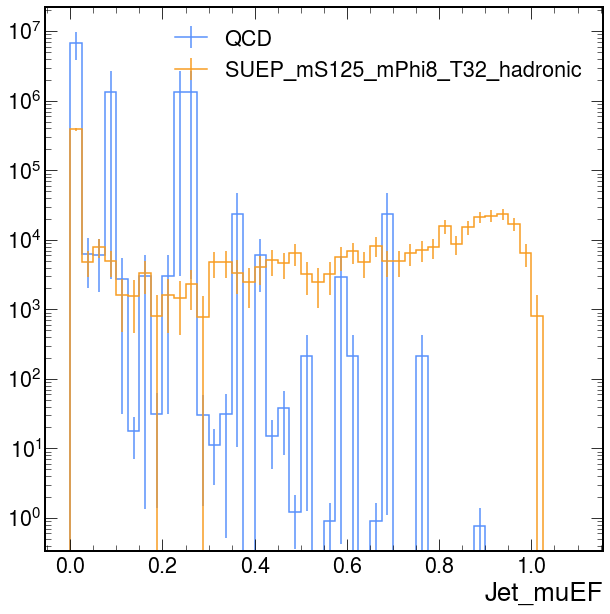

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

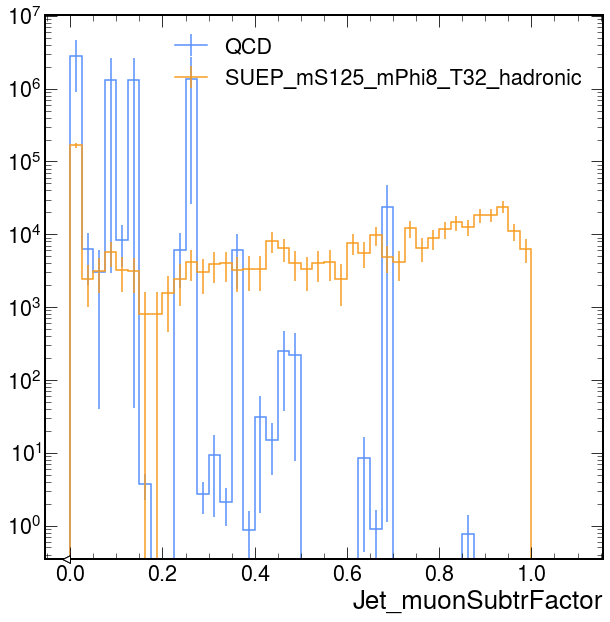

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

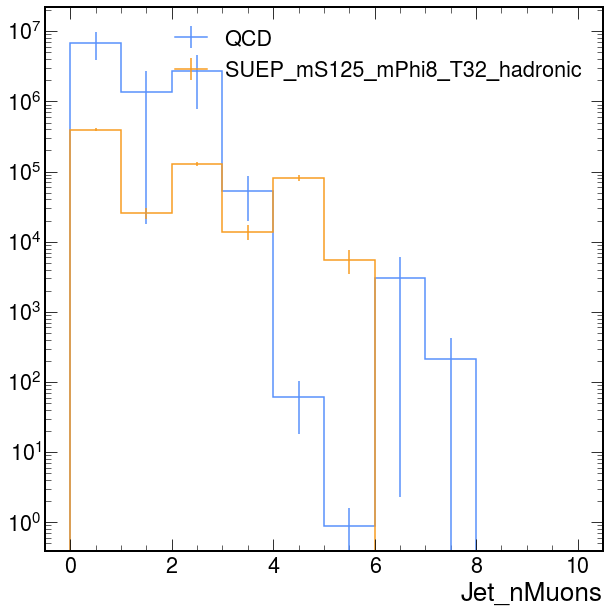

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

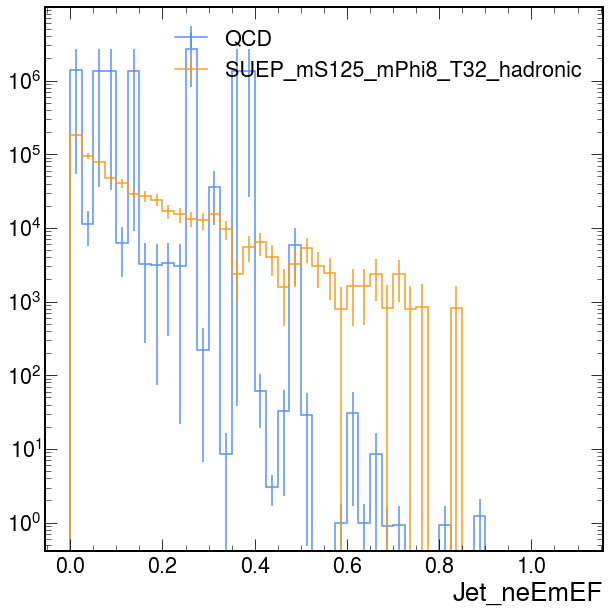

WeightedSum(value=1.08998e+07, variance=1.41537e+13)

WeightedSum(value=652811, variance=5.26585e+08)

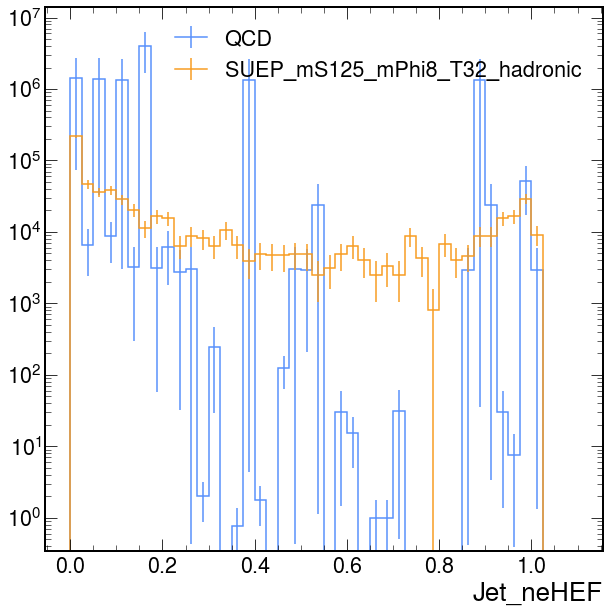

In [14]:
hists = [
    "Jet_chHEF_vs_nMuon",
    "Jet_muEF_vs_nMuon",
    "Jet_muonSubtrFactor_vs_nMuon",
    "Jet_nMuons_vs_nMuon",
    "Jet_neEmEF_vs_nMuon",
    "Jet_neHEF_vs_nMuon",
]

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for h in hists:
    for p in processes:
        print(plots[p][h][:, 6j::sum].sum(flow=True))
        histogram = plots[p][h][:, 6j::sum]
        histogram.plot(
            yerr=np.sqrt(histogram.variances()),
            label=p.replace("_2018", "")
            .replace("mode", "")
            .replace("_Pt_MuEnriched", ""),
        )
    plt.legend()
    plt.yscale("log")
    plt.show()

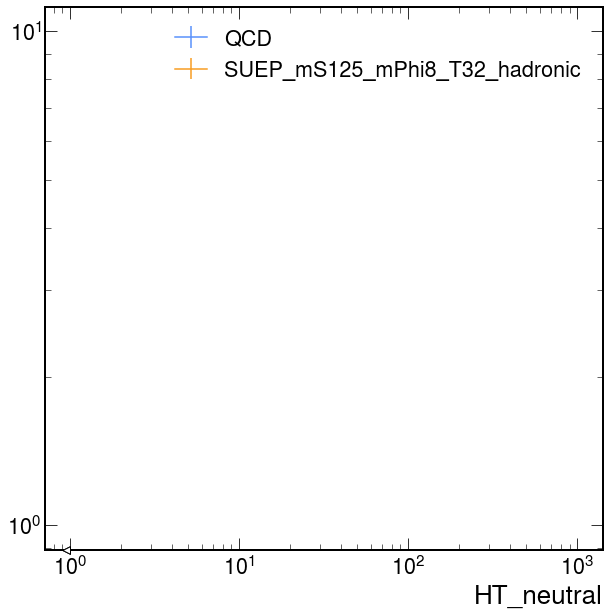

In [17]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["HT_neutral_vs_HT_charged_vs_nMuon"][:, ::sum, 6j::sum]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.show()

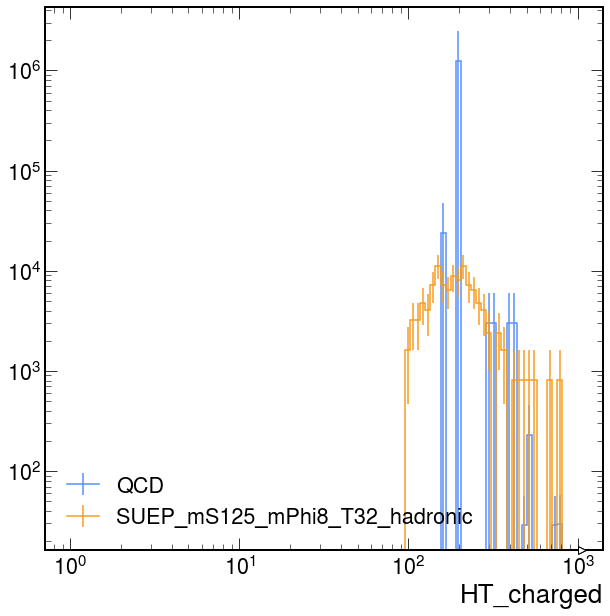

In [18]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["HT_neutral_vs_HT_charged_vs_nMuon"][::sum, :, 6j::sum]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.show()

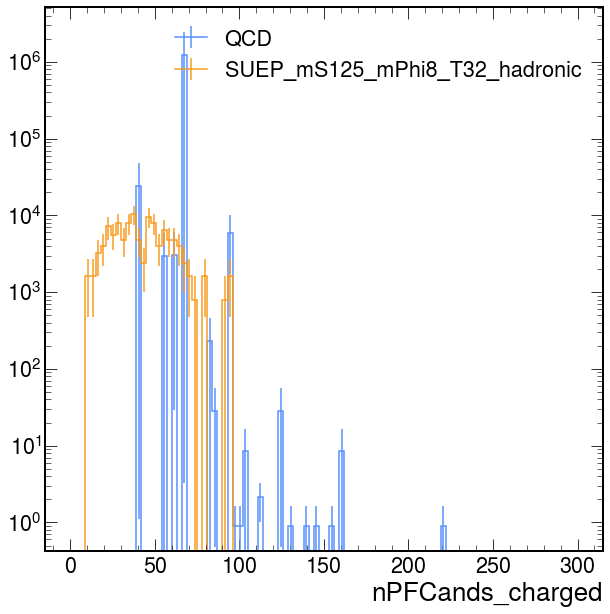

In [19]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["nPFCands_neutral_vs_nPFCands_charged_vs_nMuon"][
        ::sum, :, 6j::sum
    ]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

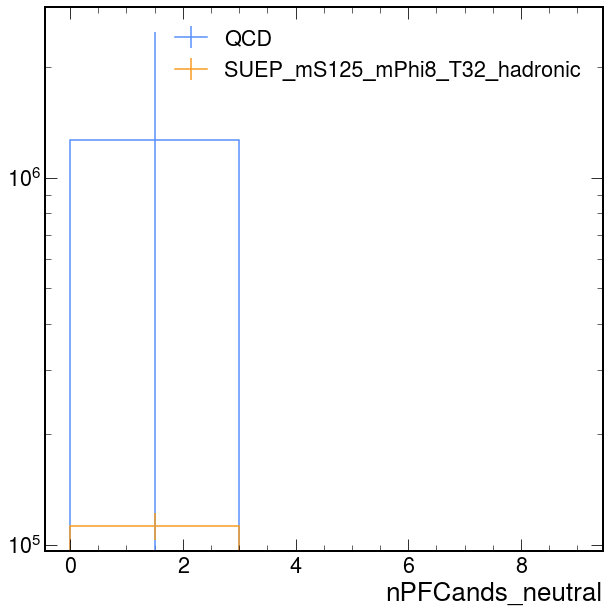

In [21]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["nPFCands_neutral_vs_nPFCands_charged_vs_nMuon"][
        :10j, ::sum, 6j::sum
    ]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

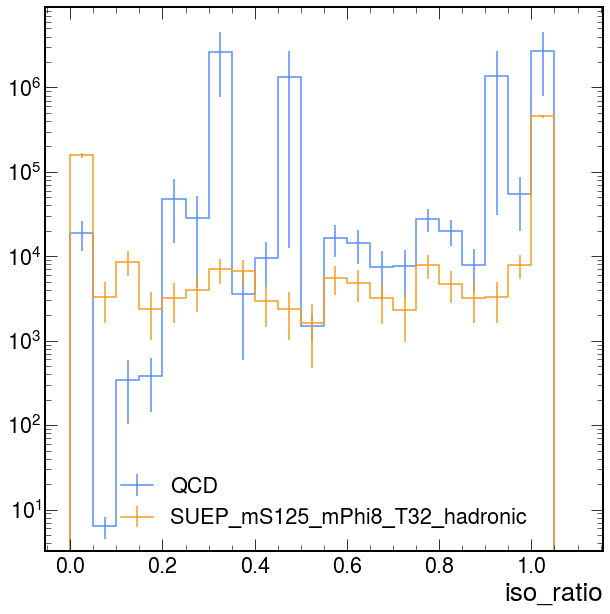

In [10]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["iso_ratio_vs_nMuon"][::2j, 6j::sum]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

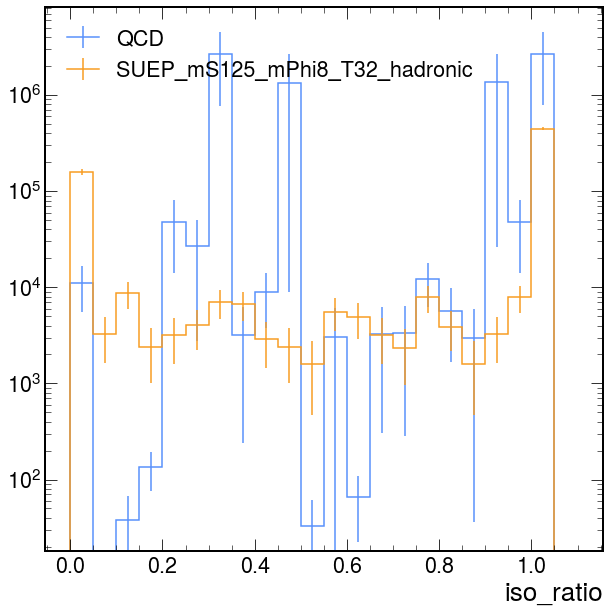

In [11]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["iso_ratio_vs_nMuon_iso_cut"][::2j, 6j::sum]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

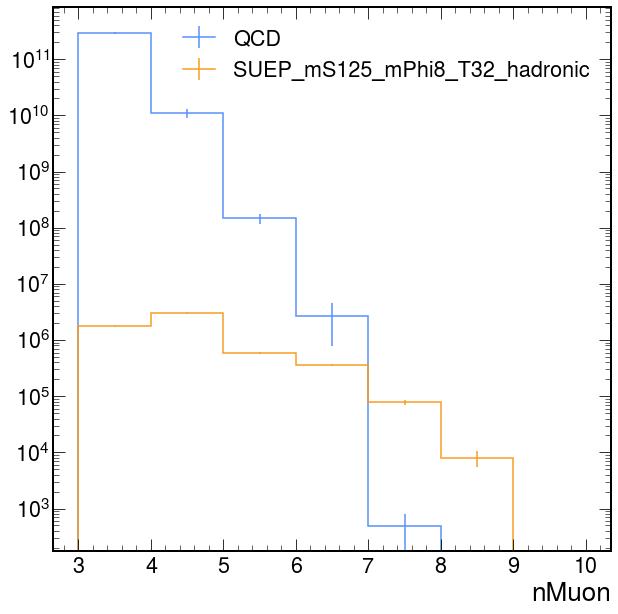

In [14]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["iso_ratio_vs_nMuon_iso_cut"][1j::sum, :]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

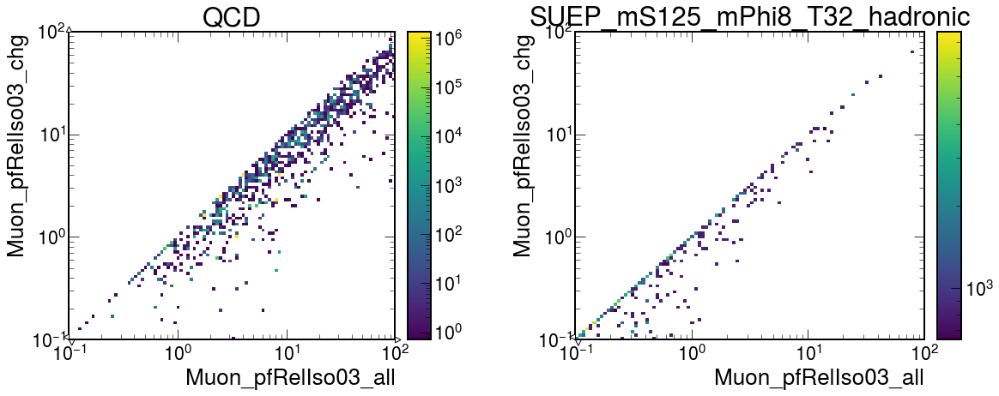

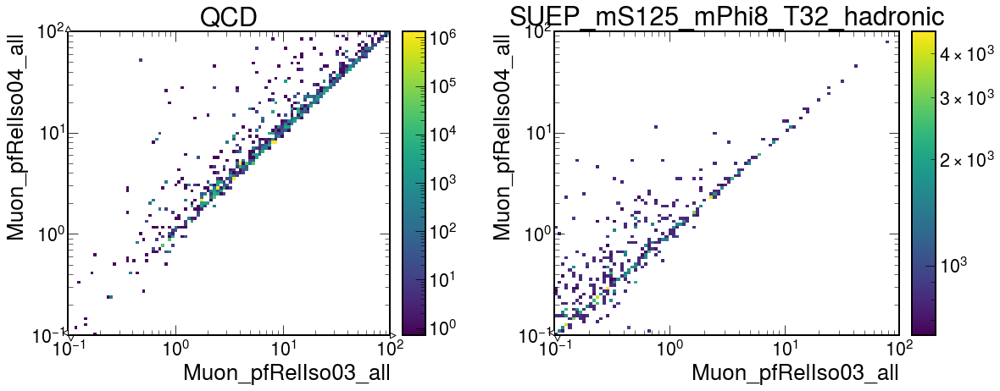

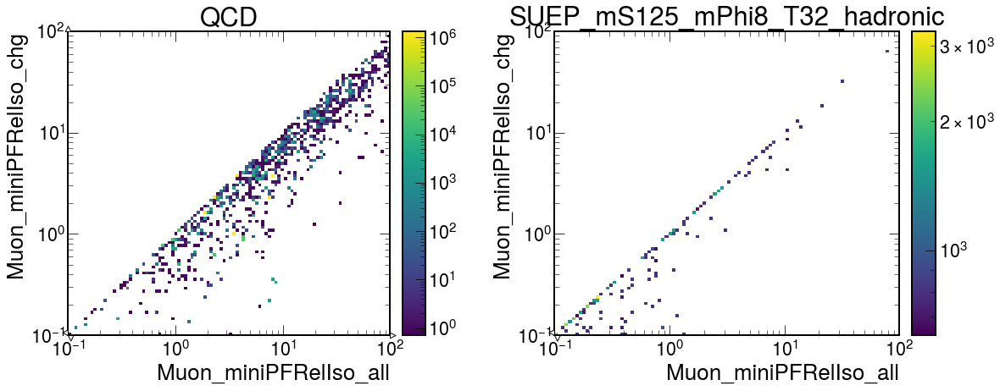

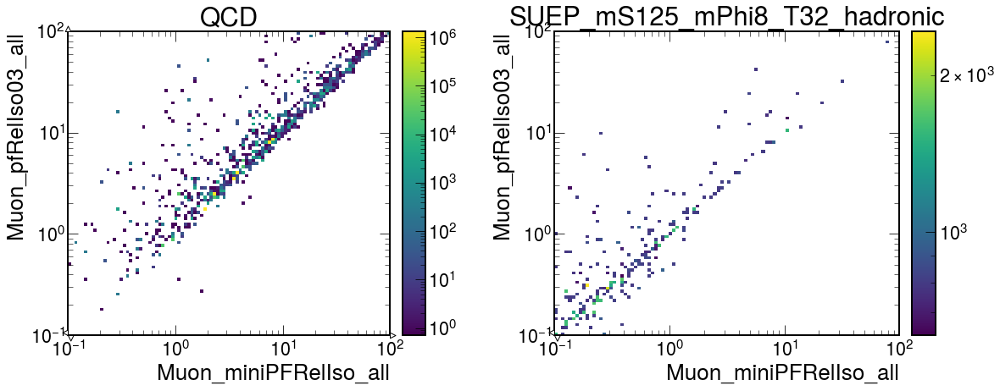

In [12]:
hist_names = [
    "Muon_pfRelIso03_all_vs_Muon_pfRelIso03_chg_vs_nMuon",
    "Muon_pfRelIso03_all_vs_Muon_pfRelIso04_all_vs_nMuon",
    "Muon_miniPFRelIso_all_vs_Muon_miniPFRelIso_chg_vs_nMuon",
    "Muon_miniPFRelIso_all_vs_Muon_pfRelIso03_all_vs_nMuon",
]

processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for h_name in hist_names:
    fig, axs = plt.subplots(1, 2, figsize=(15, 7))
    for p, ax in zip(processes, axs):
        histogram = plots[p][h_name][:, :, 6j::sum]
        histogram.plot2d(norm=mpl.colors.LogNorm(), ax=ax)
        ax.set_title(
            p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", "")
        )
        ax.set_xscale("log")
        ax.set_yscale("log")
    plt.tight_layout()
    plt.show()

In [31]:
np.logspace(-1, 2, 12)[:-1]

array([ 0.1       ,  0.18738174,  0.35111917,  0.65793322,  1.23284674,
        2.3101297 ,  4.32876128,  8.11130831, 15.19911083, 28.48035868,
       53.36699231])

In [30]:
hist.Hist.new.Regular(11, 0.1, 100, transform=hist.axis.transform.log).Double().axes[
    0
].edges

array([  0.1       ,   0.18738174,   0.35111917,   0.65793322,
         1.23284674,   2.3101297 ,   4.32876128,   8.11130831,
        15.19911083,  28.48035868,  53.36699231, 100.        ])

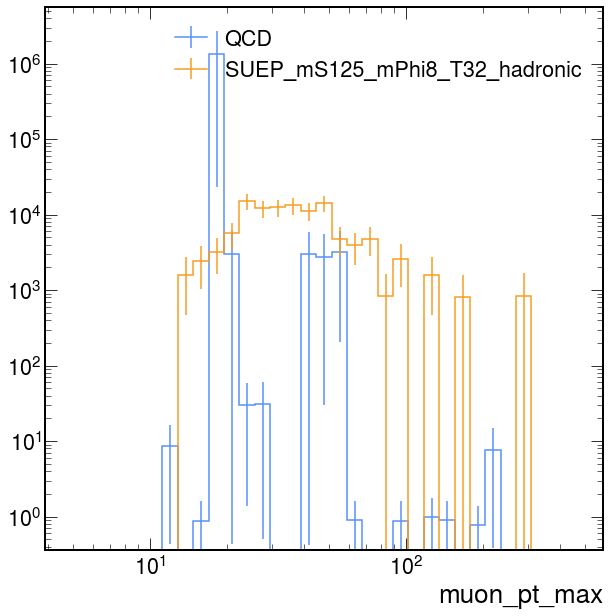

In [46]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["muon_pt_max"][5j:500j:2j, 6j::sum]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        label=p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""),
    )
plt.legend()
plt.xscale("log")
plt.yscale("log")
plt.show()

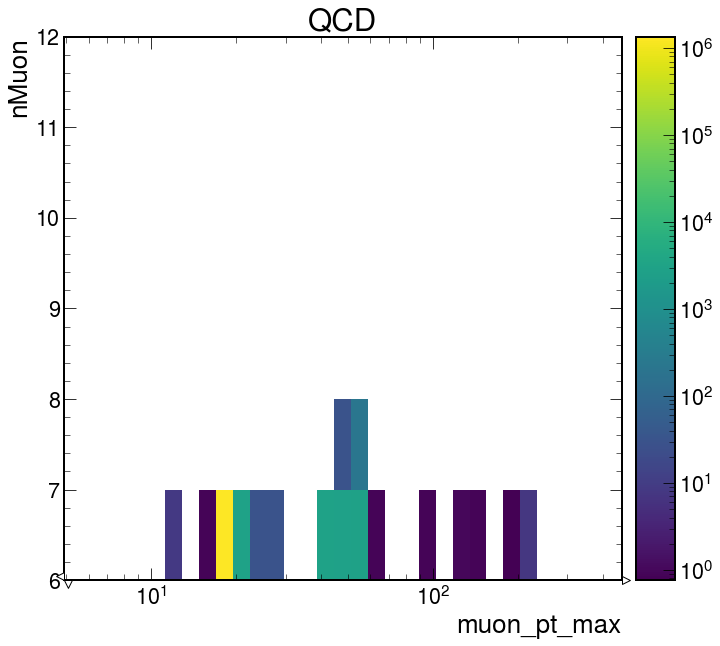

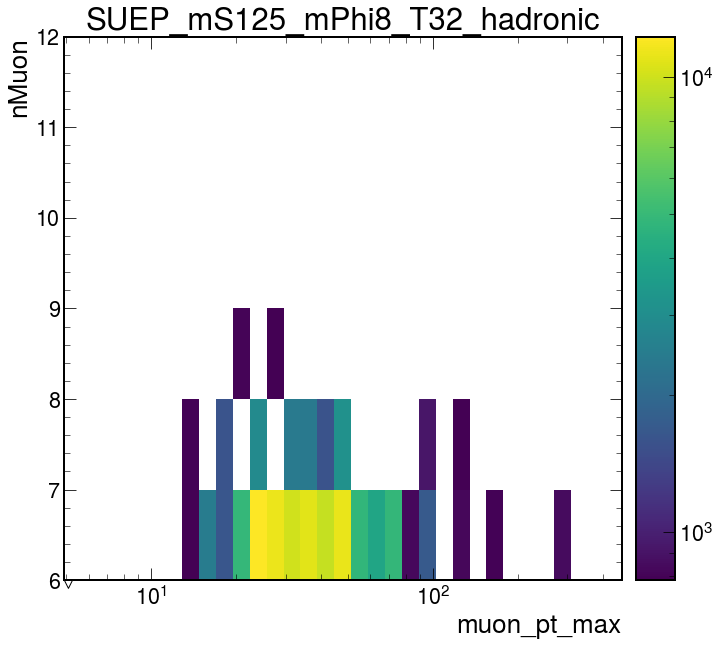

In [39]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #     'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #     'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    histogram = plots[p]["muon_pt_max"][5j:500j:2j, 6j:]
    histogram.plot2d(
        norm=mpl.colors.LogNorm(),
    )
    plt.title(p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""))
    plt.xscale("log")
    plt.show()

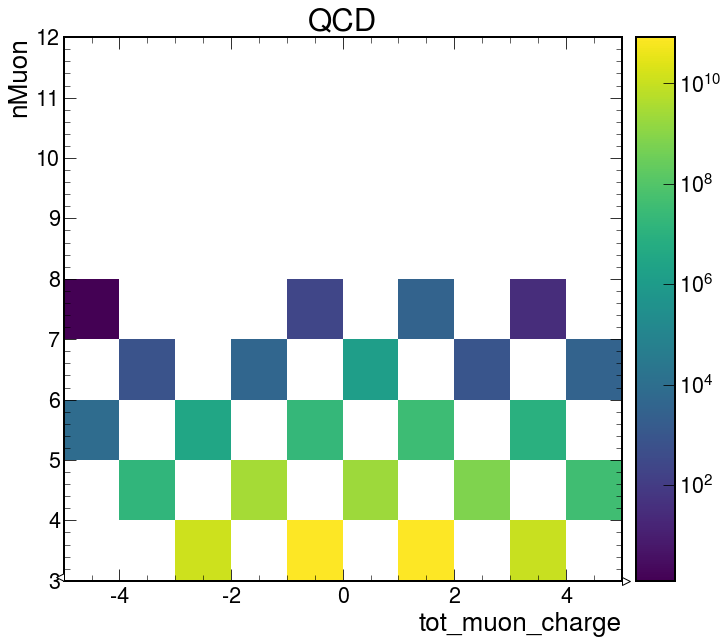

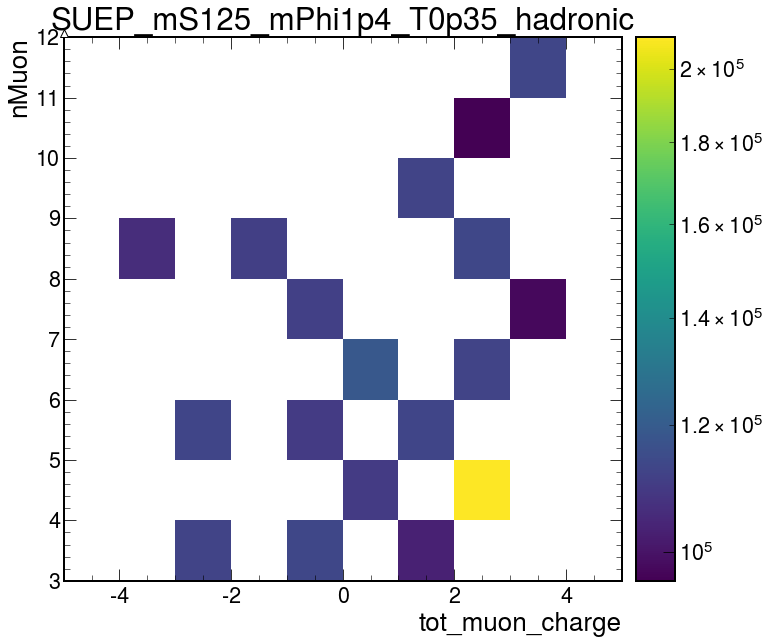

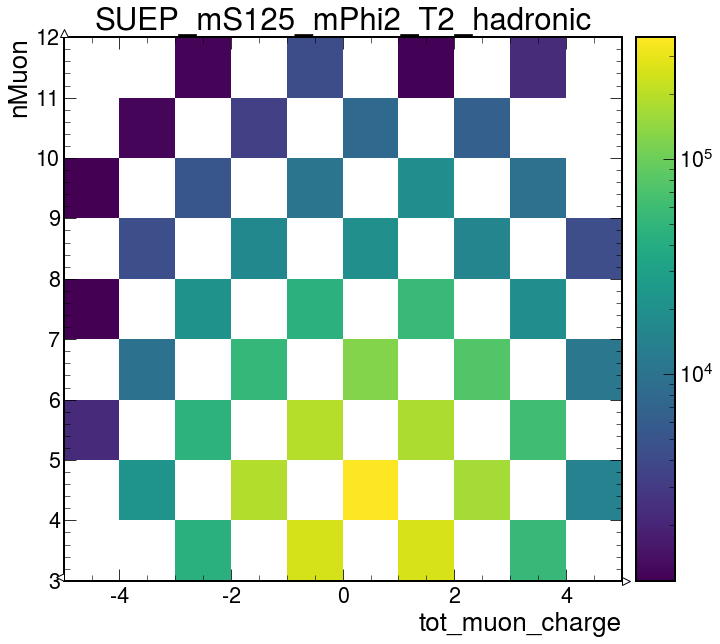

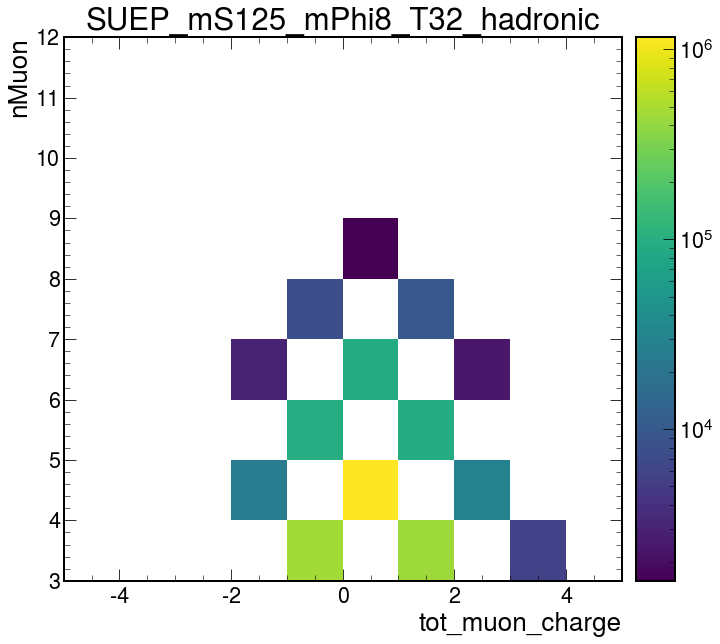

In [27]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    if plots[p]["tot_muon_charge_vs_nMuon"].sum().value == 0:
        continue
    plots[p]["tot_muon_charge_vs_nMuon"].plot(
        norm=mpl.colors.LogNorm(),
    )
    # plt.xscale('log')
    plt.title(p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""))
    plt.show()

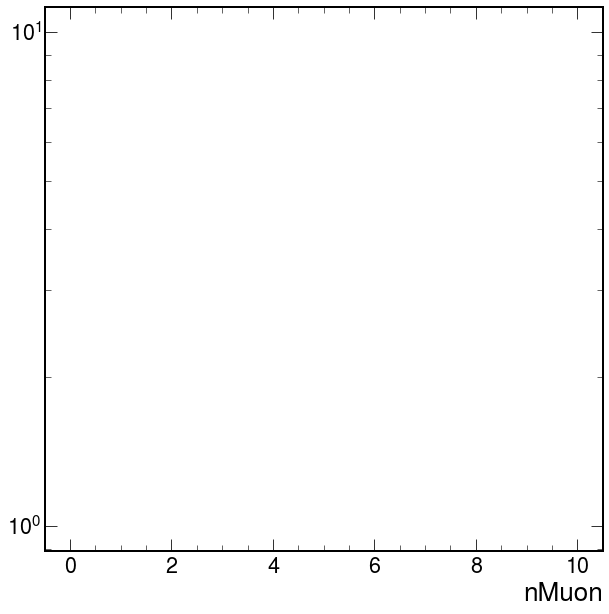

In [54]:
plots["QCD_Pt_MuEnriched_2018"]["nMuon"].plot()
plt.yscale("log")

In [55]:
plots["QCD_Pt_MuEnriched_2018"][
    "b_vetoed_vs_iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson"
][True, 99.1j, :, ::sum, ::sum].values()

array([8.30578770e+09, 1.38434017e+08, 3.14711514e+03, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00])

## Compare nMuon plots before and after cuts

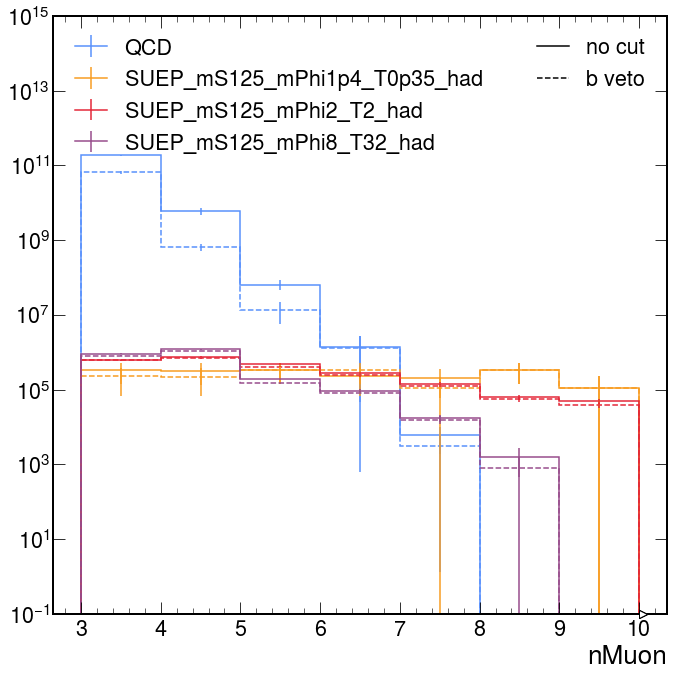

In [74]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

fig, ax = plt.subplots(1, 1, figsize=(11, 11))

for i, p in enumerate(processes):
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].plot(
        yerr=np.sqrt(
            plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].variances()
        ),
        label=p.replace("_2018", "")
        .replace("mode", "")
        .replace("_Pt_MuEnriched", "")
        .replace("hadronic", "had"),
        color=f"C{i}",
        ax=ax,
    )
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson_b_veto"][:, ::sum, ::sum].plot(
        yerr=np.sqrt(
            plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson_b_veto"][
                :, ::sum, ::sum
            ].variances()
        ),
        color=f"C{i}",
        ls="--",
        ax=ax,
    )
plt.ylim(1e-1, 1e15)
legend1 = plt.legend(loc=2)
ax.add_artist(legend1)
plt.yscale("log")

(l1,) = ax.plot([], "-", color="black")
(l2,) = ax.plot([], "--", color="black")
plot_lines = [l1, l2]
plt.legend([l for l in plot_lines], ["no cut", "b veto"], loc=1)

plt.show()

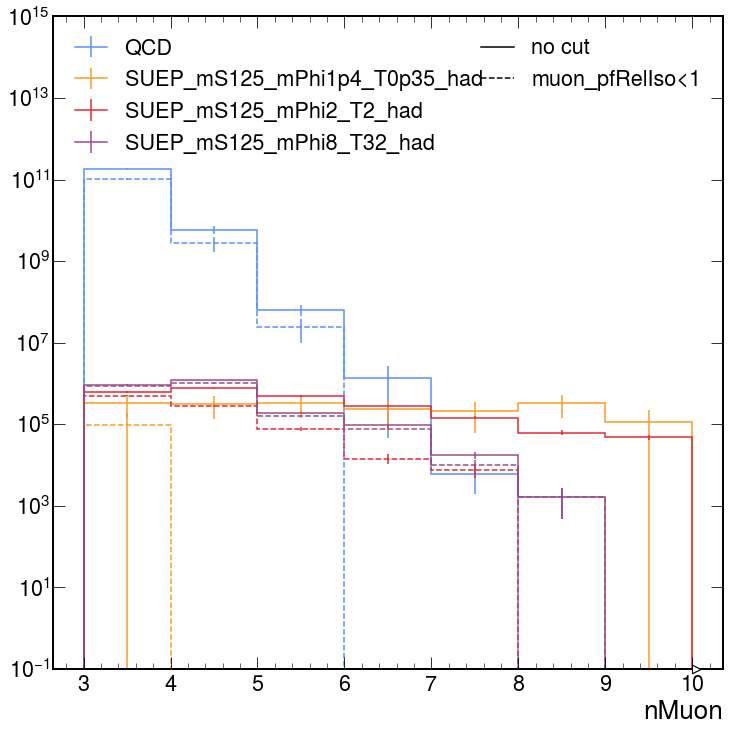

In [80]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

for i, p in enumerate(processes):
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].plot(
        yerr=np.sqrt(
            plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].variances()
        ),
        label=p.replace("_2018", "")
        .replace("mode", "")
        .replace("_Pt_MuEnriched", "")
        .replace("hadronic", "had"),
        color=f"C{i}",
        ax=ax,
    )
    plots[p]["iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson_iso_cut"][
        1.1j, :, ::sum, ::sum
    ].plot(
        yerr=np.sqrt(
            plots[p]["iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson_iso_cut"][
                1.1j, :, ::sum, ::sum
            ].variances()
        ),
        color=f"C{i}",
        ls="--",
        ax=ax,
    )
plt.ylim(1e-1, 1e15)
legend1 = plt.legend(loc=2)
ax.add_artist(legend1)
plt.yscale("log")

(l1,) = plt.plot([], "-", color="black")
(l2,) = plt.plot([], "--", color="black")
plot_lines = [l1, l2]
plt.legend([l for l in plot_lines], ["no cut", "muon_pfRelIso<1"], loc=1)

plt.show()

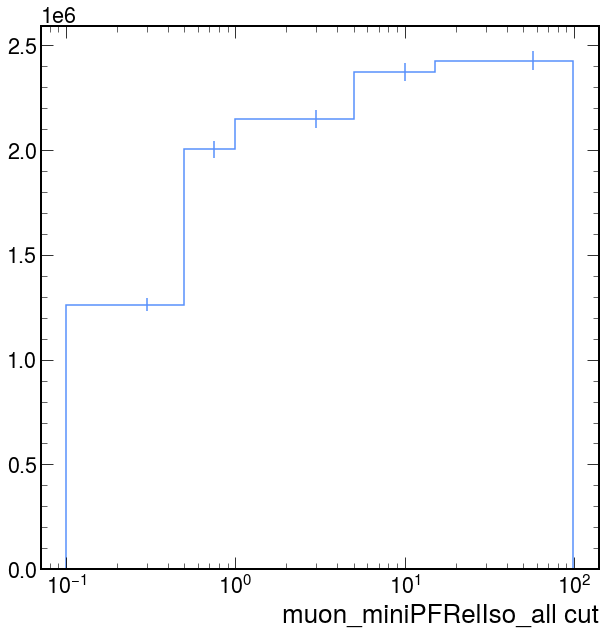

In [26]:
plots[p]["iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson_iso_cut"][
    :, ::sum, ::sum, ::sum
].plot()
plt.xscale("log")

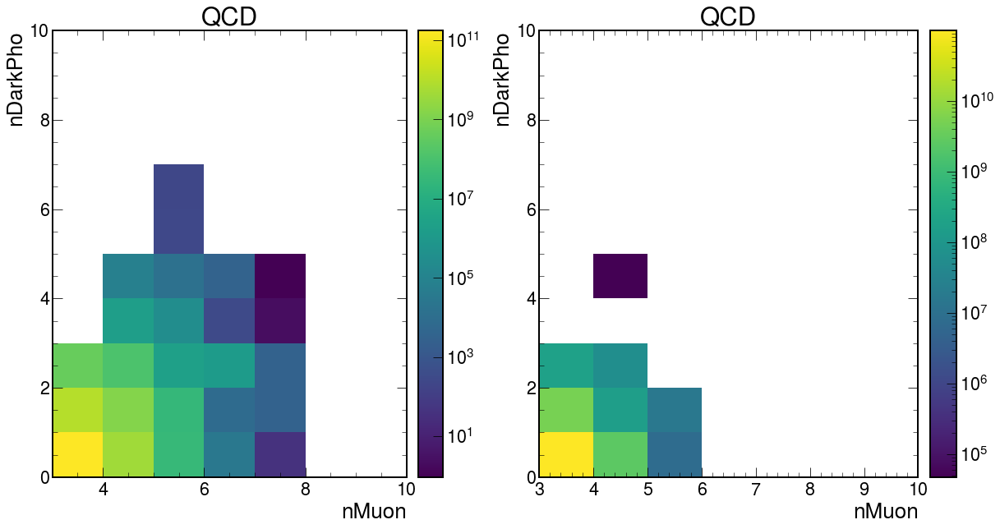

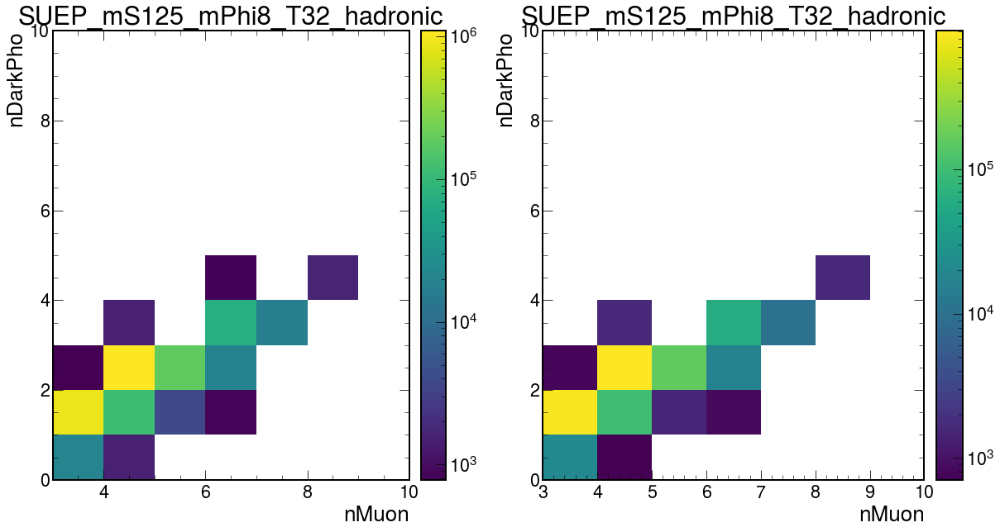

In [83]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    #'SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018',
    #'SUEP_mS125_mPhi2_T2_modehadronic_2018',
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    fig, axs = plt.subplots(1, 2, figsize=(17, 10))
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, :, ::sum].plot(
        norm=mpl.colors.LogNorm(), ax=axs[0]
    )
    plt.title(p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""))
    plots[p]["iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson_iso_cut"][
        1.1j, :, :, ::sum
    ].plot(norm=mpl.colors.LogNorm(), ax=axs[1])
    plt.title(p.replace("_2018", "").replace("mode", "").replace("_Pt_MuEnriched", ""))
    plt.show()

In [84]:
from iminuit import Minuit
from iminuit.cost import LeastSquares
from jacobi import propagate

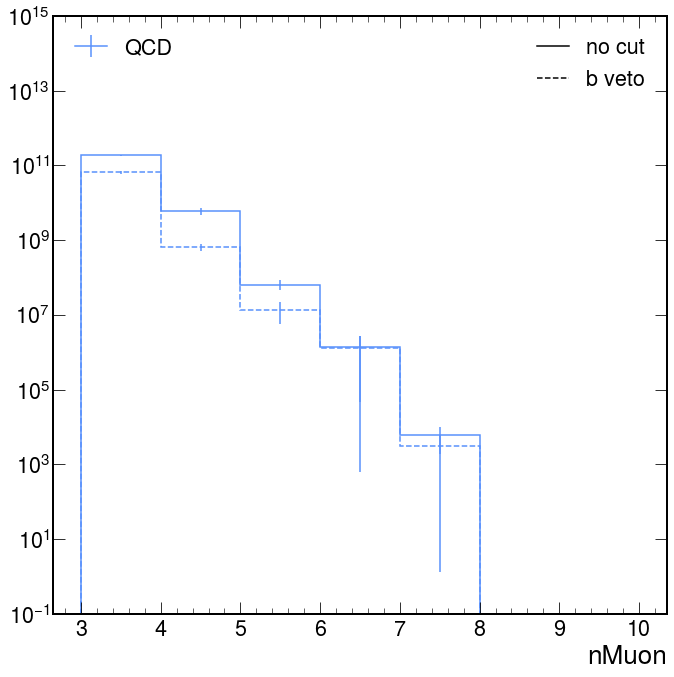

In [85]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]

fig, ax = plt.subplots(1, 1, figsize=(11, 11))

for i, p in enumerate(processes):
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].plot(
        yerr=np.sqrt(
            plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson"][:, ::sum, ::sum].variances()
        ),
        label=p.replace("_2018", "")
        .replace("mode", "")
        .replace("_Pt_MuEnriched", "")
        .replace("hadronic", "had"),
        color=f"C{i}",
        ax=ax,
    )
    plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson_b_veto"][:, ::sum, ::sum].plot(
        yerr=np.sqrt(
            plots[p]["nMuon_vs_nDarkPho_vs_nDarkMeson_b_veto"][
                :, ::sum, ::sum
            ].variances()
        ),
        color=f"C{i}",
        ls="--",
        ax=ax,
    )
plt.ylim(1e-1, 1e15)
legend1 = plt.legend(loc=2)
ax.add_artist(legend1)
plt.yscale("log")

(l1,) = ax.plot([], "-", color="black")
(l2,) = ax.plot([], "--", color="black")
plot_lines = [l1, l2]
plt.legend([l for l in plot_lines], ["no cut", "b veto"], loc=1)

plt.show()

In [26]:
plots["QCD_Pt_MuEnriched_2018"][hist_name].axes[0]

Variable([0.1, 0.5, 1, 5, 15, 99], name='muon_miniPFRelIso_all cut')

In [35]:
def nMuon_func(x, a, b):
    return a * 10 ** (-b * x)


def binomial(n, k, p):
    q = 1 - p
    coeff = math.factorial(n) / (math.factorial(k) * math.factorial(n - k))
    return coeff * (p**k) * (q ** (n - k))


def reweight_hist_binomially(h_i, a, p):
    h_f = h_i.copy().reset()
    edges = h_i.axes[0].edges.astype(int)
    for i in range(edges[0], edges[-1]):
        tot_val, tot_var = a * h0[i * 1j].value, a * h0[i * 1j].variance
        for j in range(edges[0], i + 1):
            weight = binomial(i, j, p)
            h_f[j * 1j] += hist.accumulators.WeightedSum(
                weight * tot_val, weight * tot_var
            )
    return h_f


def reweight_hist_binomially_for_fit(data_x, a, p):
    y_out = np.zeros_like(data_y0)
    for i in range(len(data_x)):
        x_i = data_x[i]
        tot_val = a * data_y0[i]
        for j in range(0, i + 1):
            x_j = data_x[j]
            weight = binomial(int(x_i), int(x_j), p)
            y_out[j] += weight * tot_val
    return y_out


def qcd_estimate_plot(iso_cut=15, nMuon_cut=0):
    suffix = "MuEnrichedPt5_TuneCP5_13TeV-pythia8_histograms_normalized_2018"
    qcd_bins = [
        f"QCD_Pt-15To20_{suffix}",
        f"QCD_Pt-20To30_{suffix}",
        f"QCD_Pt-30To50_{suffix}",
        f"QCD_Pt-50To80_{suffix}",
        f"QCD_Pt-80To120_{suffix}",
        f"QCD_Pt-120To170_{suffix}",
        f"QCD_Pt-170To300_{suffix}",
        f"QCD_Pt-300To470_{suffix}",
        f"QCD_Pt-470To600_{suffix}",
        f"QCD_Pt-600To800_{suffix}",
        f"QCD_Pt-800To1000_{suffix}",
        f"QCD_Pt-1000_{suffix}",
    ]
    h_name = "nMuon_vs_nDarkPho_vs_nDarkMeson"
    a_values_fitted = []
    p_values_fitted = []
    for qcd_bin in qcd_bins:
        h0 = plots[qcd_bin][h_name][:, ::sum, ::sum]
        h1 = plots[qcd_bin][f"iso_cut_vs_{h_name}_iso_cut"][
            iso_cut * 1.1j, :, ::sum, ::sum
        ]

        # Power law fit for hist without iso cut
        data_x = h0.axes[0].edges[:-1]
        data_y = h0.values()
        data_yerr = np.sqrt(h0.variances())
        not_zero = (data_yerr > 0) & (data_y > 0)
        data_x = data_x[not_zero]
        data_y = data_y[not_zero]
        data_yerr = data_yerr[not_zero]
        least_squares = LeastSquares(data_x, data_y, data_yerr, nMuon_func)
        m = Minuit(least_squares, a=1e15, b=1.5)
        m.migrad()
        m.hesse()
        h0_fit = h0.copy().reset()
        x_inference = h0_fit.axes[0].edges[:-1]
        fit_values = nMuon_func(x_inference, m.values["a"], m.values["b"])
        y, ycov = propagate(
            lambda p: nMuon_func(x_inference, *p), m.values, m.covariance
        )
        yerr_prop = np.diag(ycov) ** 0.5
        for ii in range(len(fit_values)):
            h0_fit[ii] = (fit_values[ii], yerr_prop[ii] ** 2)

        data_x = h1.axes[0].edges[:-1]
        global data_y0
        data_y0 = h0_fit.values()
        data_y = h1.values()
        data_yerr = np.sqrt(h1.variances())
        not_zero = (data_yerr > 0) & (data_y > 0)
        data_x, data_y0, data_y, data_yerr = (
            data_x[not_zero],
            data_y0[not_zero],
            data_y0[not_zero],
            data_y0[not_zero],
        )
        least_squares = LeastSquares(
            data_x, data_y, data_yerr, reweight_hist_binomially_for_fit
        )
        m = Minuit(least_squares, a=1, p=1)
        m.limits = [(0, None), (0, 1)]
        m.migrad()
        m.hesse()
        a_values_fitted.append(m.values["a"])
        p_values_fitted.append(m.values["p"])

    print(a_values_fitted)
    print(p_values_fitted)

    h2 = plots["QCD_Pt_MuEnriched_2018"][h_name][:, ::sum, ::sum].copy().reset()

    k = 0
    for a_value, p_value, qcd_bin in zip(a_values_fitted, p_values_fitted, qcd_bins):
        h_i_0 = plots[qcd_bin][h_name][:, ::sum, ::sum]

        # Power law fit for hist without iso cut
        data_x = h_i_0.axes[0].edges[:-1]
        data_y = h_i_0.values()
        data_yerr = np.sqrt(h_i_0.variances())
        not_zero = (data_yerr > 0) & (data_y > 0)
        data_x = data_x[not_zero]
        data_y = data_y[not_zero]
        data_yerr = data_yerr[not_zero]
        least_squares = LeastSquares(data_x, data_y, data_yerr, nMuon_func)
        m = Minuit(least_squares, a=1e15, b=1.5)
        m.migrad()
        m.hesse()
        h_i_0_fit = h_i_0.copy().reset()
        x_inference = h_i_0_fit.axes[0].edges[:-1]
        fit_values = nMuon_func(x_inference, m.values["a"], m.values["b"])
        y, ycov = propagate(
            lambda p: nMuon_func(x_inference, *p), m.values, m.covariance
        )
        yerr_prop = np.diag(ycov) ** 0.5
        for ii in range(len(fit_values)):
            h_i_0_fit[ii] = (fit_values[ii], yerr_prop[ii] ** 2)

        h_i = h_i_0_fit.copy().reset()
        for i in range(3, 10):
            tot_val, tot_var = (
                a_value * h_i_0_fit[i * 1j].value,
                a_value * h_i_0_fit[i * 1j].variance,
            )
            for j in range(3, i + 1):
                weight = binomial(i, j, p_value)
                h_i[j * 1j] += hist.accumulators.WeightedSum(
                    weight * tot_val, weight**2 * tot_var
                )
        h2 += h_i

    return h2

nMuon = 8: 0.0030 ± 0.0015

nMuon = 9: 0.0000 ± 0.0000

nMuon = 10: 0.0000 ± 0.0000

nMuon = 11: 0.0000 ± 0.0000

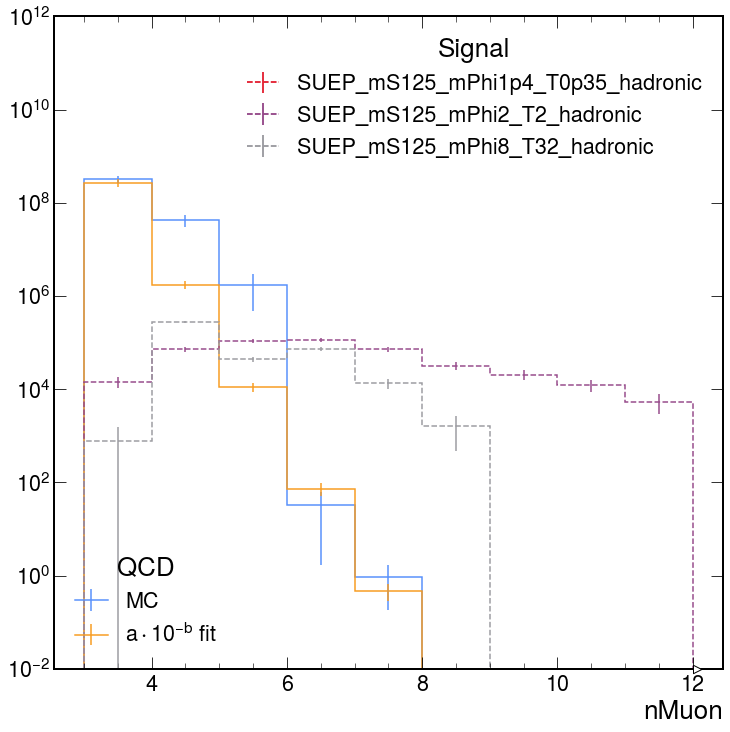

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

hist_name = "iso_cut_vs_nMuon_vs_nDarkPho_vs_nDarkMeson_iso_cut"
muon_iso_cut = 15
slc = (muon_iso_cut * 1.1j, slice(None), slice(None, None, sum), slice(1j, None, sum))
histogram = plots["QCD_Pt_MuEnriched_2018"][hist_name]
h0 = histogram[slc]

data_x = h0.axes[0].edges[:-1]
data_y = h0.values()
data_yerr = np.sqrt(h0.variances())

not_zero = (data_yerr > 0) & (data_y > 0)
data_x = data_x[not_zero]
data_y = data_y[not_zero]
data_yerr = data_yerr[not_zero]

least_squares = LeastSquares(data_x, data_y, data_yerr, nMuon_func)
m = Minuit(least_squares, a=1e15, b=1.5)
m.migrad()
m.hesse()

h1 = hist.Hist.new.Reg(9, 3, 12, name="nMuon", label="fit").Weight()
x_inference = h1.axes[0].edges[:-1]
fit_values = nMuon_func(x_inference, m.values["a"], m.values["b"])
y, ycov = propagate(lambda p: nMuon_func(x_inference, *p), m.values, m.covariance)
yerr_prop = np.diag(ycov) ** 0.5
for ii in range(len(fit_values)):
    h1[ii] = (fit_values[ii], yerr_prop[ii] ** 2)

for i in range(8, 12):
    print(f"nMuon = {i}: {h1[i*1j].value:.4f} ± {np.sqrt(h1[i*1j].variance):.4f}")

h0.plot(label="MC", yerr=np.sqrt(h0.variances()))
h1.plot(label=r"$a\cdot10^{-b}$ fit", yerr=np.sqrt(h1.variances()))

# h2 = qcd_estimate_plot(iso_cut=muon_iso_cut, nMuon_cut=0)
# h2.plot(label="binomial fit", yerr=np.sqrt(h2.variances()))

plt.yscale("log")
plt.ylim(1e-2, 1e12)
legend1 = plt.legend(title="QCD", loc=3)
ax.add_artist(legend1)

signal_points = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
h_s_arr = []
for s in signal_points:
    h_s = plots[s][hist_name][slc].plot(
        yerr=np.sqrt(plots[s][hist_name][slc].variances()), ls="--"
    )
    h_s_arr.append(h_s[0])
plt.legend(
    h_s_arr,
    [s.replace("_2018", "").replace("mode", "") for s in signal_points],
    title="Signal",
    loc=1,
)

plt.show()

[StairsArtists(stairs=<matplotlib.patches.StepPatch object at 0x7f4a28339310>, errorbar=<ErrorbarContainer object of 3 artists>, legend_artist=<ErrorbarContainer object of 3 artists>)]

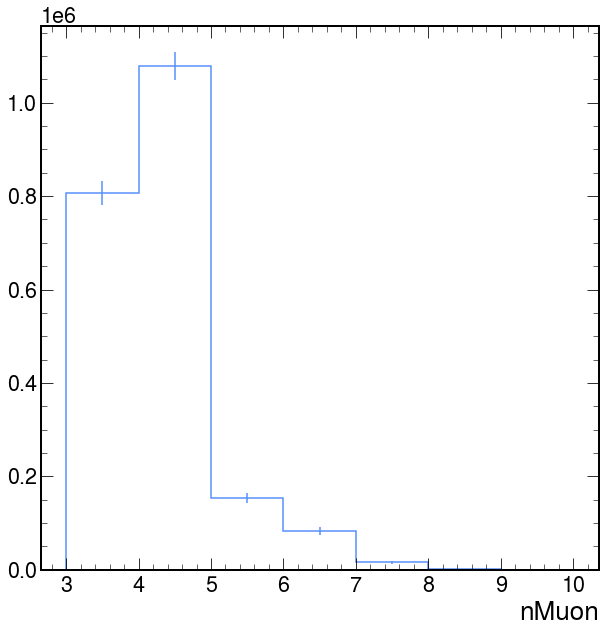

In [15]:
plots[s][hist_name][:, ::sum, ::sum].plot(
    yerr=np.sqrt(plots[s][hist_name][:, ::sum, ::sum].variances()),
    label=s.replace("_2018", "").replace("mode", ""),
)

## Other plots

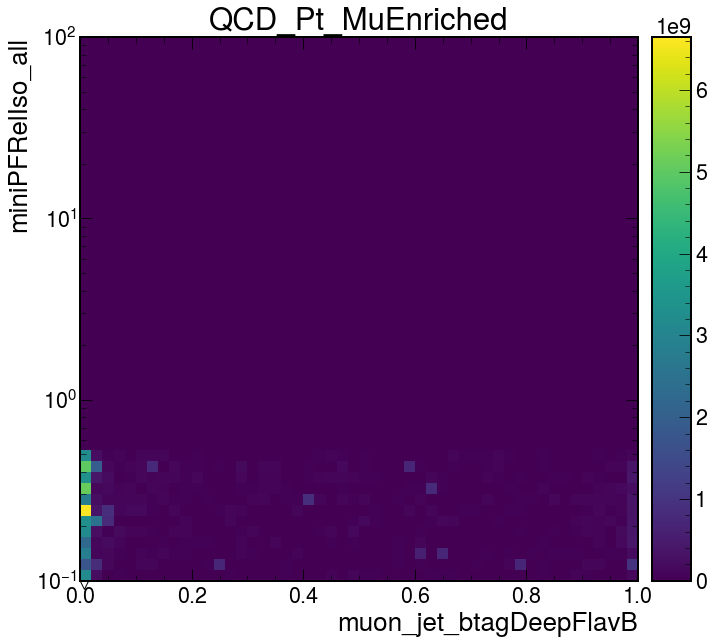

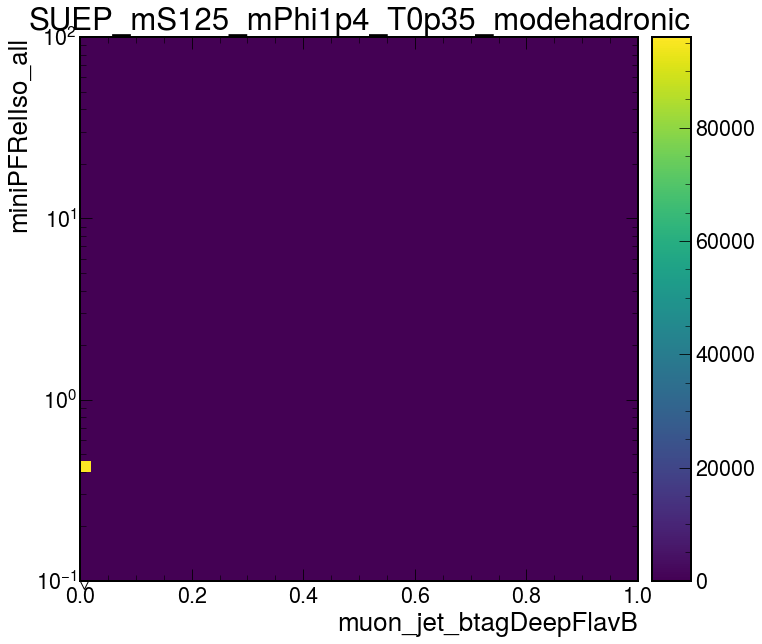

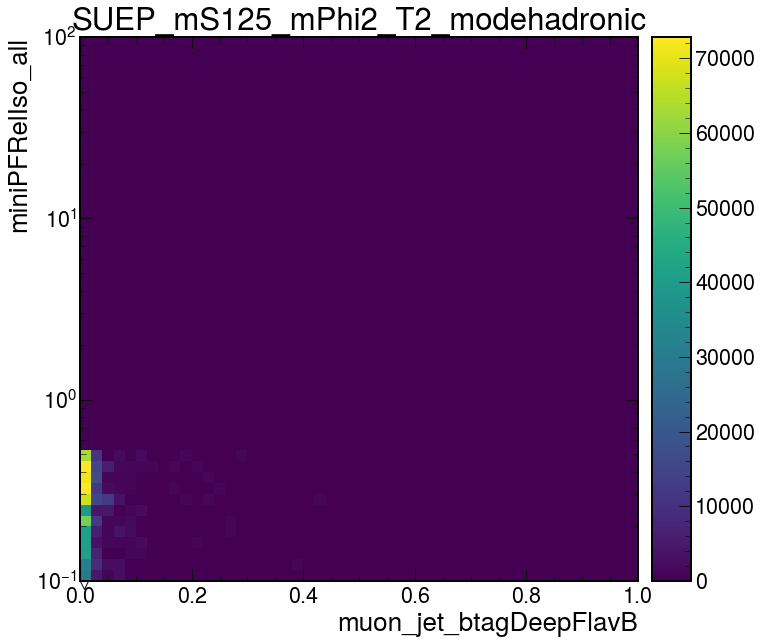

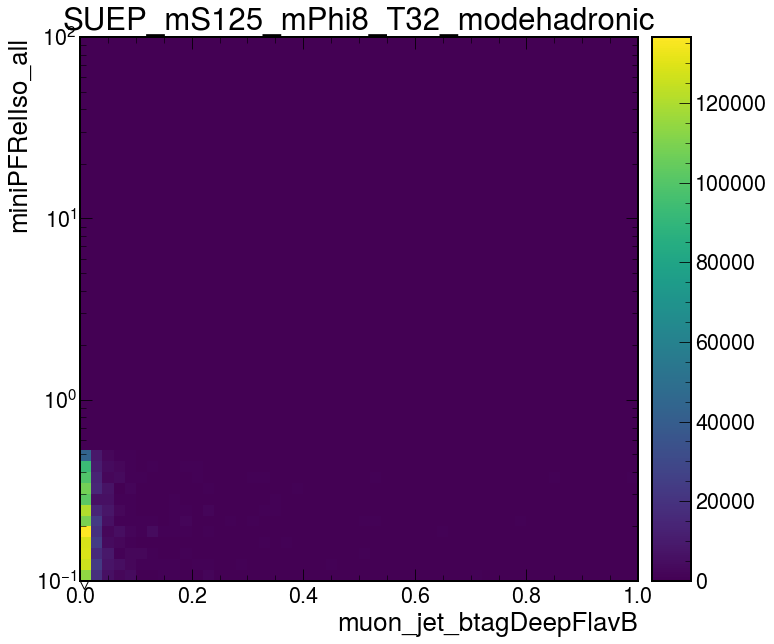

In [34]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p][
        "muon_jet_btagDeepFlavB_vs_miniPFRelIso_all"
    ].plot2d()  # norm=mpl.colors.LogNorm())
    plt.title(p[:-5])
    plt.yscale("log")
    plt.show()

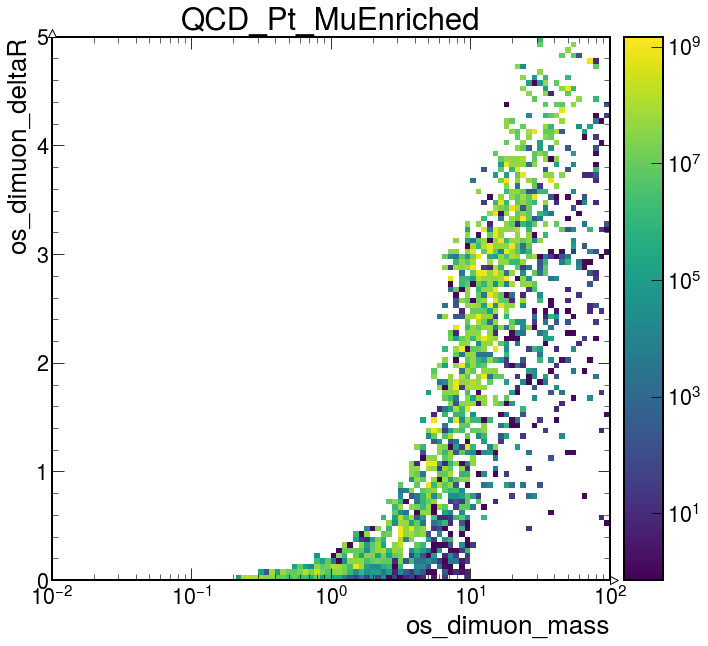

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x7f94165b1620> (for post_execute), with arguments args (),kwargs {}:


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 770.4x720 with 2 Axes>

In [35]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["os_dimuon_mass_vs_deltaR"].plot2d(norm=mpl.colors.LogNorm())
    plt.title(p[:-5])
    plt.xscale("log")
    plt.show()

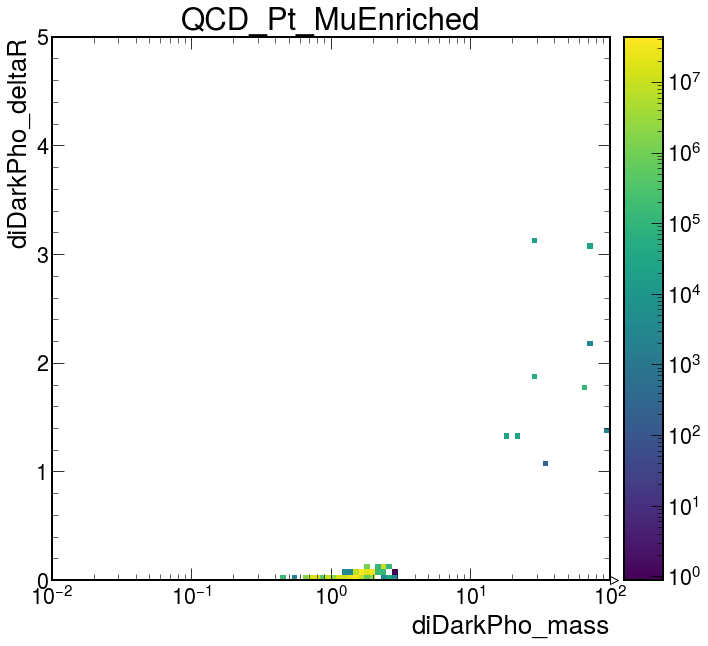

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x7f94165b1620> (for post_execute), with arguments args (),kwargs {}:


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 770.4x720 with 2 Axes>

In [12]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["diDarkPho_mass_vs_deltaR"].plot2d(norm=mpl.colors.LogNorm())
    plt.title(p[:-5])
    plt.xscale("log")
    plt.show()

In [13]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["nDarkPho_vs_nDarkMeson_vs_nMuon"][:, :, 6j::sum].plot2d(
        norm=mpl.colors.LogNorm()
    )
    plt.title(p[:-5])
    plt.show()

ValueError: Invalid vmin or vmax

Error in callback <function _draw_all_if_interactive at 0x7f94165b1620> (for post_execute), with arguments args (),kwargs {}:


ValueError: Invalid vmin or vmax

ValueError: Invalid vmin or vmax

<Figure size 770.4x720 with 2 Axes>

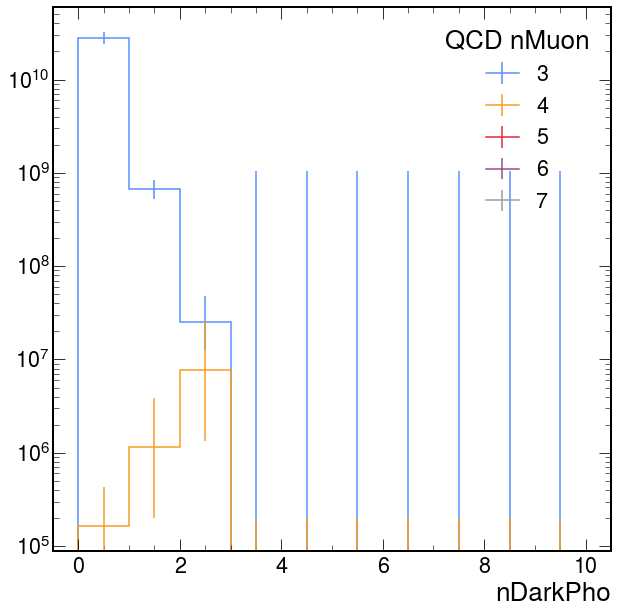

In [36]:
histogram = plots["QCD_Pt_MuEnriched_2018"]["nDarkPho_vs_nDarkMeson_vs_nMuon"]
for nMuon in range(3, 8):
    histogram[:, ::sum, nMuon * 1j].plot(label=f"{nMuon}")
plt.yscale("log")
plt.legend(title="QCD nMuon")
plt.show()

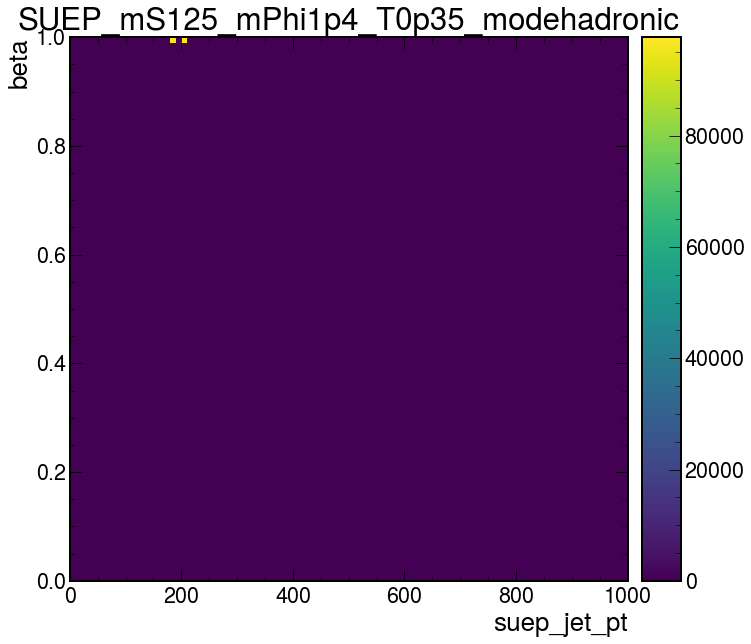

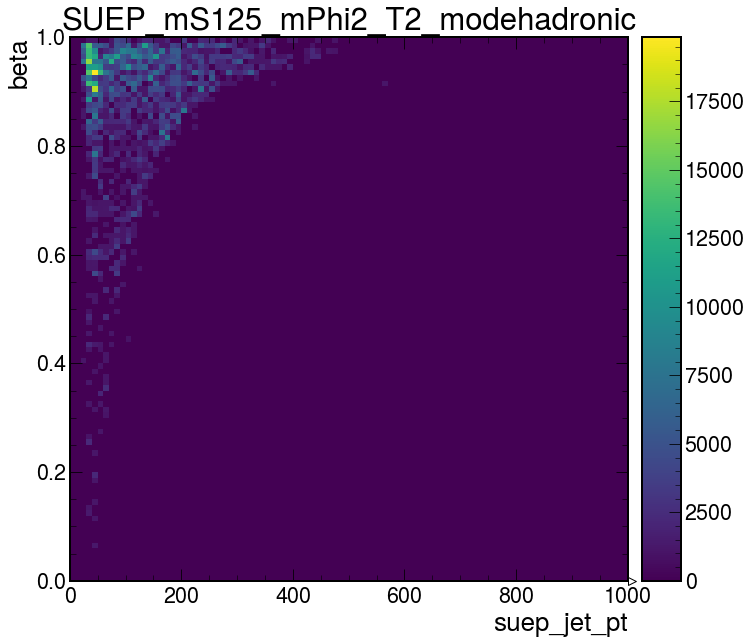

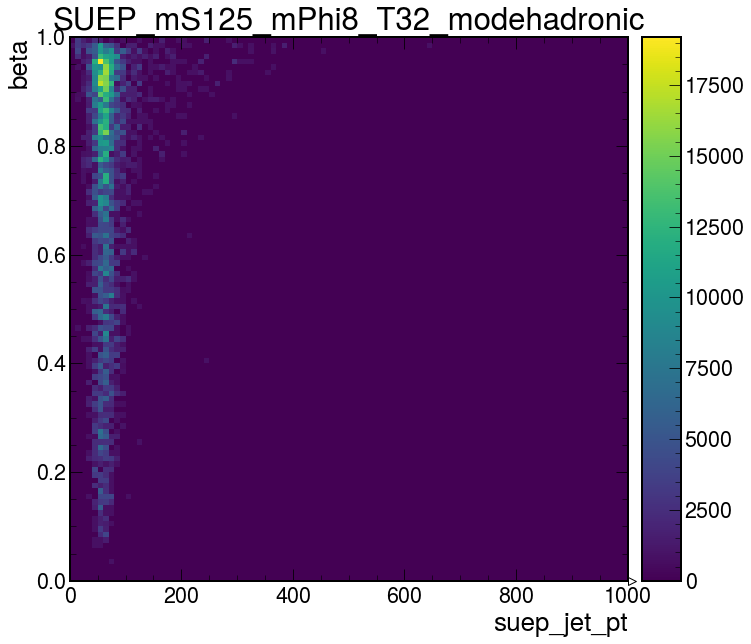

In [15]:
processes = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["suep_jet_pt_vs_beta"].plot2d()
    plt.title(p[:-5])
    plt.show()

[6.63265266e+10 4.19964394e+08 7.92140211e+06 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]

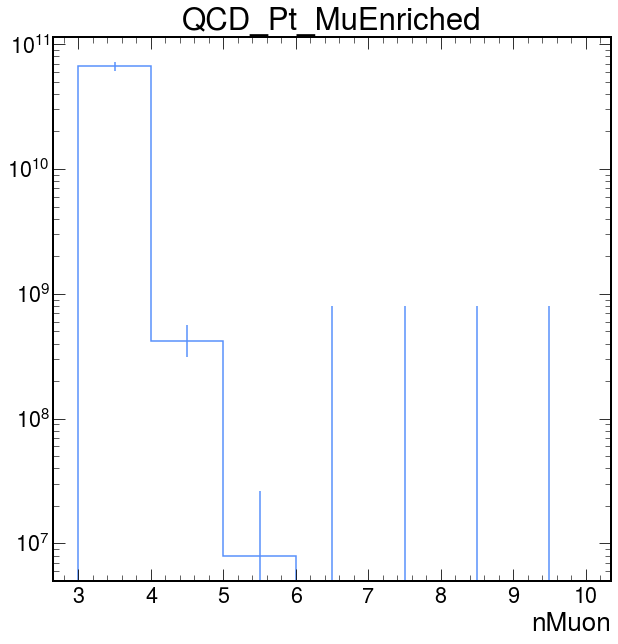

[95958.43565141     0.             0.             0.
     0.             0.             0.        ]

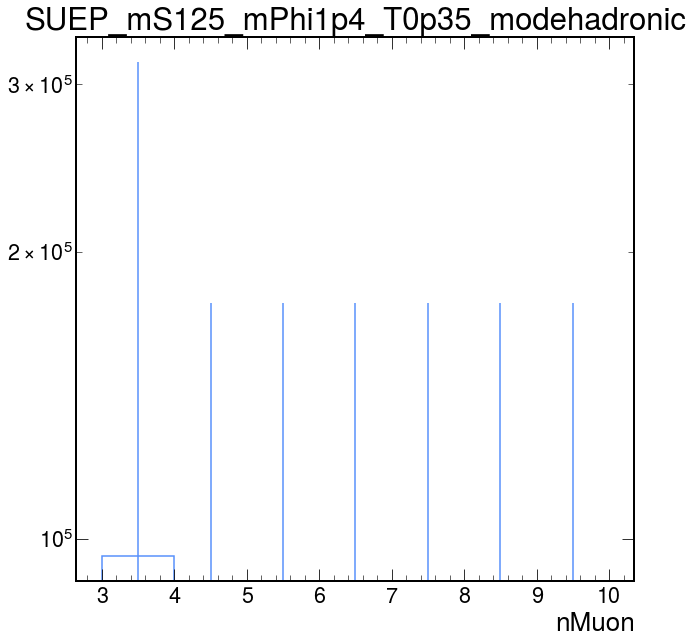

[287889.97775695 119453.33674487  21576.98269624   5602.52295073
      0.              0.              0.        ]

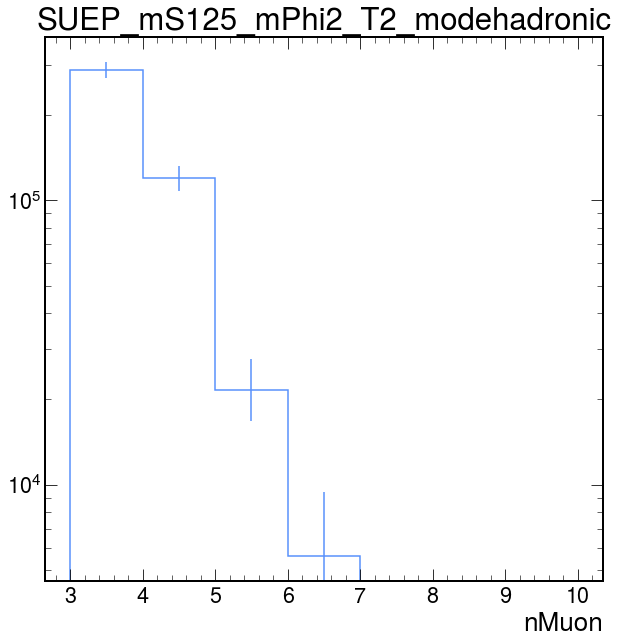

[864149.44165865 938228.53507164 127327.00557435  62016.43713957
   7813.70293672   1594.06877976      0.        ]

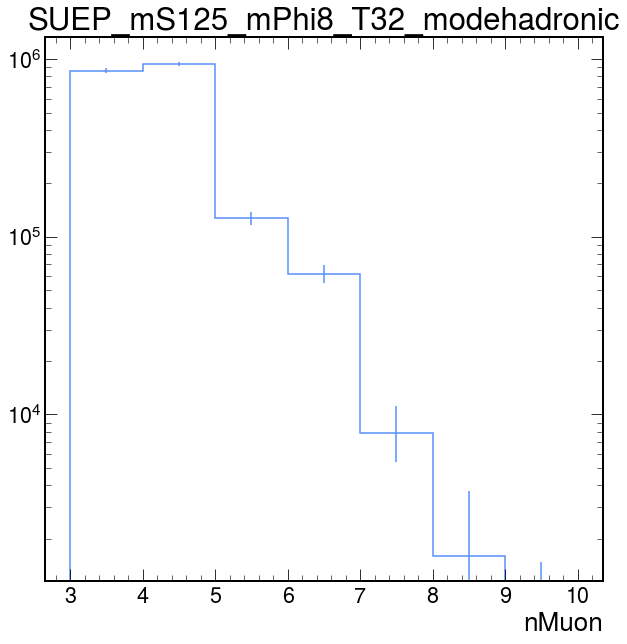

In [37]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    print(
        plots[p]["sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon"][
            ::sum, ::sum, :
        ].values()
    )
    plots[p]["sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon"][
        ::sum, ::sum, :
    ].plot()
    plt.title(p[:-5])
    plt.yscale("log")
    plt.show()

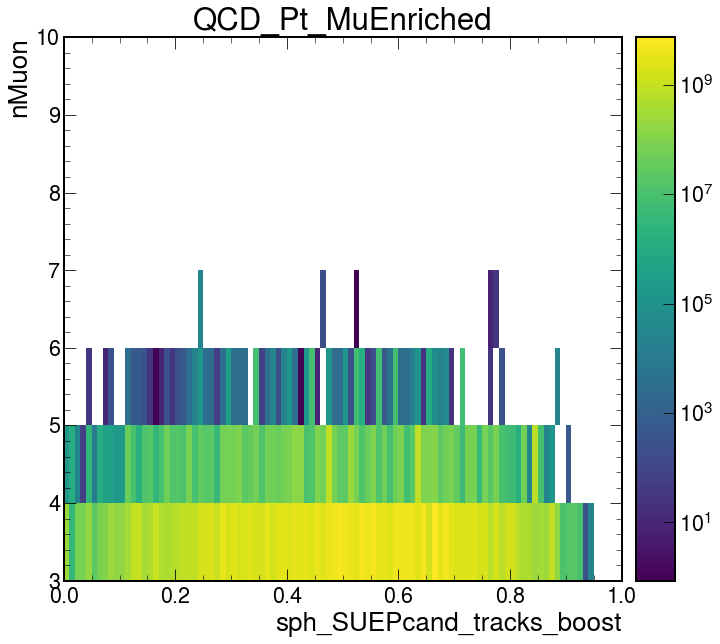

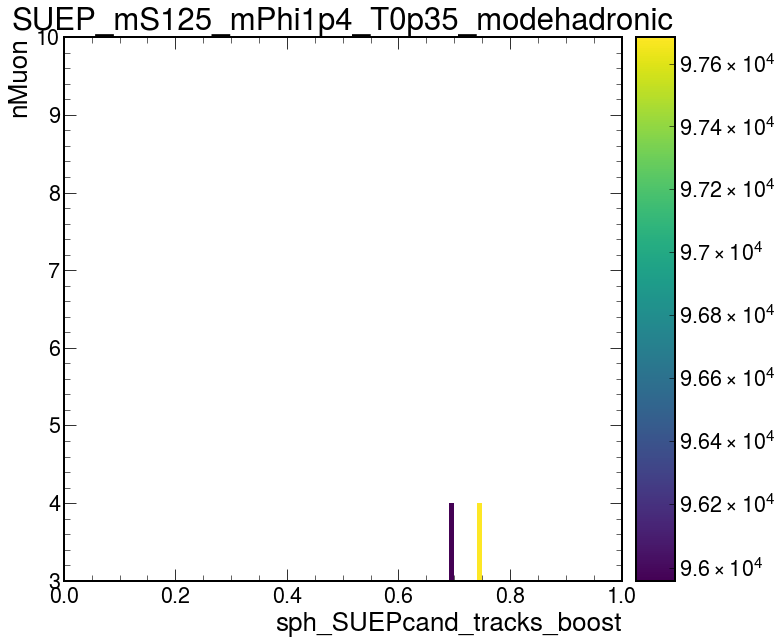

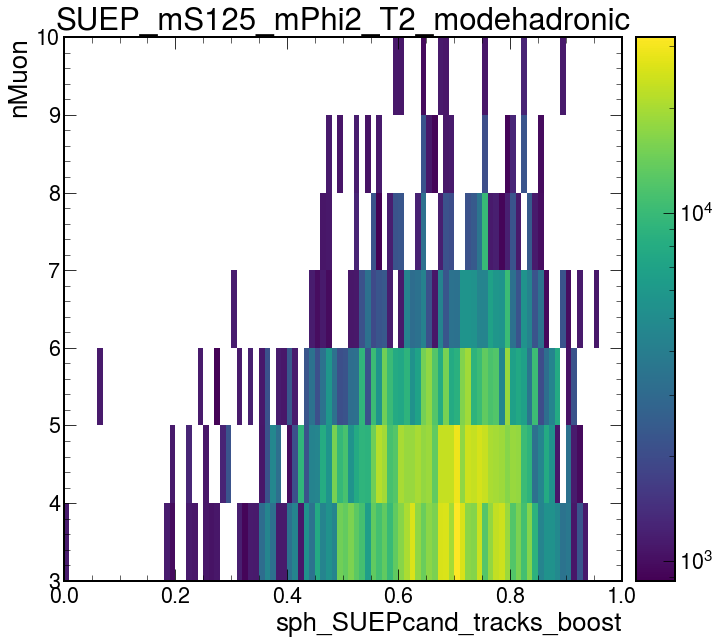

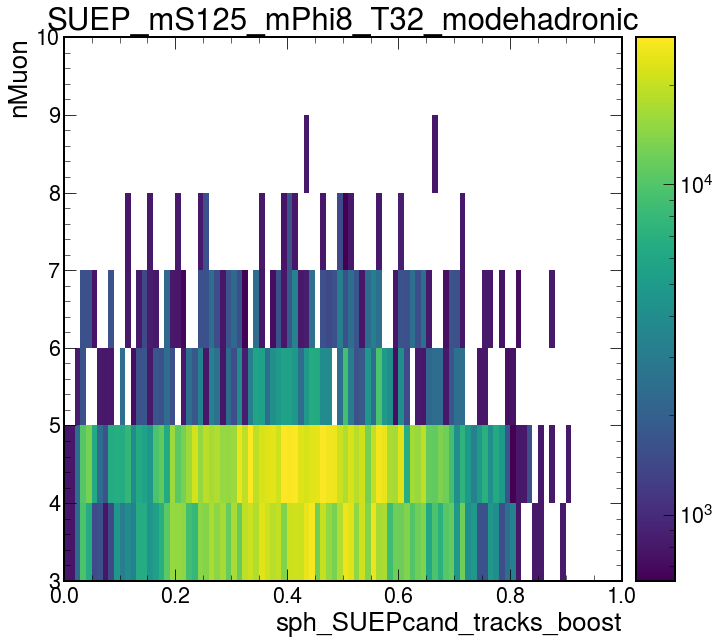

In [17]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon"][:, ::sum, :].plot2d(
        norm=mpl.colors.LogNorm()
    )
    plt.title(p[:-5])
    plt.show()

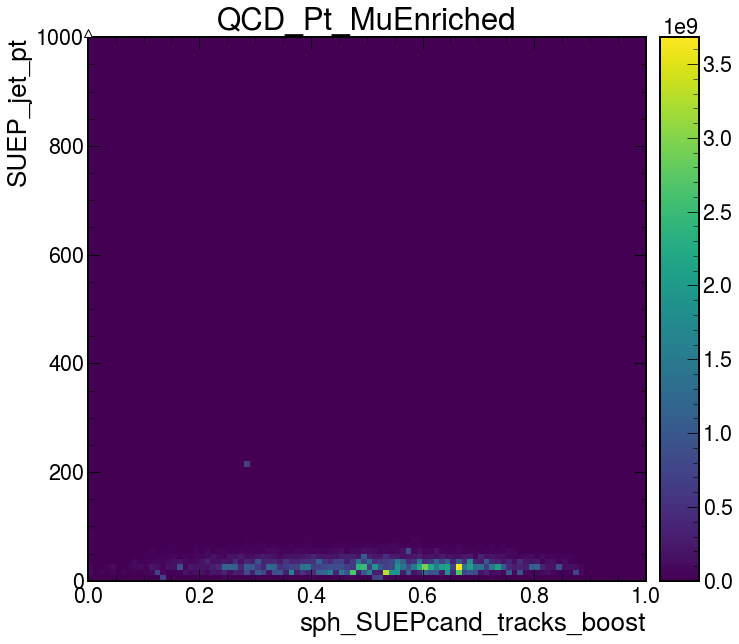

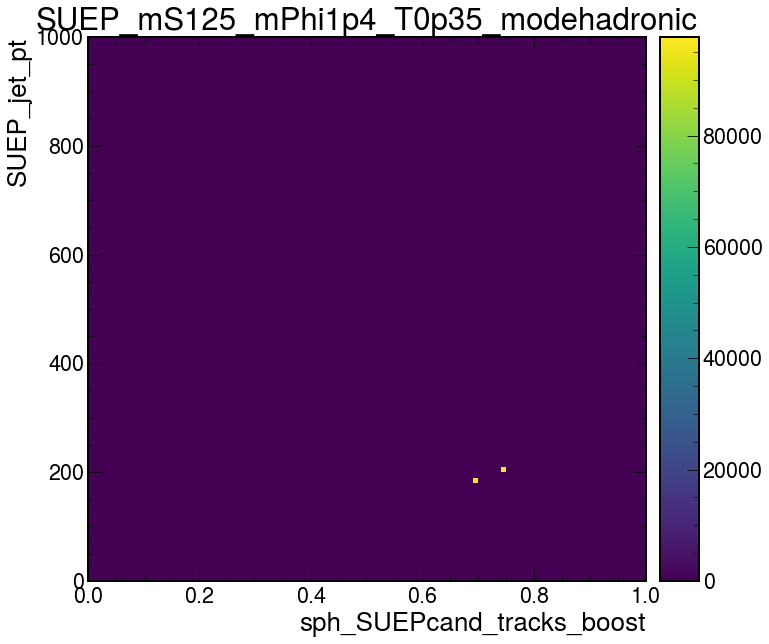

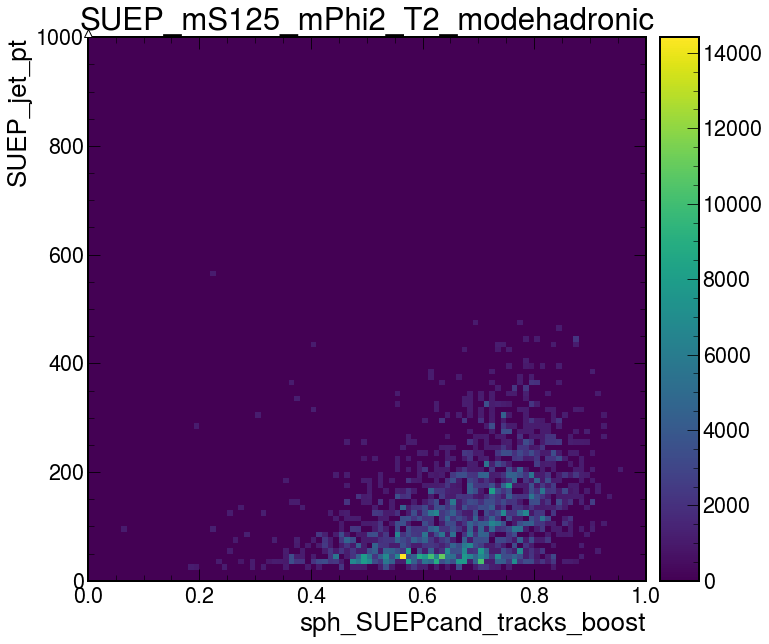

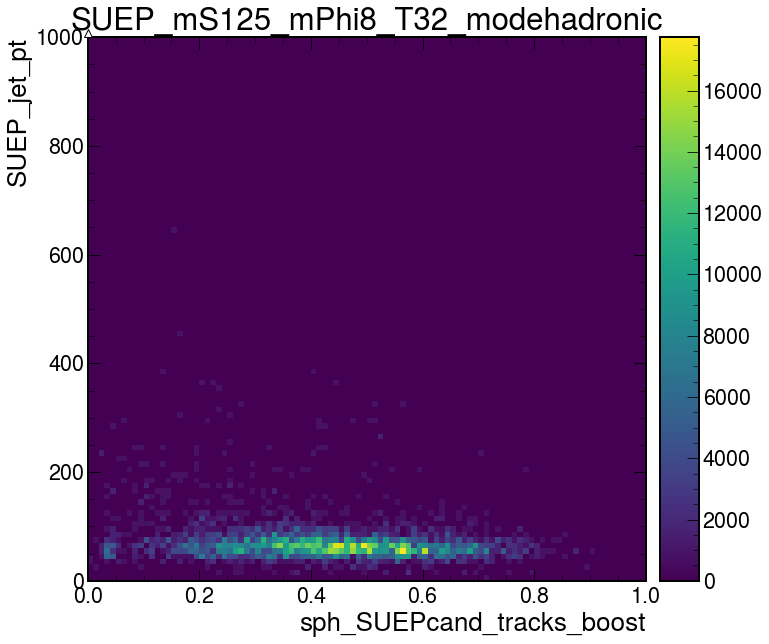

In [18]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]

for p in processes:
    plots[p]["sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon"][:, :, ::sum].plot2d()
    plt.title(p[:-5])
    plt.show()

Plotting: 
('muon_jet_btagDeepFlavB_vs_miniPFRelIso_all', 'muon_jet_btagDeepFlavB')

Cut (internally): None


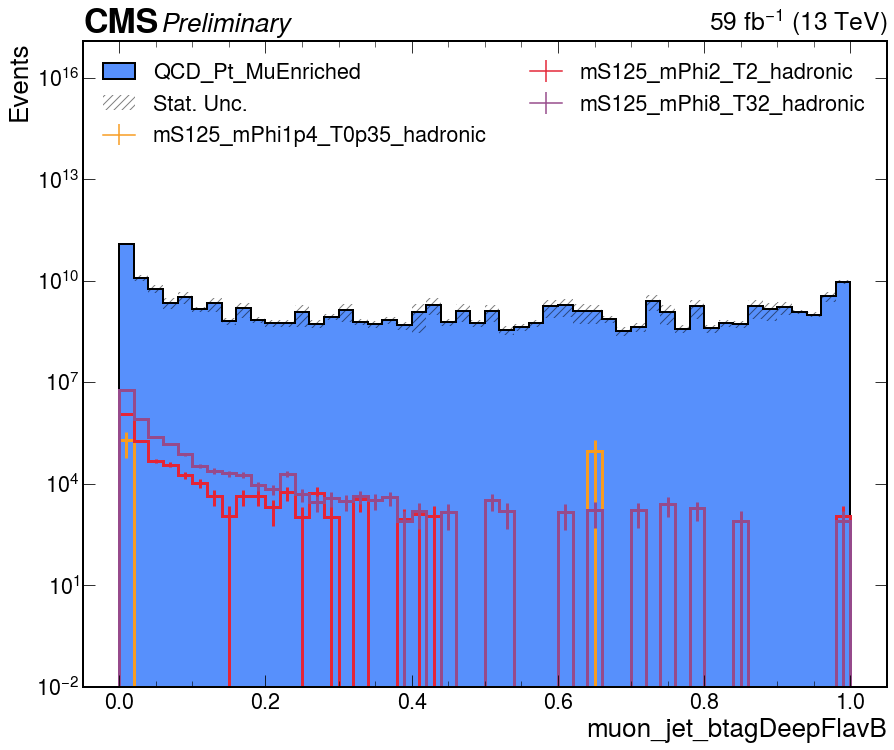

Plotting: 
('muon_jet_btagDeepFlavB_vs_miniPFRelIso_all', 'miniPFRelIso_all')

Cut (internally): None


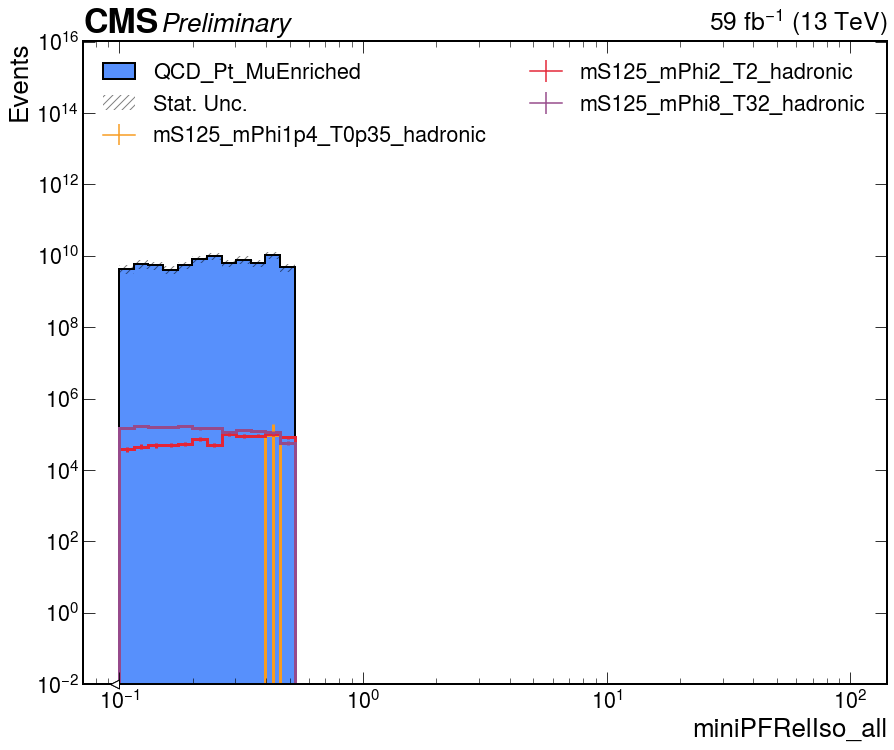

Plotting: 
('nMuon_pure', 'nMuon')

Cut (internally): None


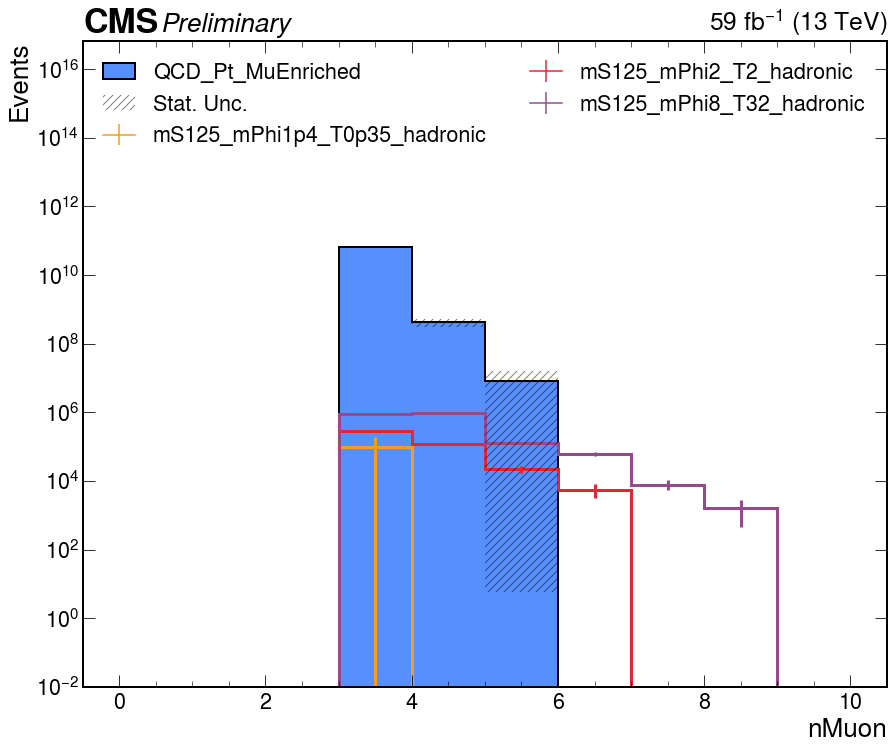

Plotting: 
('muon_jet_btagDeepFlavB', 'muon_jet_btagDeepFlavB')

Cut (internally): None


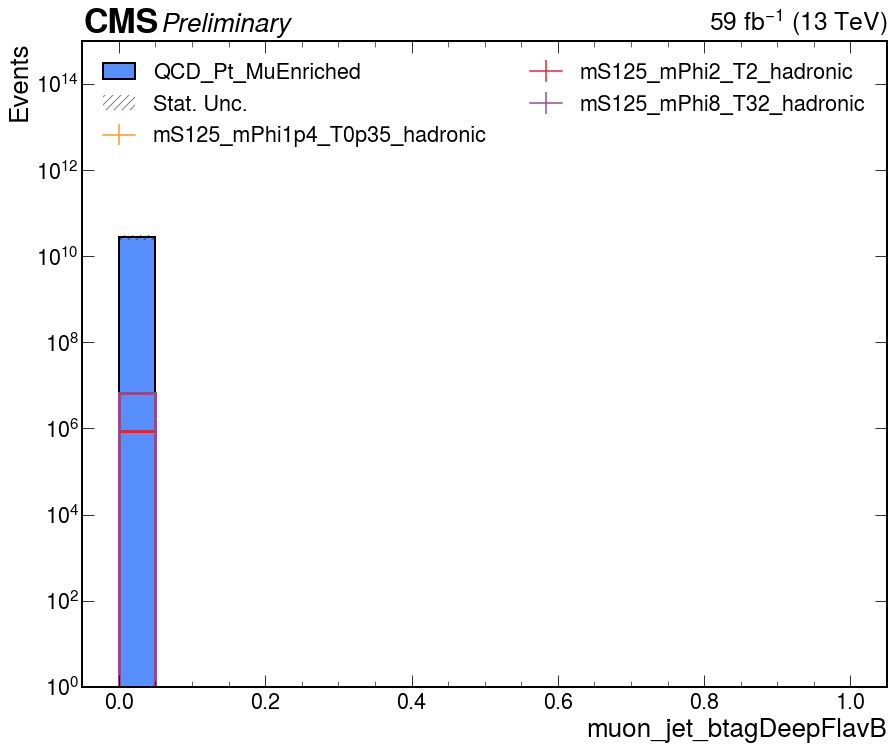

Plotting: 
('nDarkPho_vs_nDarkMeson_vs_nMuon', 'nDarkPho')

Cut (internally): (slice(None, None, None), slice(None, None, <built-in function sum>), slice(5j, None, <built-in function sum>))


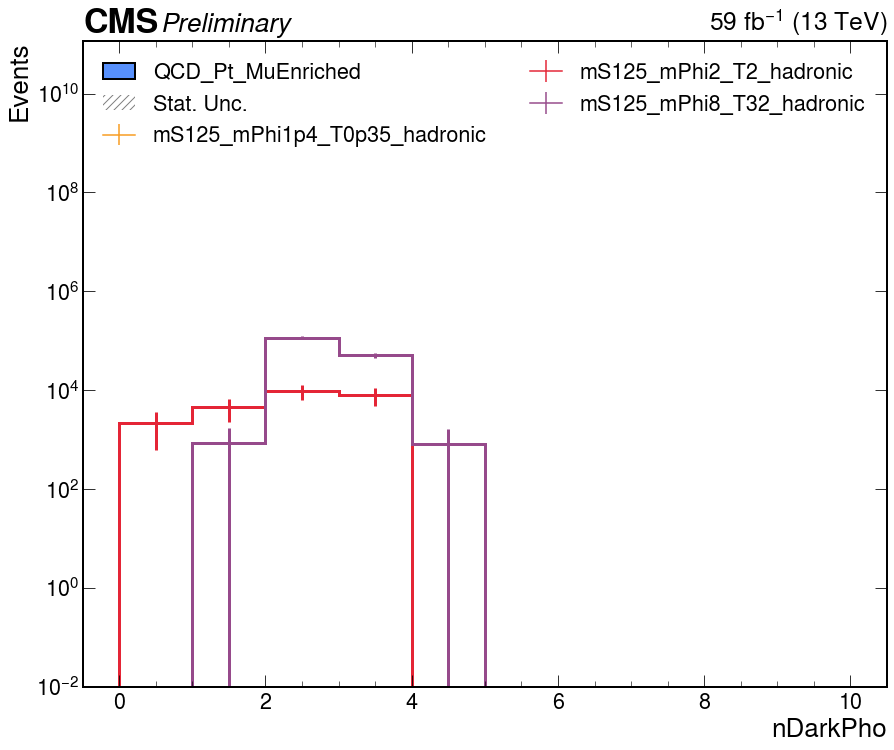

Plotting: 
('nDarkPho_vs_nDarkMeson_vs_nMuon', 'nDarkMeson')

Cut (internally): (slice(None, None, <built-in function sum>), slice(None, None, None), slice(5j, None, <built-in function sum>))


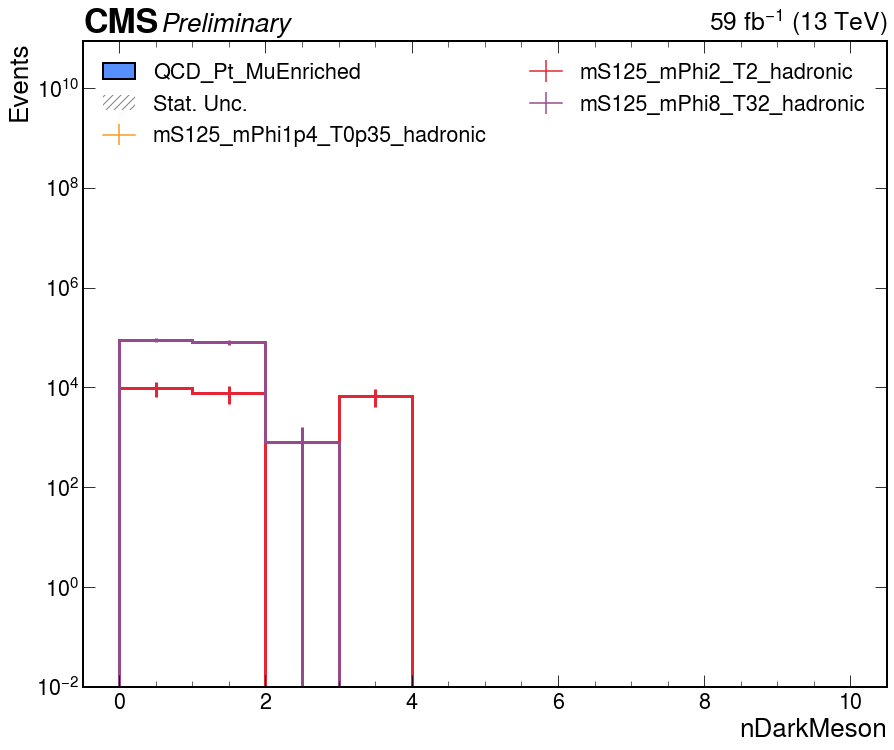

In [38]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [("muon_jet_btagDeepFlavB_vs_miniPFRelIso_all", "muon_jet_btagDeepFlavB"), {}],
    [
        ("muon_jet_btagDeepFlavB_vs_miniPFRelIso_all", "miniPFRelIso_all"),
        {"xlog": True},
    ],
    [("nMuon_pure", "nMuon"), {}],
    [
        ("muon_jet_btagDeepFlavB", "muon_jet_btagDeepFlavB"),
        {
            "slc": slice(None, None, 5j),
            "ylim": (1, 1e15),
        },
    ],
    [
        ("nDarkPho_vs_nDarkMeson_vs_nMuon", "nDarkPho"),
        {"cut": (slice(None), slice(None, None, sum), slice(5j, None, sum))},
    ],
    [
        ("nDarkPho_vs_nDarkMeson_vs_nMuon", "nDarkMeson"),
        {"cut": (slice(None, None, sum), slice(None), slice(5j, None, sum))},
    ],
]

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(13, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(None, None, <built-in function sum>), slice(None, None, <built-in function sum>))


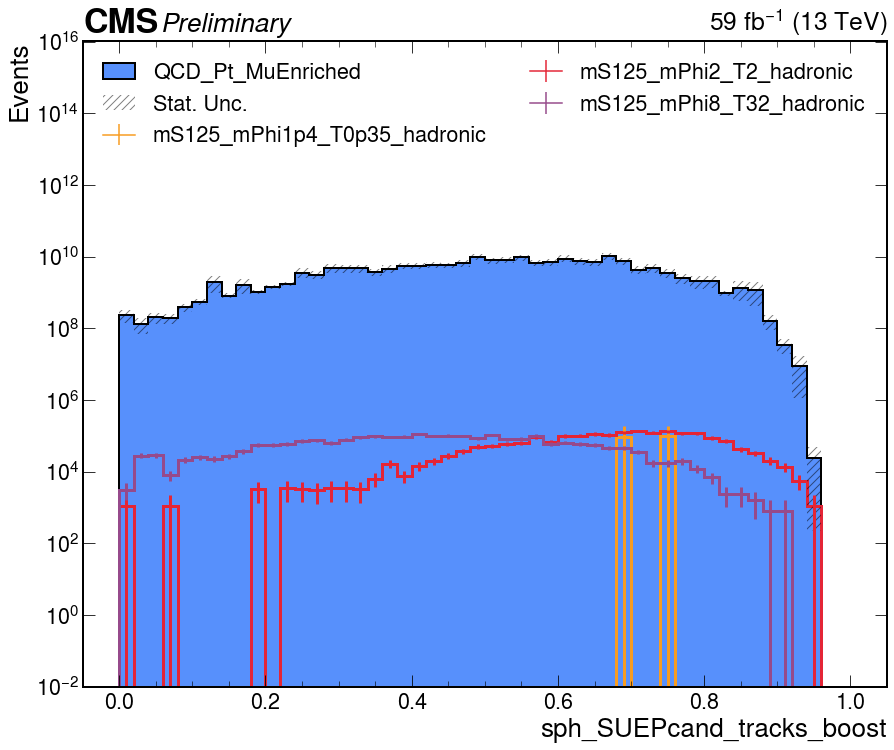

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(30j, None, <built-in function sum>), slice(None, None, <built-in function sum>))


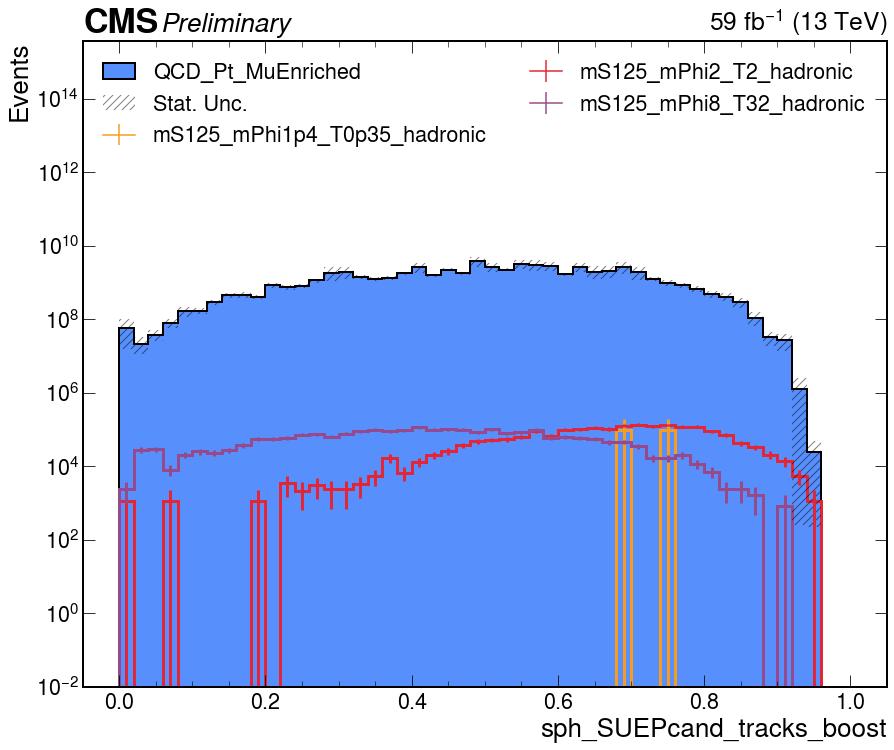

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(None, None, <built-in function sum>), slice(6j, None, <built-in function sum>))


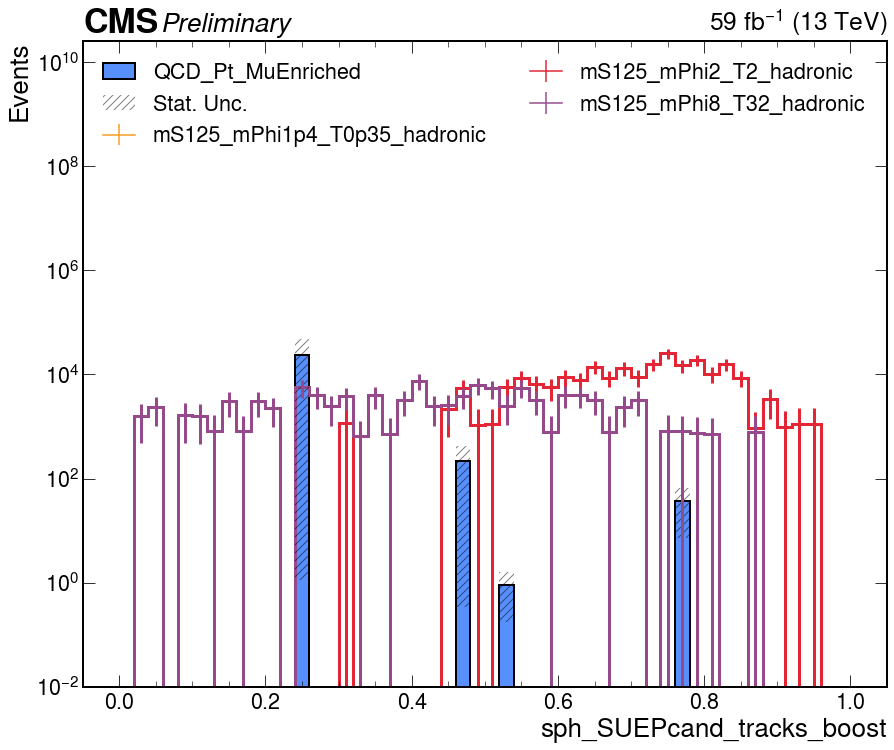

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(30j, None, <built-in function sum>), slice(6j, None, <built-in function sum>))


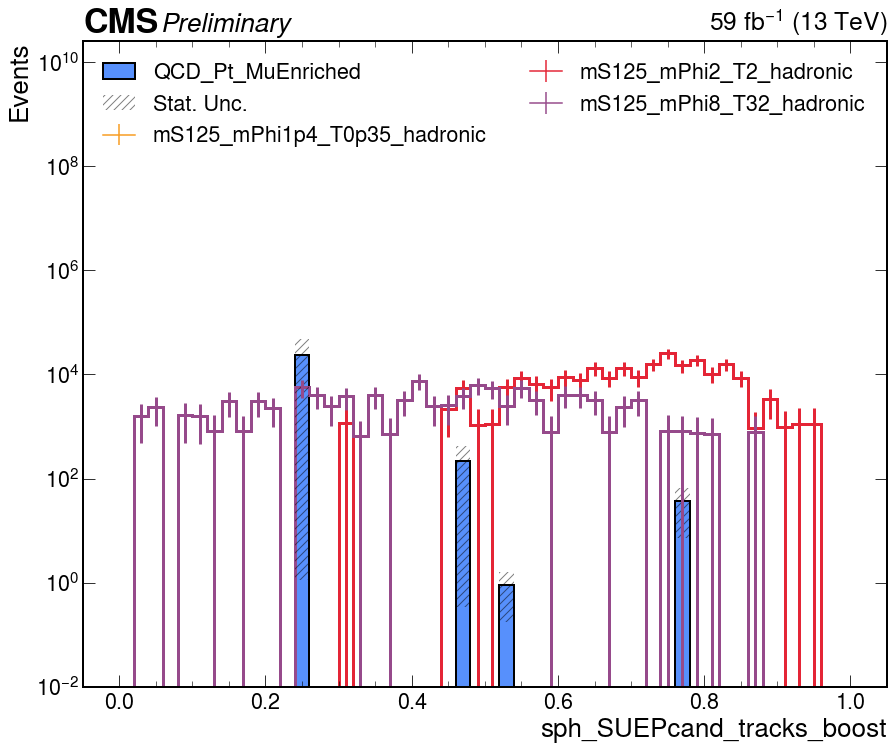

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(30j, None, <built-in function sum>), slice(7j, None, <built-in function sum>))


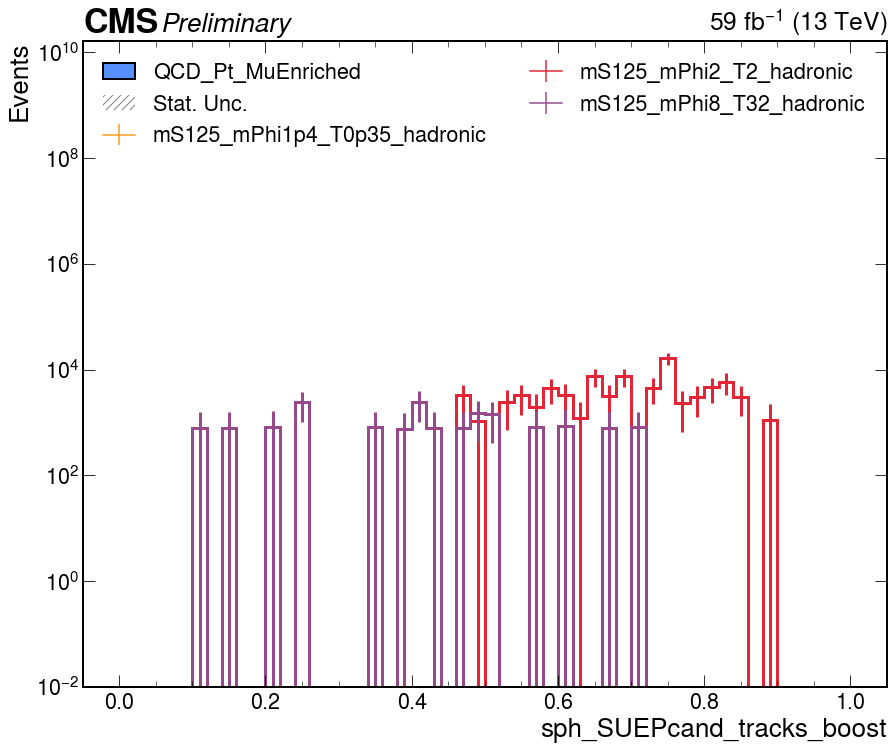

Plotting: 
('sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(30j, None, <built-in function sum>), slice(8j, None, <built-in function sum>))


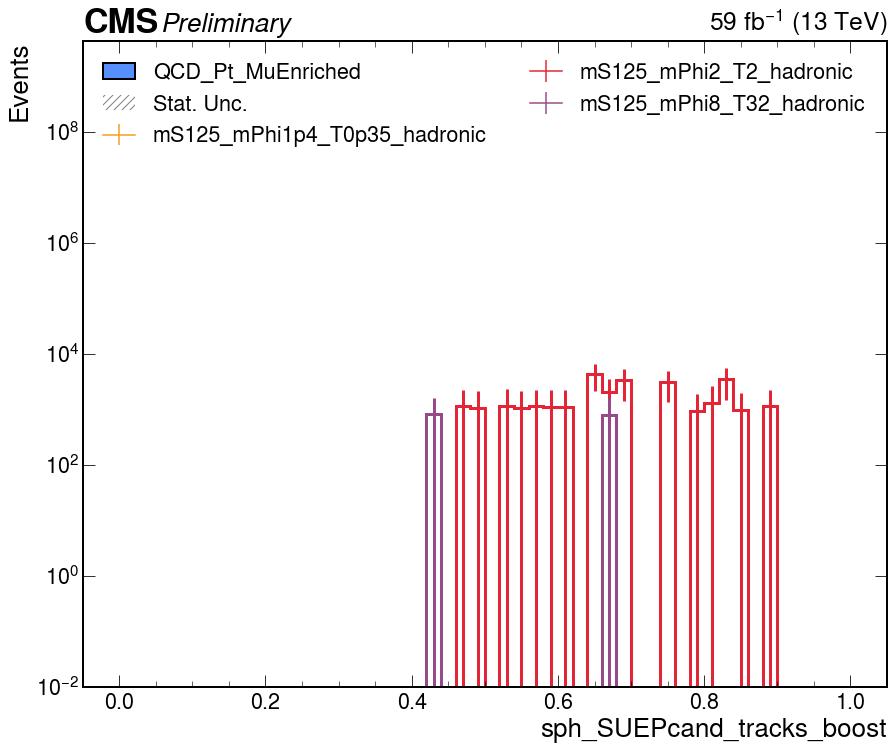

In [20]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(None, None, sum), slice(None, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(30j, None, sum), slice(None, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(None, None, sum), slice(6j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(30j, None, sum), slice(6j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(30j, None, sum), slice(7j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        (
            "sph_SUEPcand_tracks_boost_vs_SUEP_jet_pt_vs_nMuon",
            "sph_SUEPcand_tracks_boost",
        ),
        {
            "cut": (slice(None), slice(30j, None, sum), slice(8j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(13, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()

Plotting: 
('sph_SUEPcand_tracks_true_boost_vs_nMuon', 'sph_SUEPcand_tracks_true_boost')

Cut (internally): (slice(None, None, None), slice(None, None, <built-in function sum>))


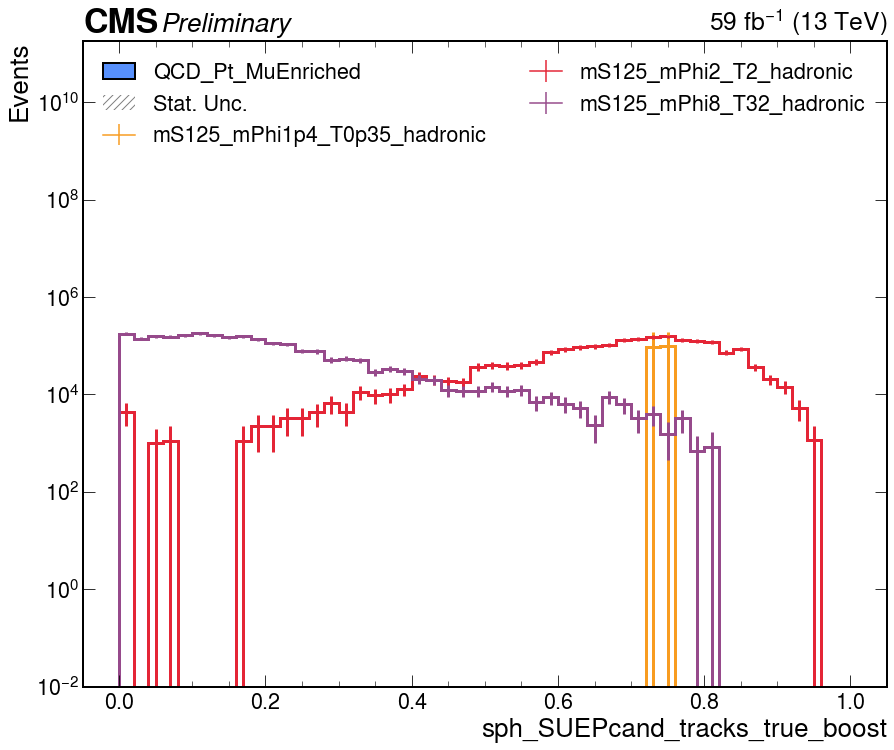

Plotting: 
('sph_SUEPcand_tracks_true_boost_vs_nMuon', 'sph_SUEPcand_tracks_true_boost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


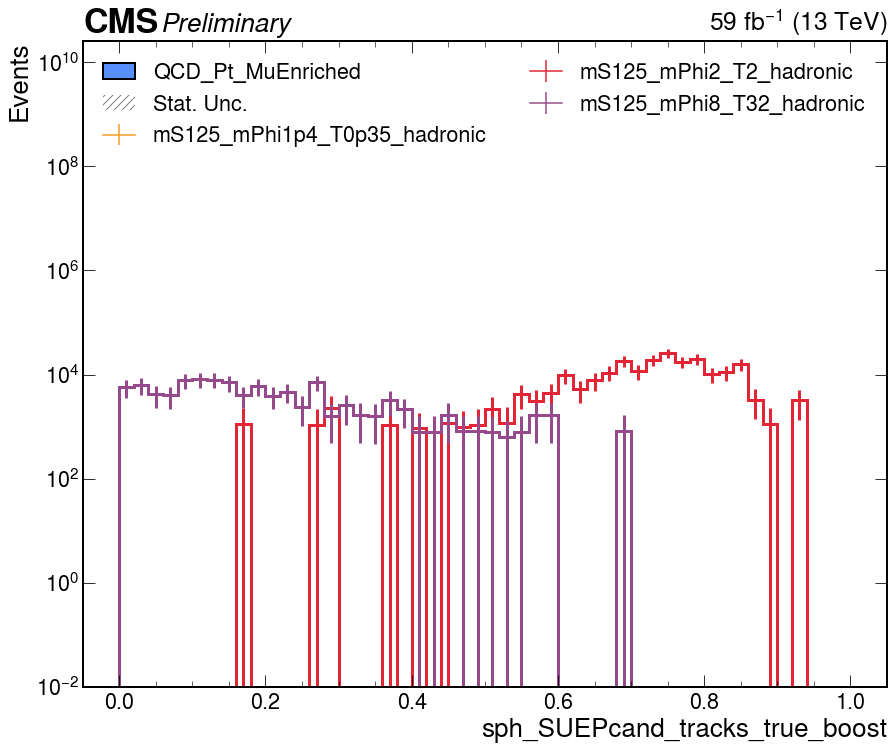

Plotting: 
('sph_SUEPcand_tracks_true_boost_vs_nMuon', 'sph_SUEPcand_tracks_true_boost')

Cut (internally): (slice(None, None, None), slice(7j, None, <built-in function sum>))


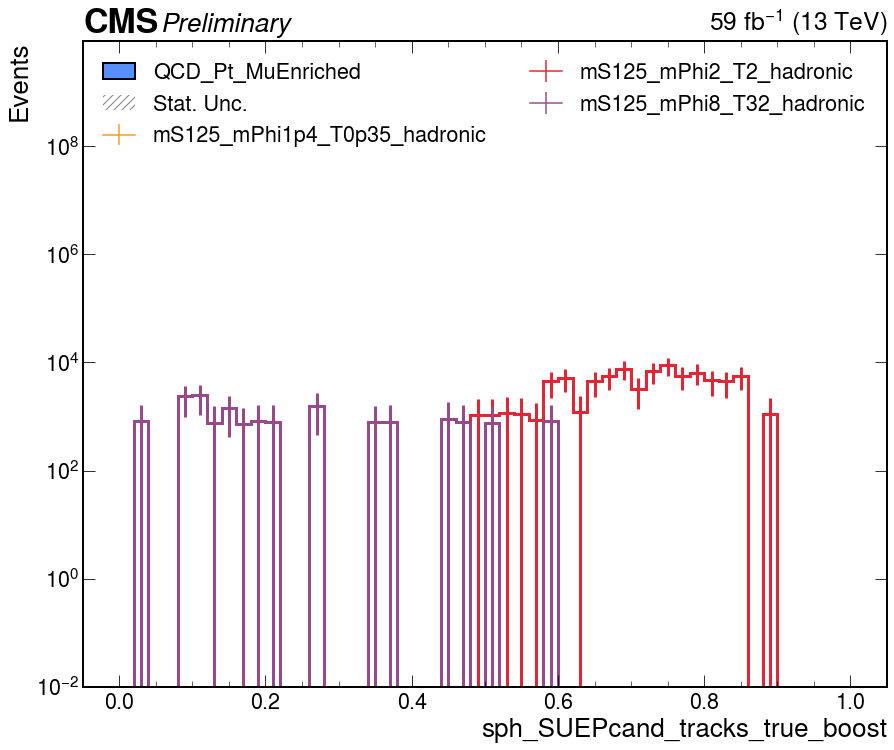

Plotting: 
('sph_SUEPcand_tracks_true_boost_vs_nMuon', 'sph_SUEPcand_tracks_true_boost')

Cut (internally): (slice(None, None, None), slice(8j, None, <built-in function sum>))


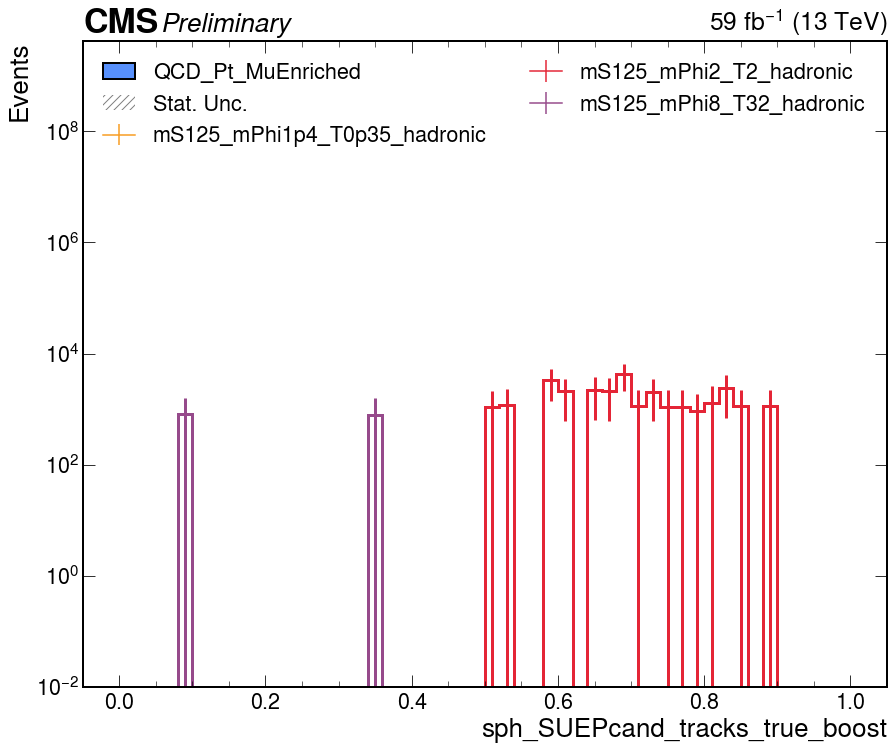

In [21]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [
        ("sph_SUEPcand_tracks_true_boost_vs_nMuon", "sph_SUEPcand_tracks_true_boost"),
        {
            "cut": (slice(None), slice(None, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        ("sph_SUEPcand_tracks_true_boost_vs_nMuon", "sph_SUEPcand_tracks_true_boost"),
        {
            "cut": (slice(None), slice(6j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        ("sph_SUEPcand_tracks_true_boost_vs_nMuon", "sph_SUEPcand_tracks_true_boost"),
        {
            "cut": (slice(None), slice(7j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
    [
        ("sph_SUEPcand_tracks_true_boost_vs_nMuon", "sph_SUEPcand_tracks_true_boost"),
        {
            "cut": (slice(None), slice(8j, None, sum)),
            "slc": slice(None, None, 2j),
        },
    ],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(13, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()

Plotting: 
('dark_meson_p', 'dark_meson_p')

Cut (internally): None


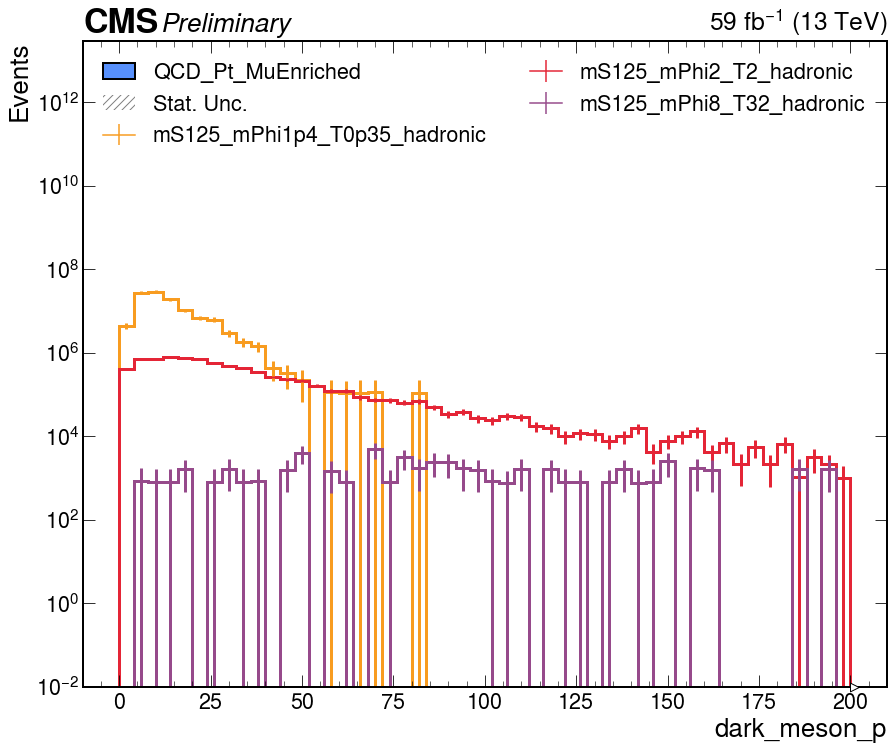

Plotting: 
('dark_meson_boosted_p', 'dark_meson_boosted_p')

Cut (internally): None


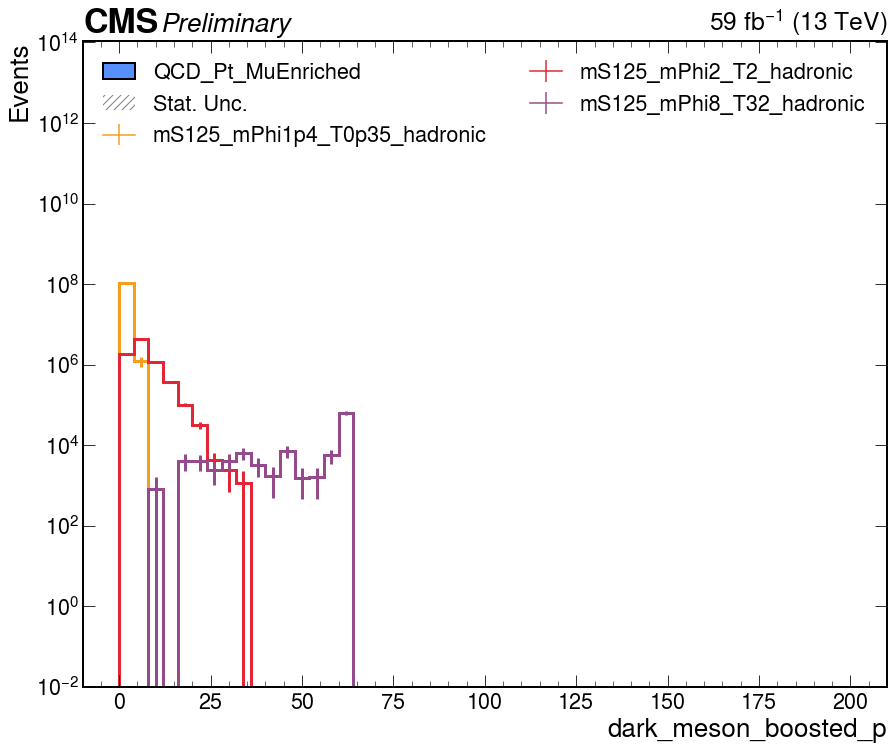

In [19]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [
        ("dark_meson_p", "dark_meson_p"),
        {
            "slc": slice(None, None, 2j),
        },
    ],
    [
        ("dark_meson_boosted_p", "dark_meson_boosted_p"),
        {
            "slc": slice(None, None, 2j),
        },
    ],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(13, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        # text_to_show=plot_i[0][0],
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()
#     fig.savefig(f"{output_path}/{plot_i[0][0]}.pdf")

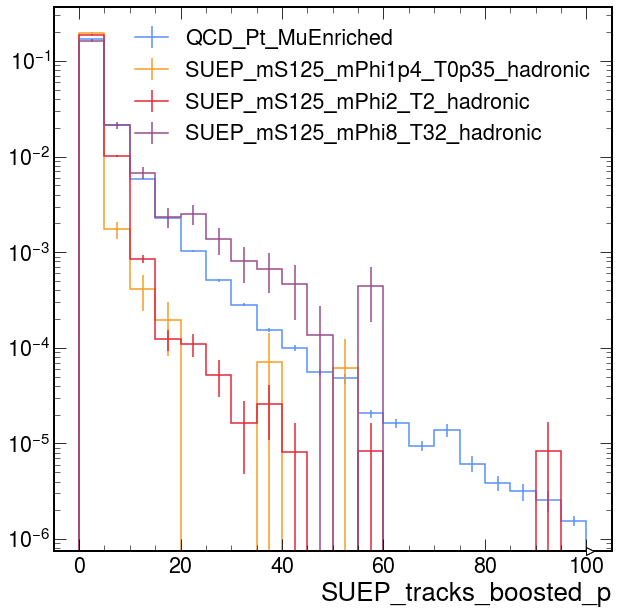

In [42]:
processes = [
    "QCD_Pt_MuEnriched_2018",
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
for p in processes:
    histogram = plots[p]["SUEP_tracks_boosted_p"][:100j]
    histogram.plot(
        yerr=np.sqrt(histogram.variances()),
        density=True,
        label=p.replace("_2018", "").replace("mode", ""),
    )
plt.legend()
plt.yscale("log")
plt.show()

Plotting: 
('SUEP_tracks_p', 'SUEP_tracks_p')

Cut (internally): None


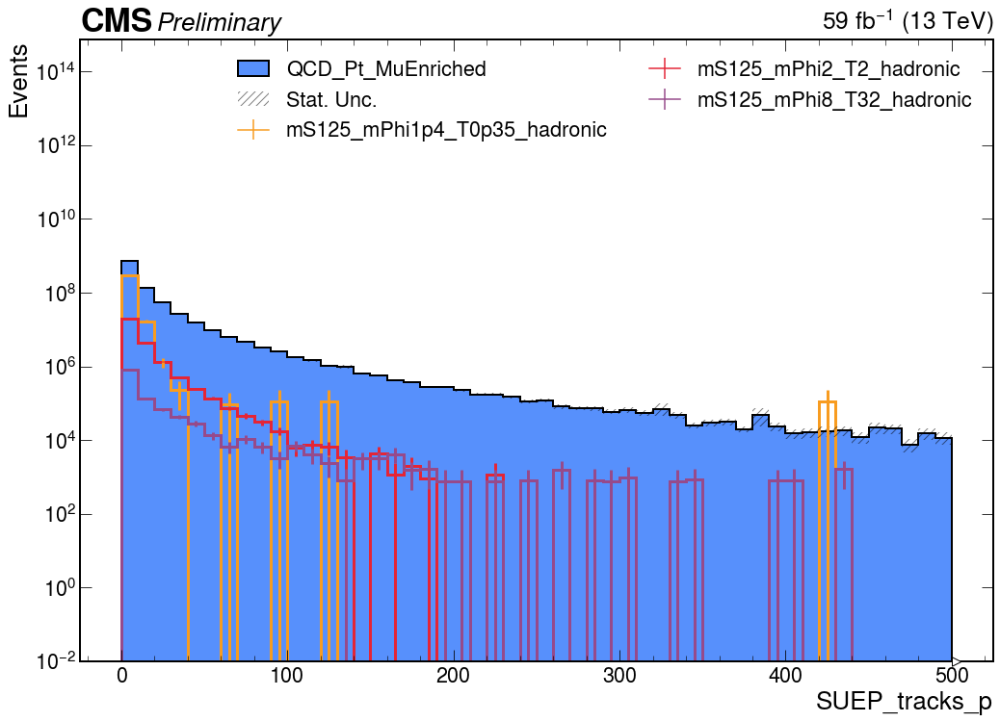

Plotting: 
('SUEP_tracks_boosted_p', 'SUEP_tracks_boosted_p')

Cut (internally): None


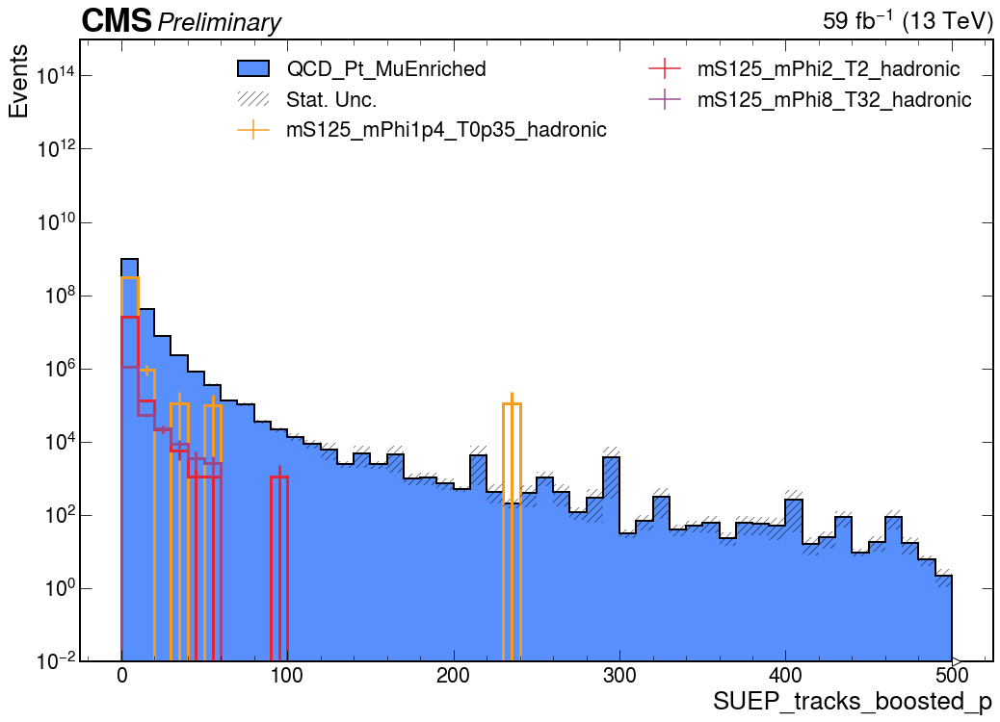

In [37]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [
        ("SUEP_tracks_p", "SUEP_tracks_p"),
        {
            "slc": slice(None, None, 2j),
        },
    ],
    [
        ("SUEP_tracks_boosted_p", "SUEP_tracks_boosted_p"),
        {
            "slc": slice(None, None, 2j),
        },
    ],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(15, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        density=True,
        **plot_i[1]
    )
    plt.tight_layout()
    plt.show()

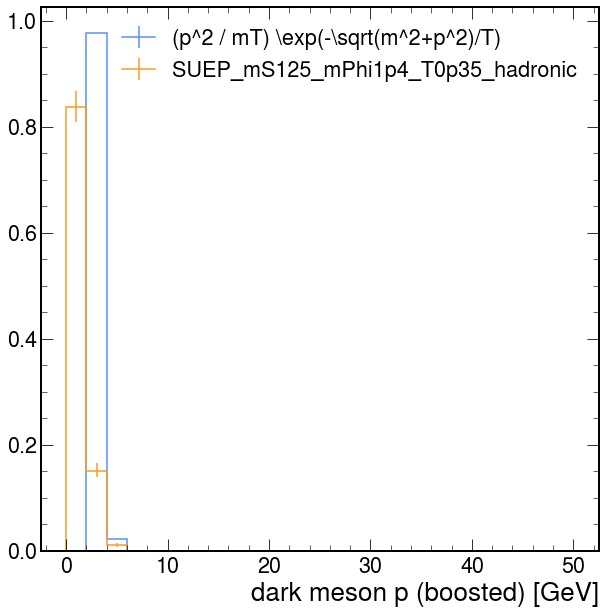

In [32]:
temp = 0.35
mass_phi = 1.4
p_values = np.linspace(0, 50, 26)[:-1]
p_distribution = (p_values**2 / (mass_phi * temp)) * np.exp(
    -np.sqrt(mass_phi**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    25, 0, 50, name="distribution", label="distribution"
).Double()
for i in range(25):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018"]["dark_meson_boosted_p"][
    :50j
]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi1p4_T0p35_hadronic")
plt.xlabel("dark meson p (boosted) [GeV]")
plt.legend()

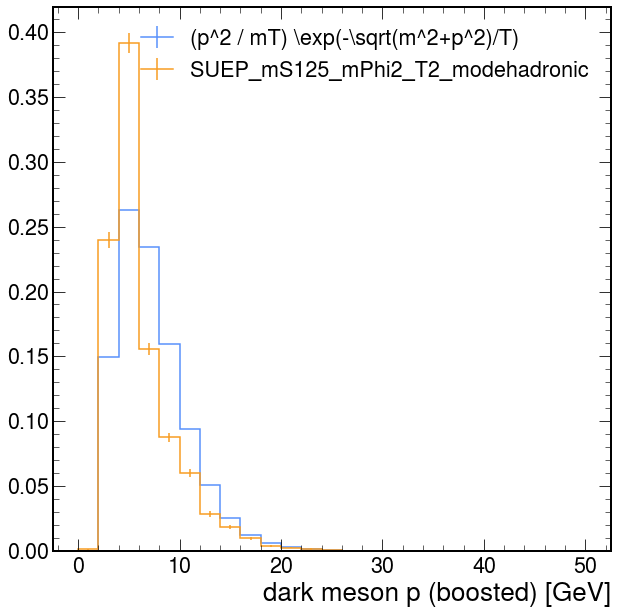

In [33]:
temp = 2
mass_phi = 2
p_values = np.linspace(0, 50, 26)[:-1]
p_distribution = (p_values**2 / (mass_phi * temp)) * np.exp(
    -np.sqrt(mass_phi**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    25, 0, 50, name="distribution", label="distribution"
).Double()
for i in range(25):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi2_T2_modehadronic_2018"]["dark_meson_boosted_p"][:50j]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi2_T2_modehadronic")
plt.xlabel("dark meson p (boosted) [GeV]")
plt.legend()

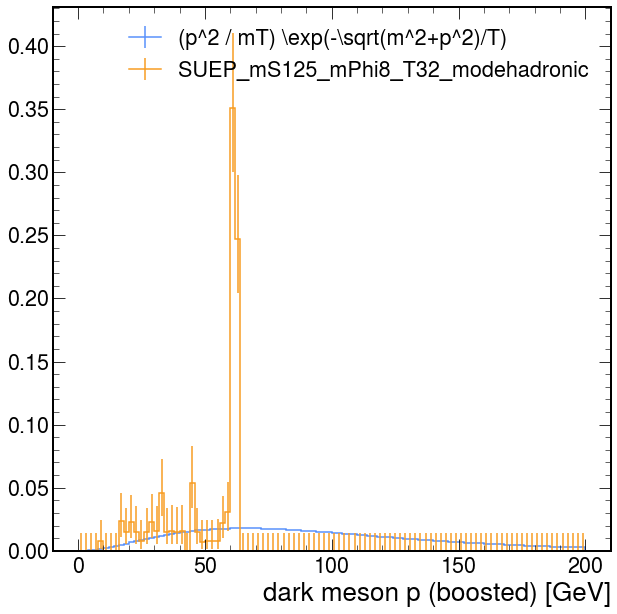

In [36]:
temp = 32
mass_phi = 8
p_values = np.linspace(0, 200, 101)[:-1]
p_distribution = (p_values**2 / (mass_phi * temp)) * np.exp(
    -np.sqrt(mass_phi**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    100, 0, 200, name="distribution", label="distribution"
).Double()
for i in range(100):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi8_T32_modehadronic_2018"]["dark_meson_boosted_p"]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi8_T32_modehadronic")
plt.xlabel("dark meson p (boosted) [GeV]")
plt.legend()

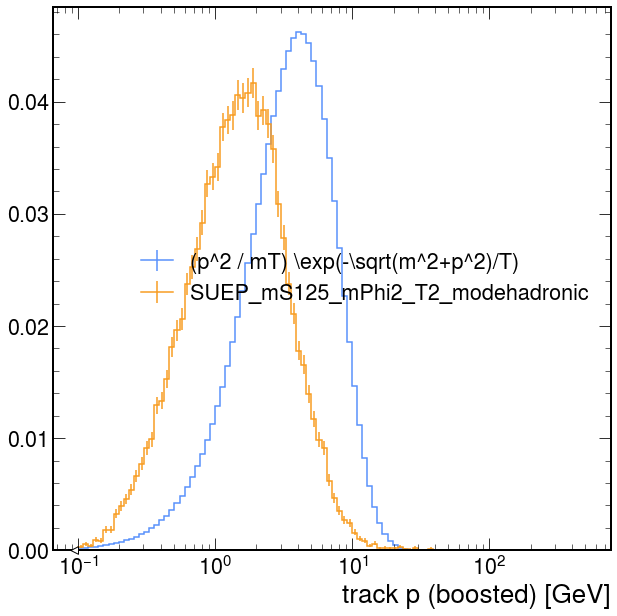

In [88]:
temp = 2
mass_pion = 0.13957
p_values = np.logspace(-1, np.log10(500), 101)[:-1]
p_distribution = (p_values**2 / (mass_pion * temp)) * np.exp(
    -np.sqrt(mass_pion**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    100,
    0.1,
    500,
    name="distribution",
    label="distribution",
    transform=hist.axis.transform.log,
).Double()
for i in range(100):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi2_T2_modehadronic_2018"]["SUEP_tracks_boosted_p"]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi2_T2_modehadronic")
plt.xlabel("track p (boosted) [GeV]")
plt.legend()
plt.xscale("log")

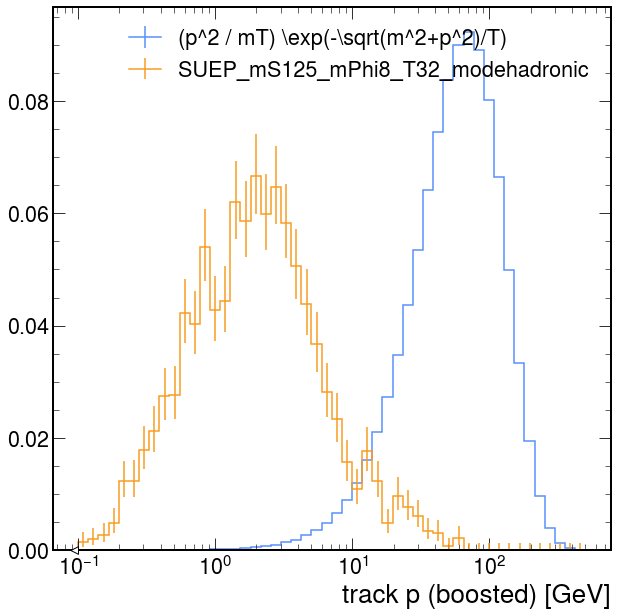

In [90]:
temp = 32
mass_pion = 0.13957
p_values = np.logspace(-1, np.log10(500), 51)[:-1]
p_distribution = (p_values**2 / (mass_pion * temp)) * np.exp(
    -np.sqrt(mass_pion**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    50,
    0.1,
    500,
    name="distribution",
    label="distribution",
    transform=hist.axis.transform.log,
).Double()
for i in range(50):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi8_T32_modehadronic_2018"]["SUEP_tracks_boosted_p"][
    ::2j
]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi8_T32_modehadronic")
plt.xlabel("track p (boosted) [GeV]")
plt.legend()
plt.xscale("log")

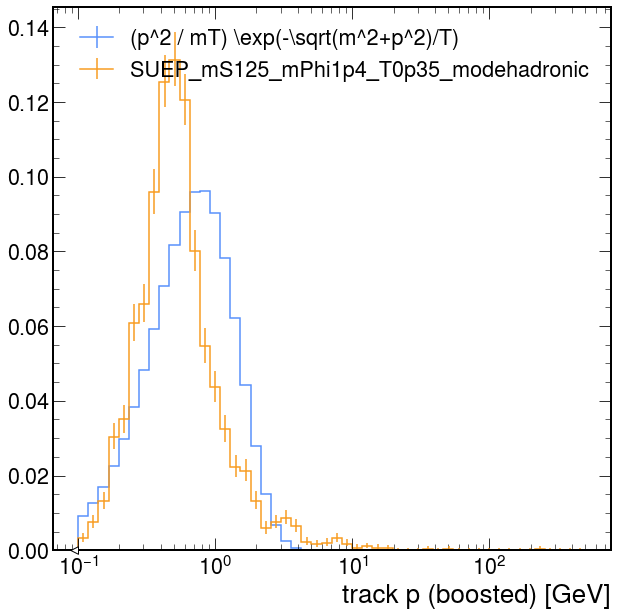

In [91]:
temp = 0.35
mass_pion = 0.13957
p_values = np.logspace(-1, np.log10(500), 51)[:-1]
p_distribution = (p_values**2 / (mass_pion * temp)) * np.exp(
    -np.sqrt(mass_pion**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    50,
    0.1,
    500,
    name="distribution",
    label="distribution",
    transform=hist.axis.transform.log,
).Double()
for i in range(50):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018"][
    "SUEP_tracks_boosted_p"
][::2j]
(histogram / histogram.sum().value).plot(label="SUEP_mS125_mPhi1p4_T0p35_modehadronic")
plt.xlabel("track p (boosted) [GeV]")
plt.legend()
plt.xscale("log")

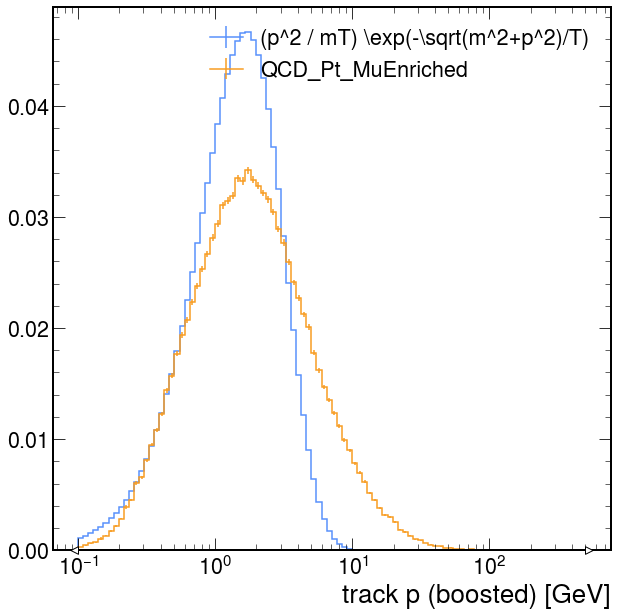

In [96]:
temp = 0.8
mass_pion = 0.13957
p_values = np.logspace(-1, np.log10(500), 101)[:-1]
p_distribution = (p_values**2 / (mass_pion * temp)) * np.exp(
    -np.sqrt(mass_pion**2 + p_values**2) / temp
)
h_distribution = hist.Hist.new.Reg(
    100,
    0.1,
    500,
    name="distribution",
    label="distribution",
    transform=hist.axis.transform.log,
).Double()
for i in range(100):
    h_distribution[i] = p_distribution[i]
(h_distribution / h_distribution.sum()).plot(
    yerr=0, label=r"(p^2 / mT) \exp(-\sqrt(m^2+p^2)/T)"
)
histogram = plots["QCD_Pt_MuEnriched_2018"]["SUEP_tracks_boosted_p"]
(histogram / histogram.sum().value).plot(label="QCD_Pt_MuEnriched")
plt.xlabel("track p (boosted) [GeV]")
plt.legend()
plt.xscale("log")

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x7fd1f6d21820>, cbar=<matplotlib.colorbar.Colorbar object at 0x7fd1f6ccdbe0>, text=[])

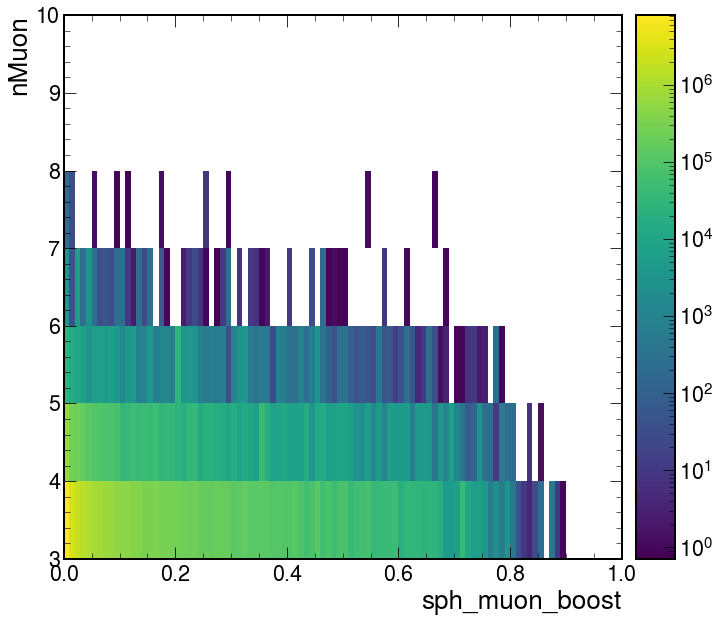

In [27]:
plots["QCD_Pt_MuEnriched_2018"]["sph_muon_boost"].plot2d(norm=mpl.colors.LogNorm())

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x7f77d472c590>, cbar=<matplotlib.colorbar.Colorbar object at 0x7f77d475c7d0>, text=[])

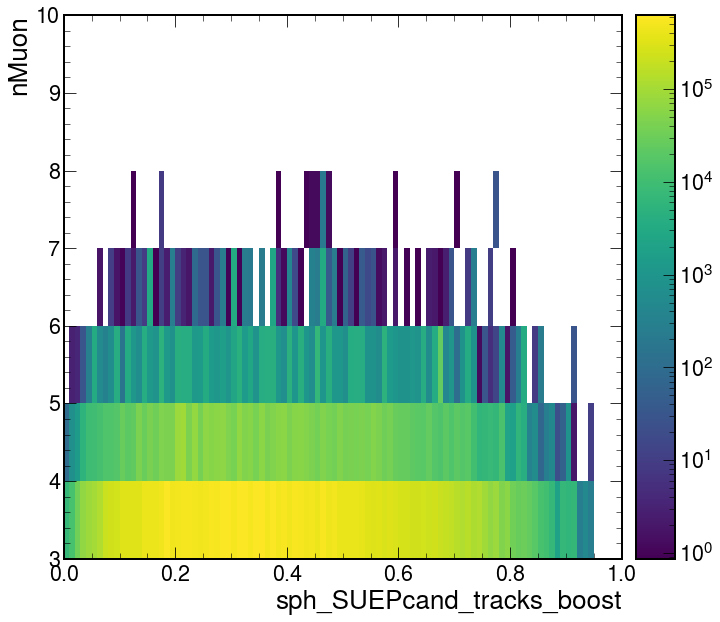

In [14]:
plots["QCD_Pt_MuEnriched_2018"]["sph_SUEPcand_tracks_boost"].plot2d(
    norm=mpl.colors.LogNorm()
)

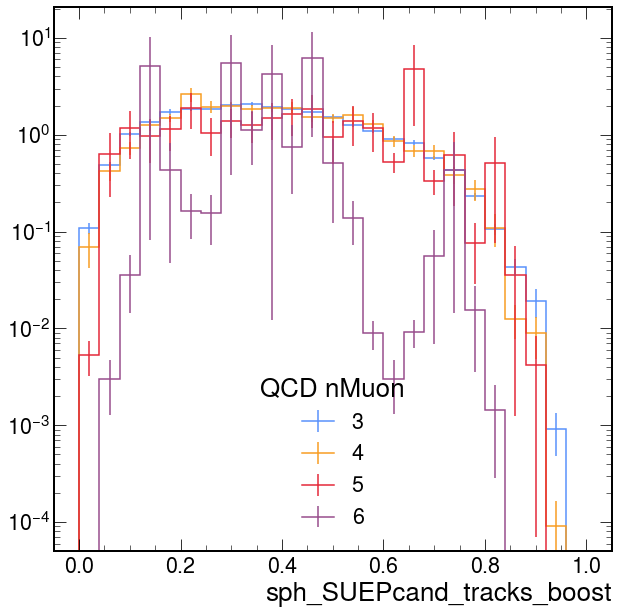

In [13]:
for muon_i in range(3, 7):
    histogram = plots["QCD_Pt_MuEnriched_2018"]["sph_SUEPcand_tracks_boost"][
        ::4j, muon_i * 1j
    ]
    histogram.plot(yerr=np.sqrt(histogram.variances()), density=True, label=f"{muon_i}")
plt.legend(title="QCD nMuon")
plt.yscale("log")
plt.show()

Plotting: 
('sph_muon_noboost', 'sph_muon_noboost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


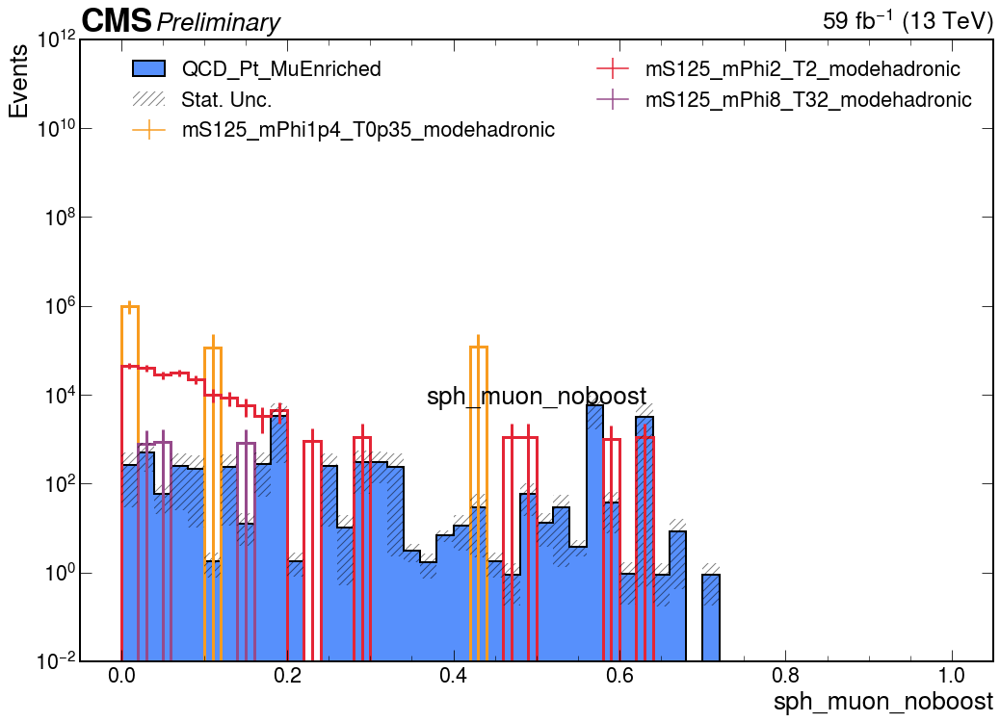

Plotting: 
('sph_muon_boost', 'sph_muon_boost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


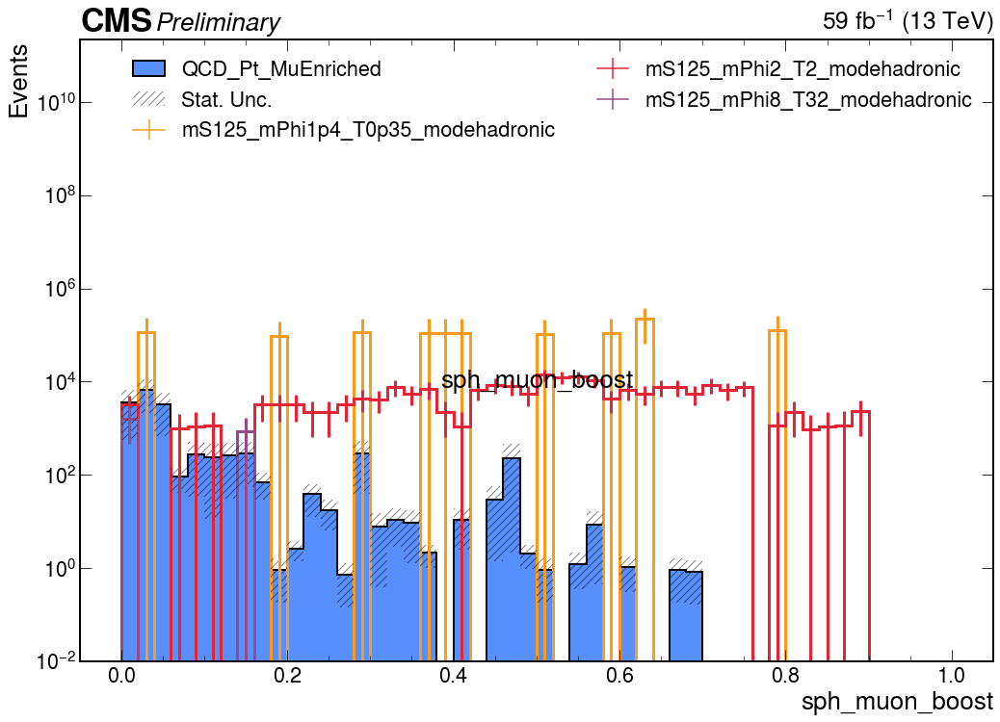

Plotting: 
('sph_tracks_noboost', 'sph_tracks_noboost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


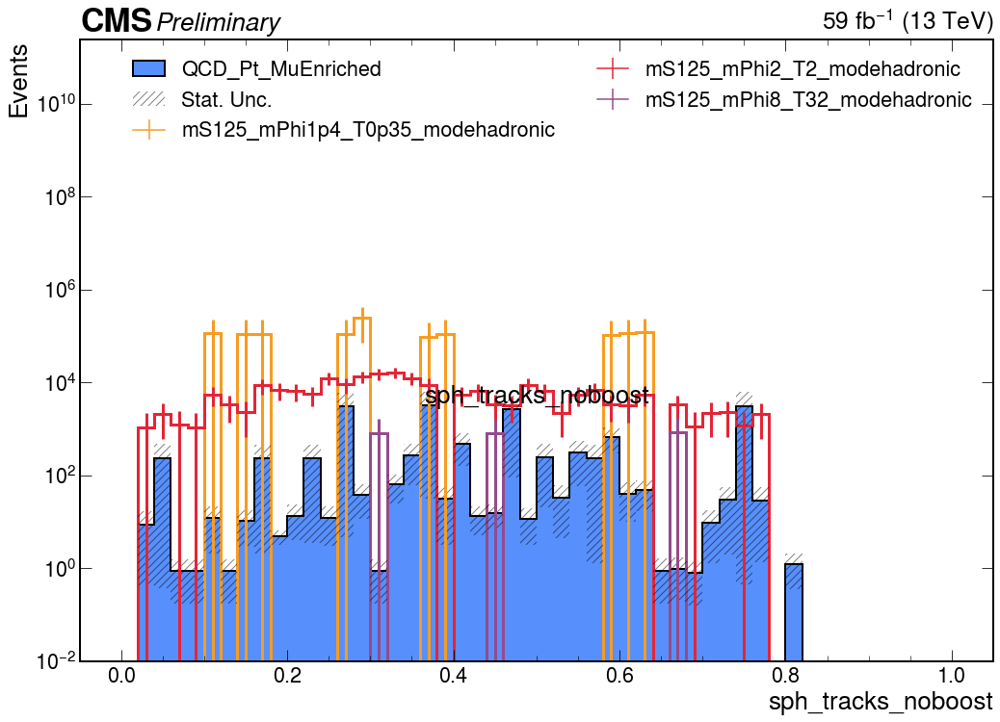

Plotting: 
('sph_tracks_boost', 'sph_tracks_boost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


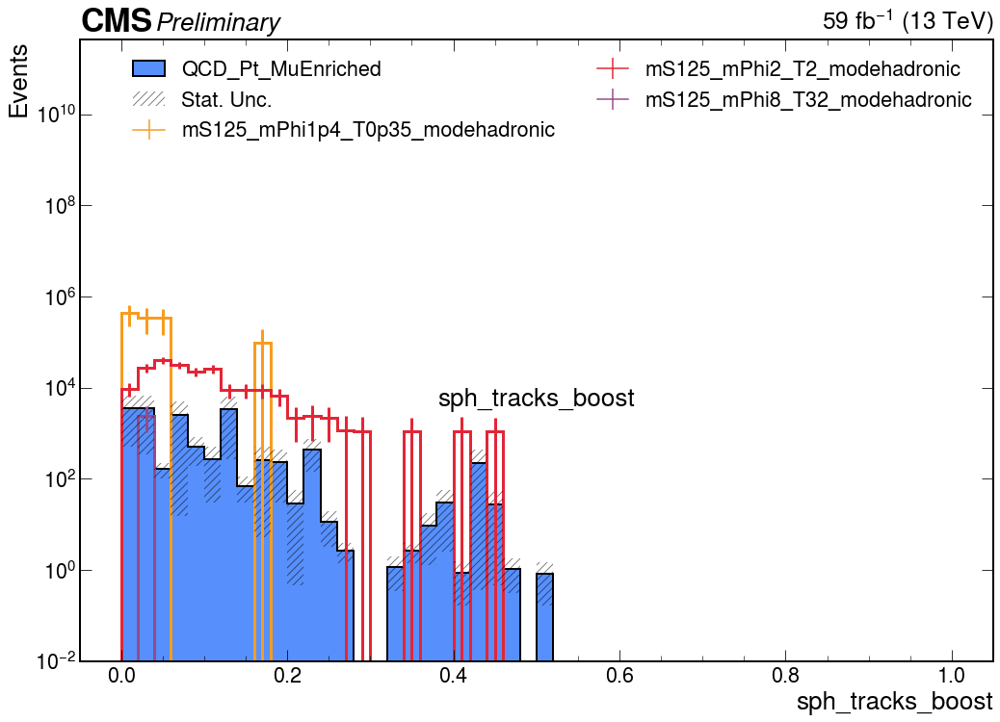

Plotting: 
('sph_SUEPcand_tracks_noboost', 'sph_SUEPcand_tracks_noboost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


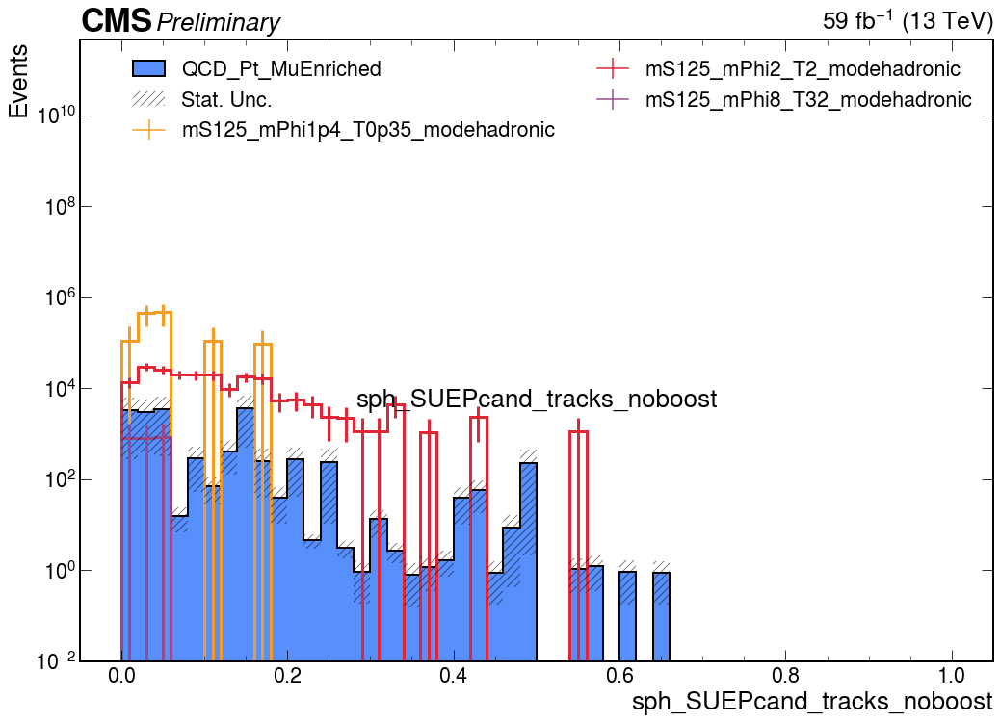

Plotting: 
('sph_SUEPcand_tracks_boost', 'sph_SUEPcand_tracks_boost')

Cut (internally): (slice(None, None, None), slice(6j, None, <built-in function sum>))


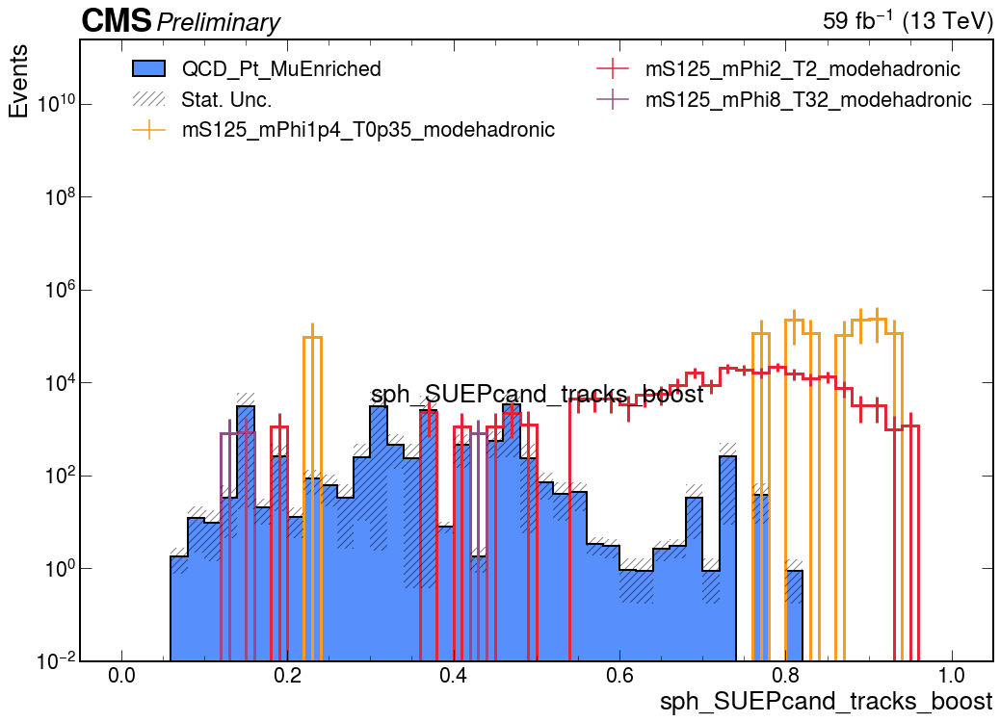

In [29]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [
        ("sph_muon_noboost", "sph_muon_noboost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
    [
        ("sph_muon_boost", "sph_muon_boost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
    [
        ("sph_tracks_noboost", "sph_tracks_noboost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
    [
        ("sph_tracks_boost", "sph_tracks_boost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
    [
        ("sph_SUEPcand_tracks_noboost", "sph_SUEPcand_tracks_noboost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
    [
        ("sph_SUEPcand_tracks_boost", "sph_SUEPcand_tracks_boost"),
        {"cut": (slice(None), slice(6j, None, sum)), "slc": slice(None, None, 2j)},
    ],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(15, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        text_to_show=plot_i[0][0],
        **plot_i[1],
    )
    plt.tight_layout()
    plt.show()
    fig.savefig(f"{output_path}/{plot_i[0][0]}.pdf")

In [ ]:
cmap_petroff = [
    "#3f90da",
    "#ffa90e",
    "#bd1f01",
    "#94a4a2",
    "#832db6",
    "#a96b59",
    "#e76300",
    "#b9ac70",
    "#717581",
    "#92dadd",
]

mpl.rcParams["axes.prop_cycle"] = cycler("color", cmap_petroff)

Plotting: 
('sph_muon_noboost', 'sph_muon_noboost')

Cut (internally): None


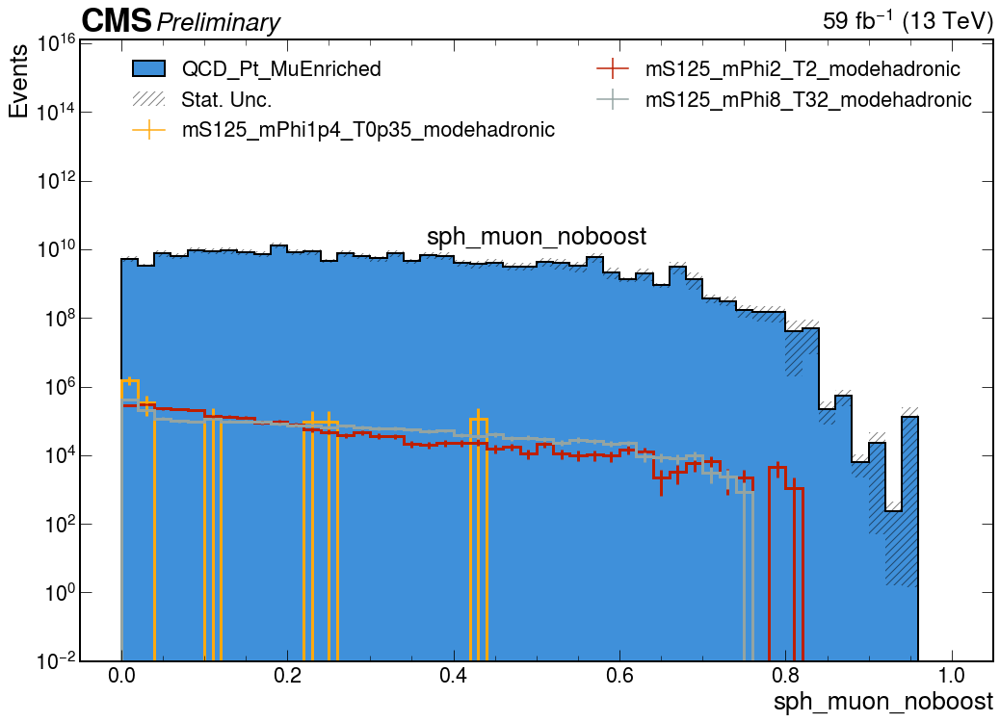

In [88]:
processes = [
    #     'Other_2018',
    #     'ST_2018',
    #     'VV_2018',
    #     'TT_powheg_2018',
    #     'DY_2018',
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "SUEP_mS125_mPhi1p4_T0p35_modehadronic_2018",
    "SUEP_mS125_mPhi2_T2_modehadronic_2018",
    "SUEP_mS125_mPhi8_T32_modehadronic_2018",
]
int_lumi = 59

plot_set = [
    [("sph_muon_noboost", "sph_muon_noboost"), {"slc": slice(None, None, 2j)}],
]

output_path = "kinematics_plots/sphericity"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(15, 11))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        text_to_show=plot_i[0][0],
        **plot_i[1],
    )
    plt.tight_layout()
    plt.show()
    fig.savefig(f"{output_path}/{plot_i[0][0]}.pdf")

Plotting: 
('muon_0_pt_precut', 'muon_0_pt')

Cut (internally): None


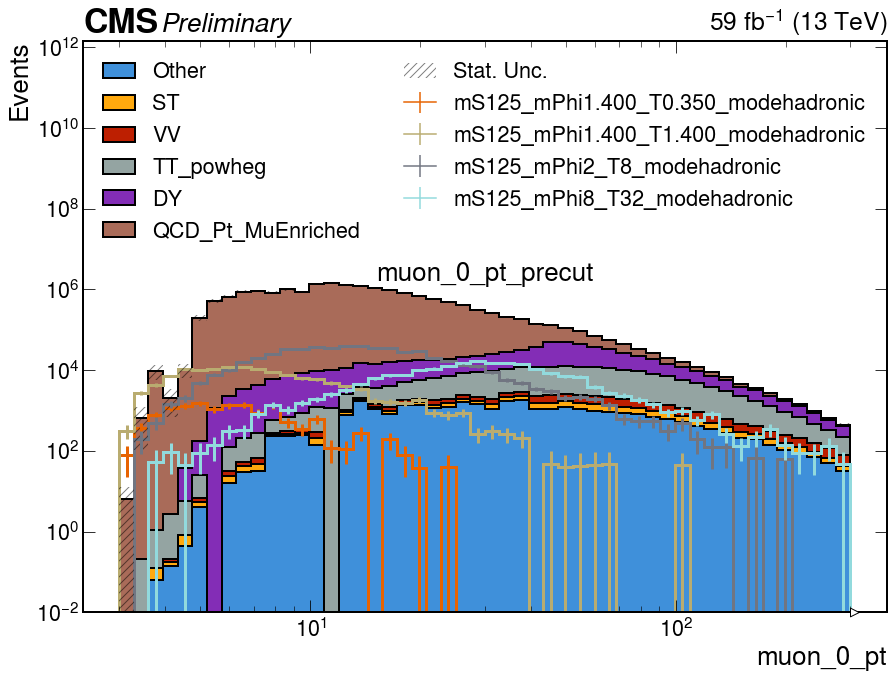

Plotting: 
('muon_0_pt_postcut_2', 'muon_0_pt')

Cut (internally): None


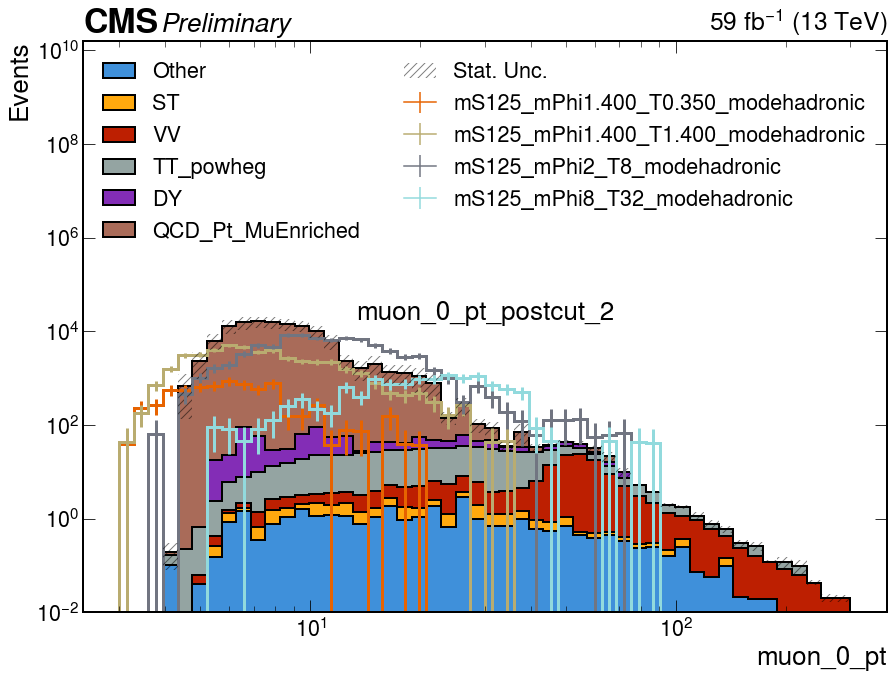

Plotting: 
('muon_0_pt_postcut_3', 'muon_0_pt')

Cut (internally): None


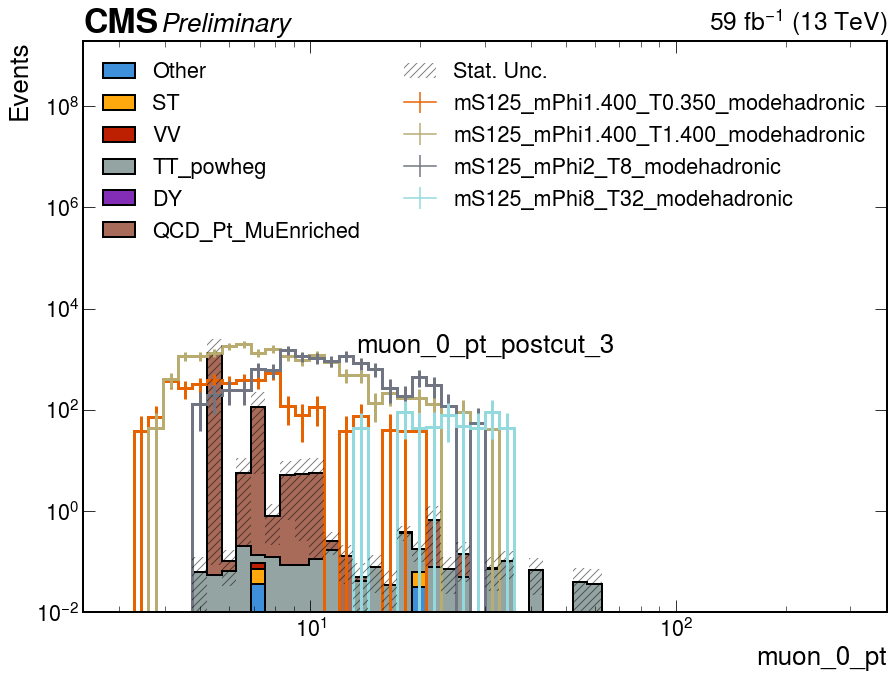

Plotting: 
('muon_1_pt_precut', 'muon_1_pt')

Cut (internally): None


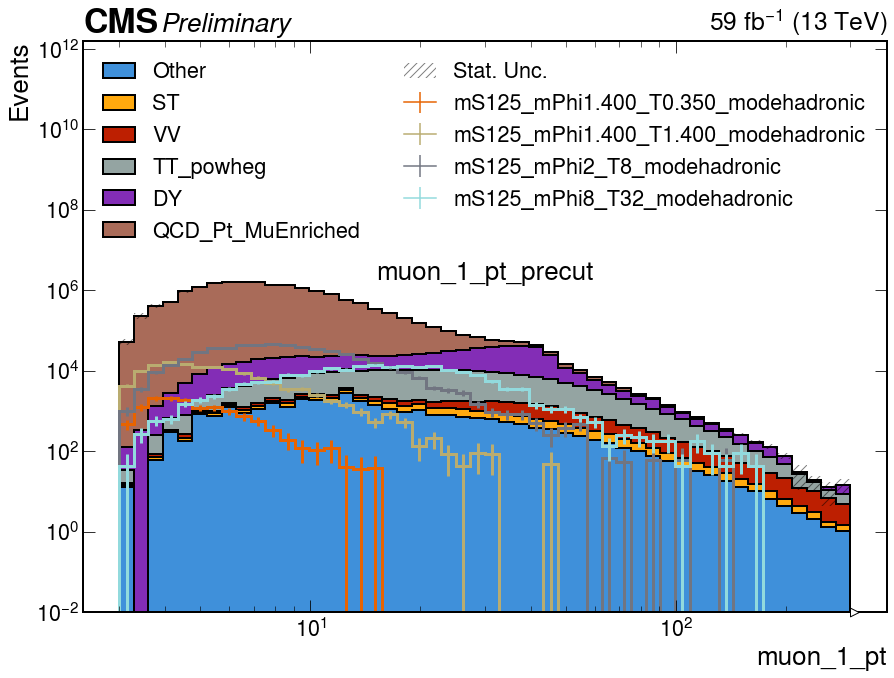

Plotting: 
('muon_1_pt_postcut_2', 'muon_1_pt')

Cut (internally): None


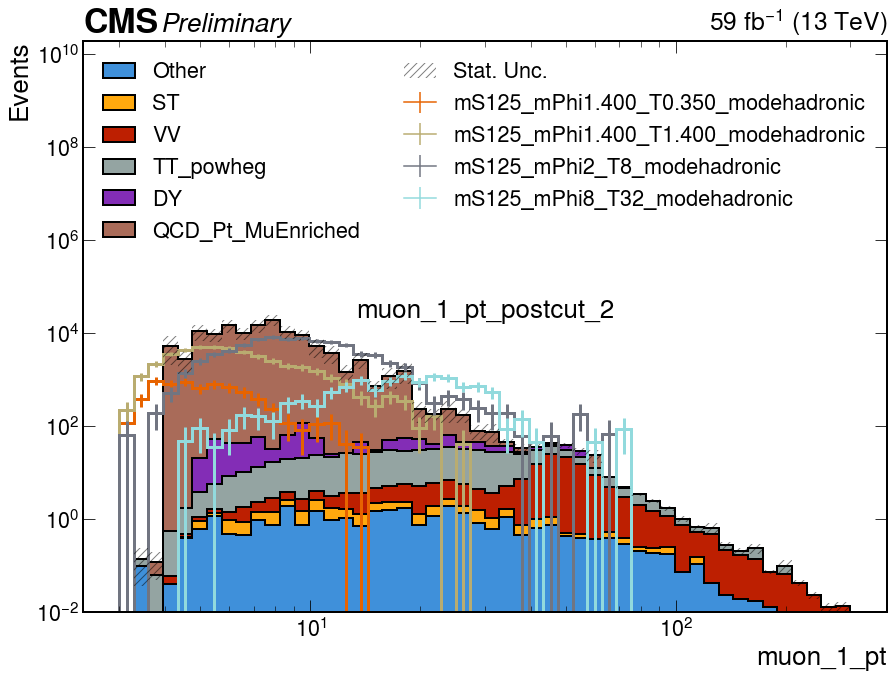

Plotting: 
('muon_1_pt_postcut_3', 'muon_1_pt')

Cut (internally): None


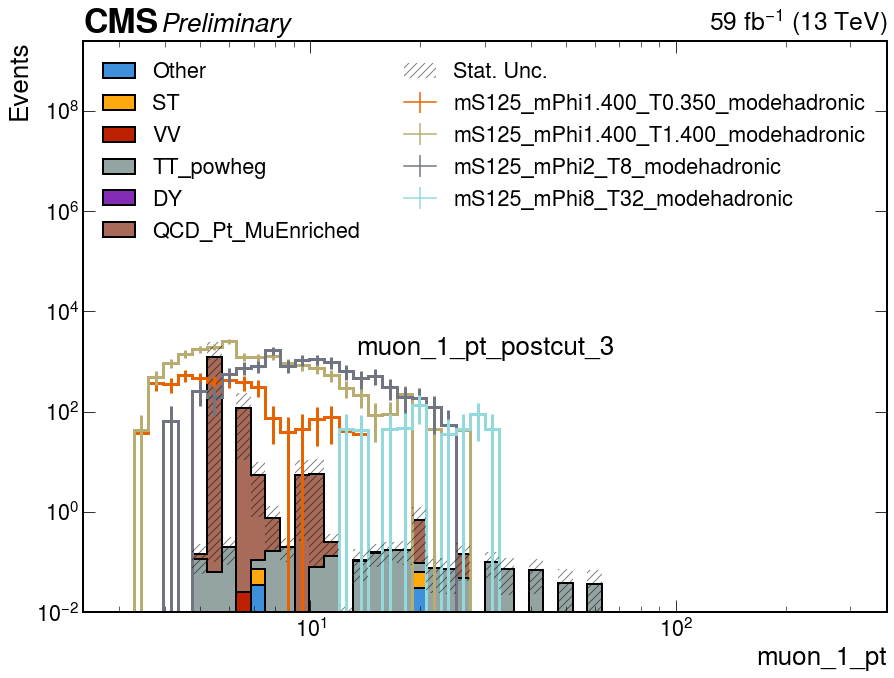

Plotting: 
('muon_2_pt_precut', 'muon_2_pt')

Cut (internally): None


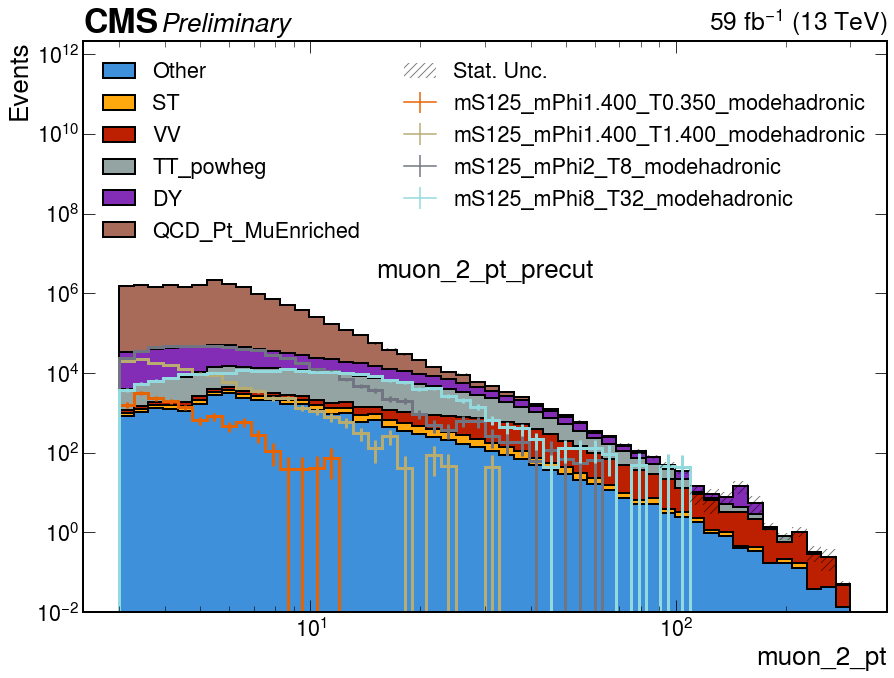

Plotting: 
('muon_2_pt_postcut_2', 'muon_2_pt')

Cut (internally): None


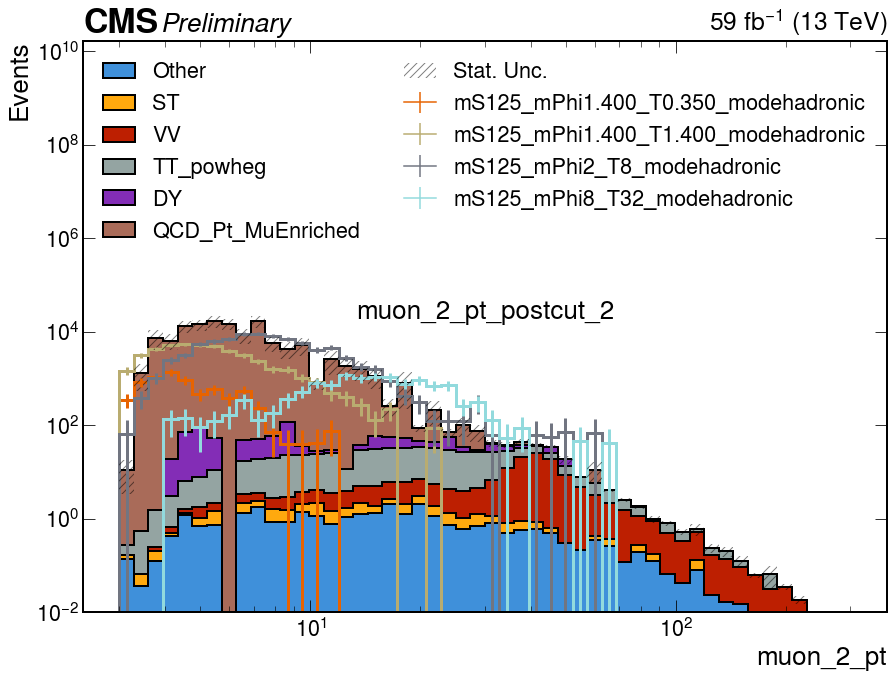

Plotting: 
('muon_2_pt_postcut_3', 'muon_2_pt')

Cut (internally): None


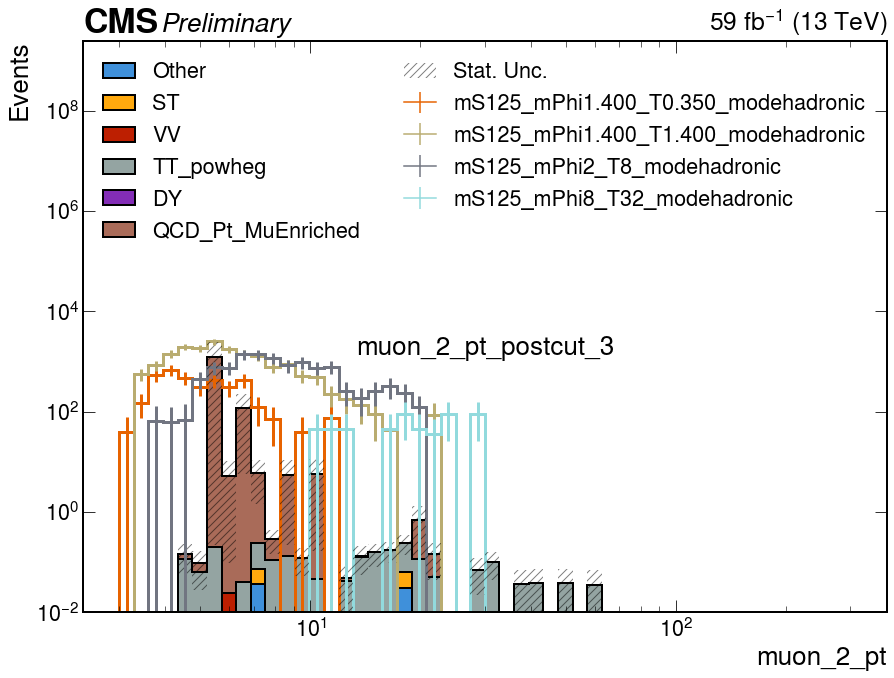

Plotting: 
('muon_3_pt_precut', 'muon_3_pt')

Cut (internally): None


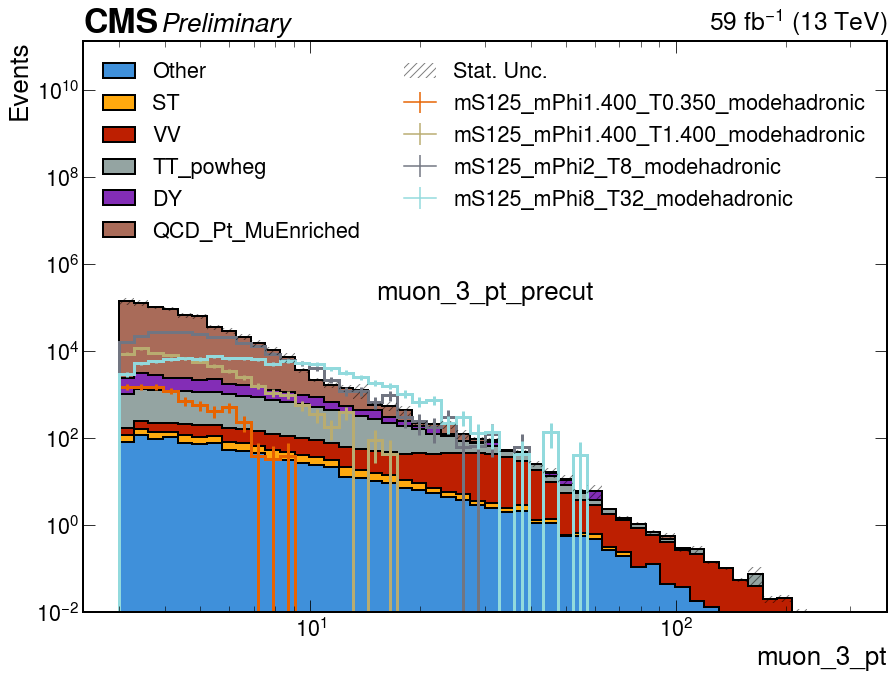

Plotting: 
('muon_3_pt_postcut_2', 'muon_3_pt')

Cut (internally): None


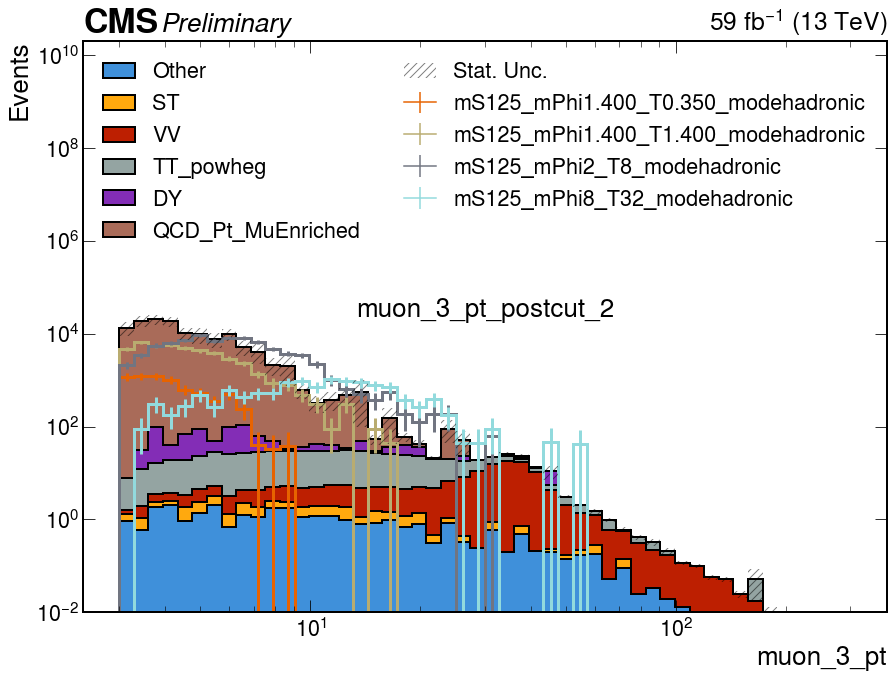

Plotting: 
('muon_3_pt_postcut_3', 'muon_3_pt')

Cut (internally): None


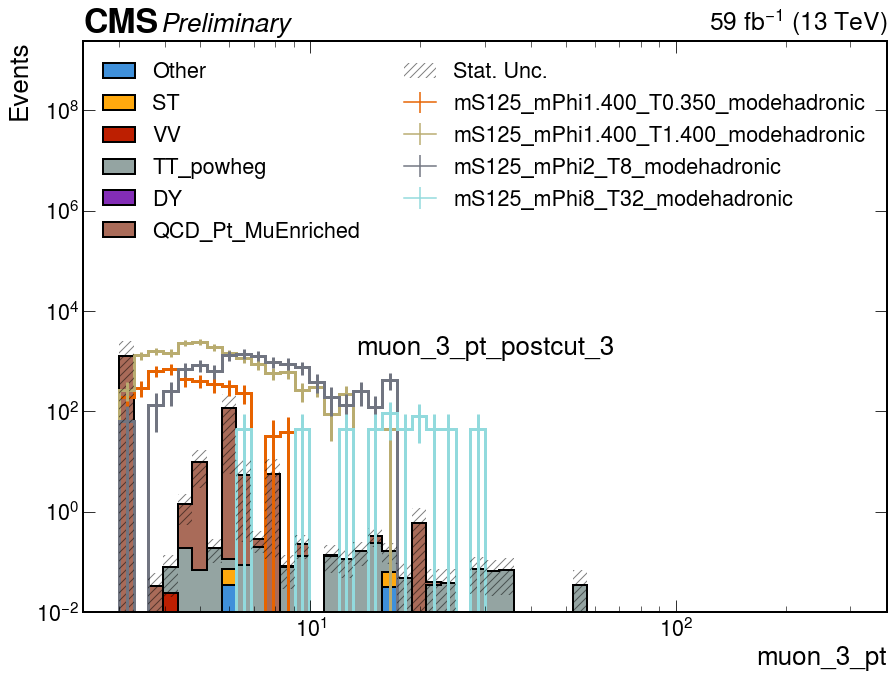

Plotting: 
('muon_4_pt_precut', 'muon_4_pt')

Cut (internally): None


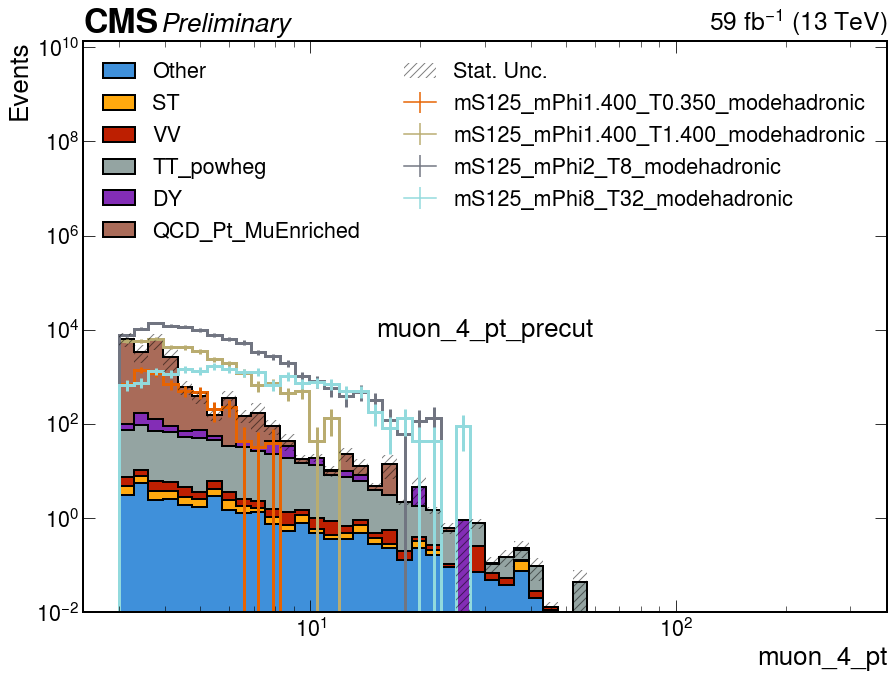

Plotting: 
('muon_4_pt_postcut_2', 'muon_4_pt')

Cut (internally): None


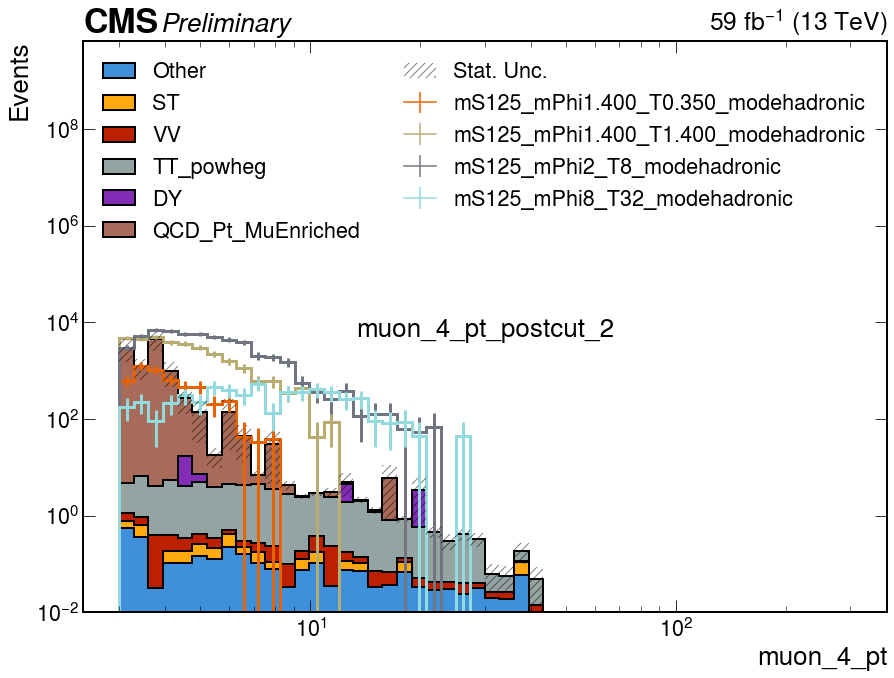

Plotting: 
('muon_4_pt_postcut_3', 'muon_4_pt')

Cut (internally): None


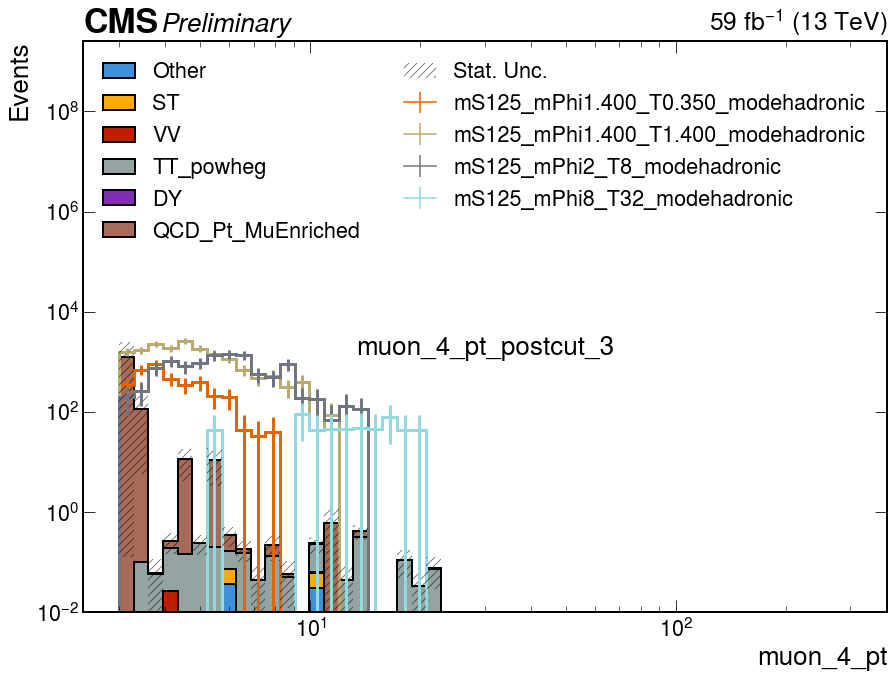

Plotting: 
('muon_5_pt_precut', 'muon_5_pt')

Cut (internally): None


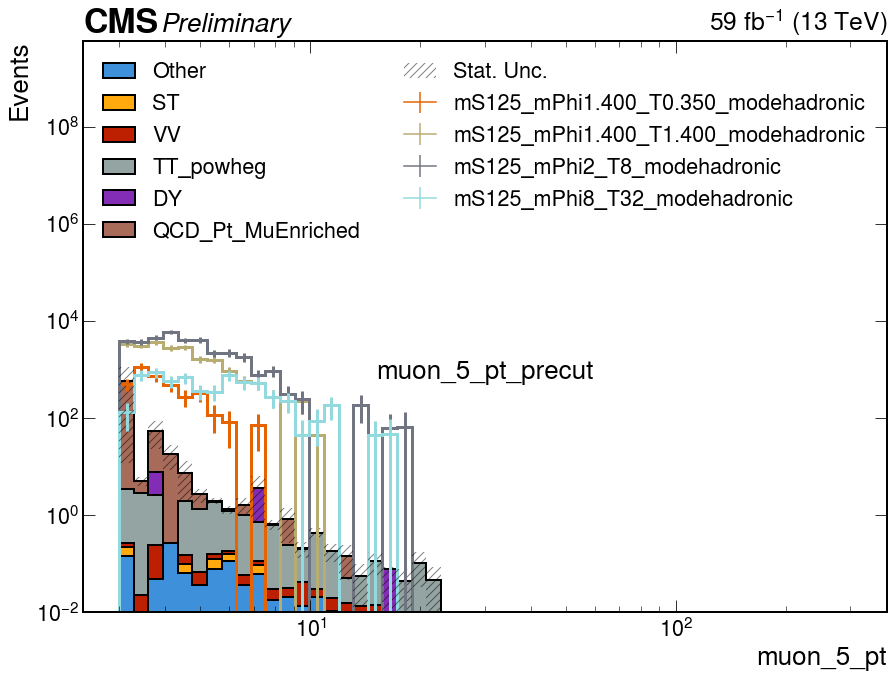

Plotting: 
('muon_5_pt_postcut_2', 'muon_5_pt')

Cut (internally): None


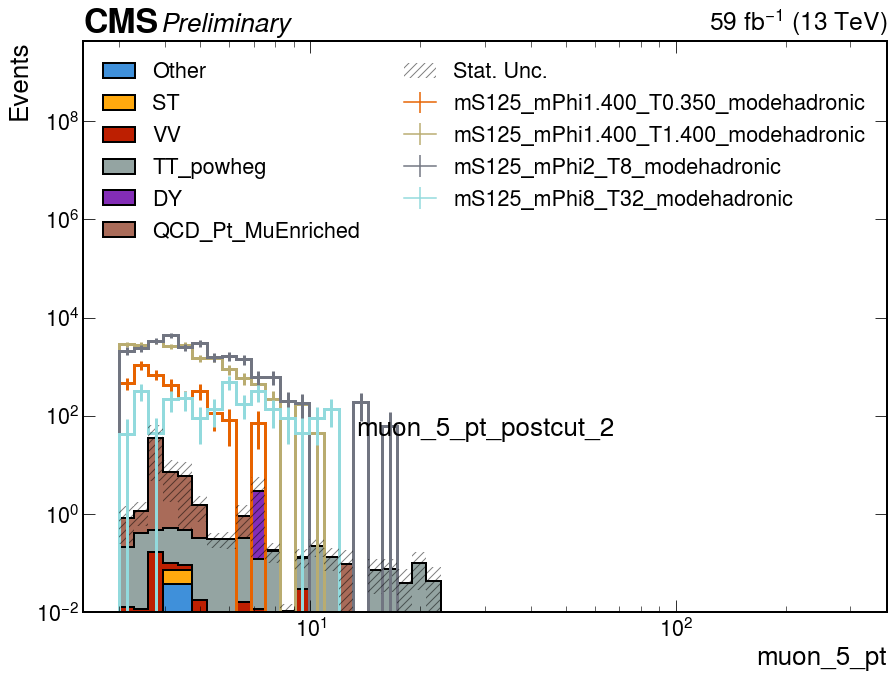

Plotting: 
('muon_5_pt_postcut_3', 'muon_5_pt')

Cut (internally): None


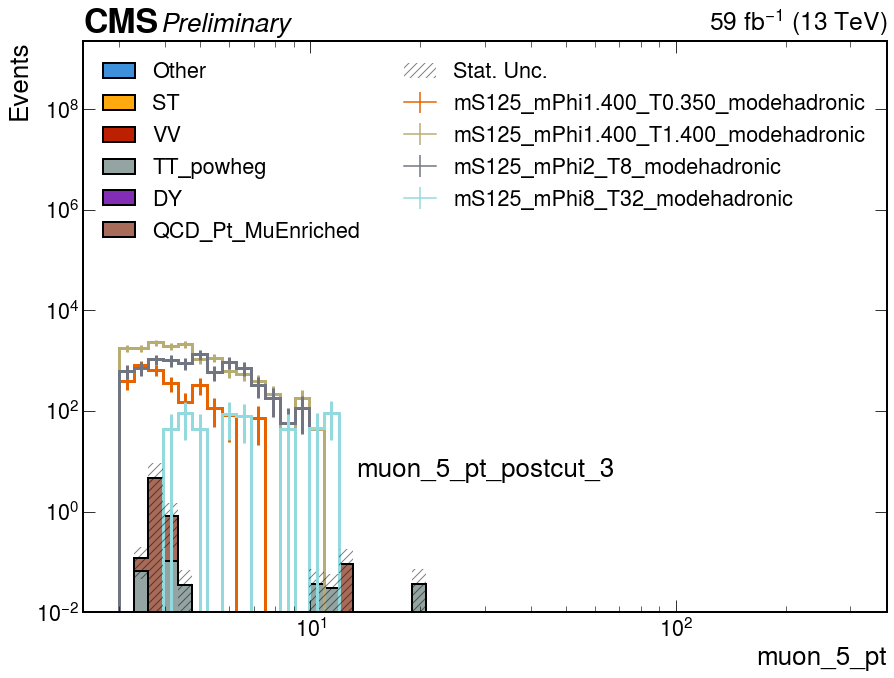

Plotting: 
('muon_6_pt_precut', 'muon_6_pt')

Cut (internally): None


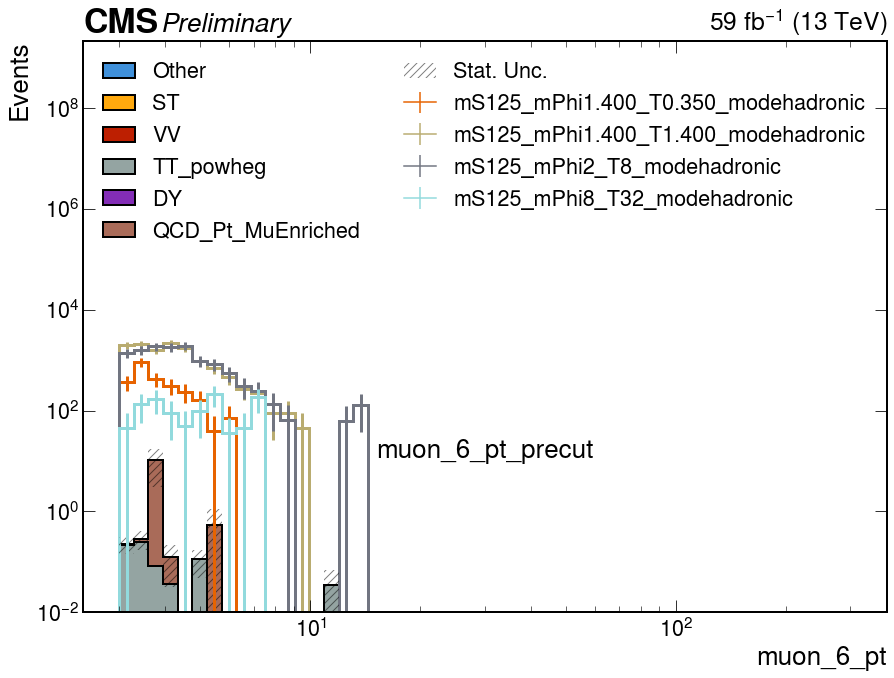

Plotting: 
('muon_6_pt_postcut_2', 'muon_6_pt')

Cut (internally): None


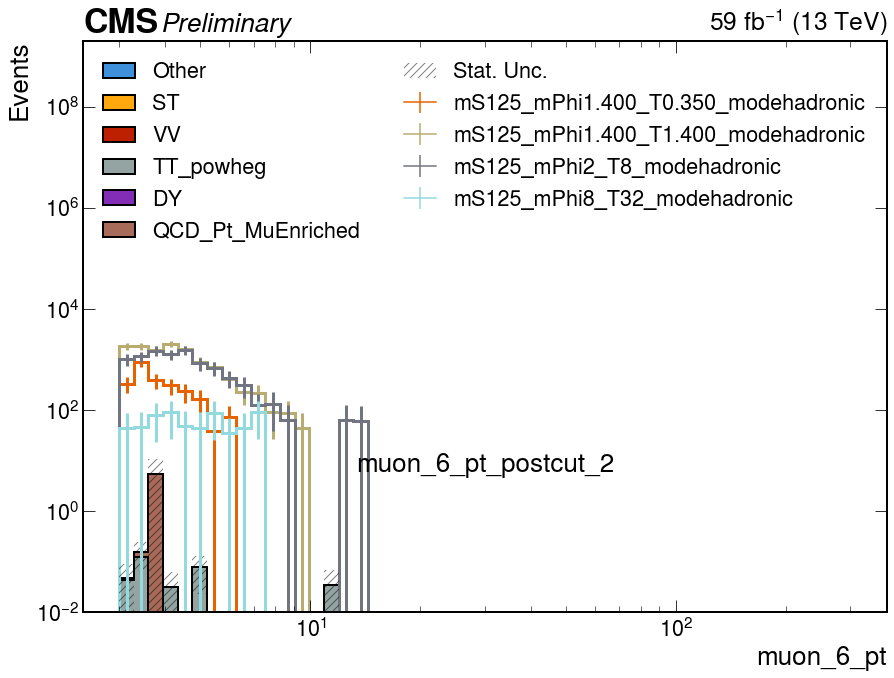

Plotting: 
('muon_6_pt_postcut_3', 'muon_6_pt')

Cut (internally): None


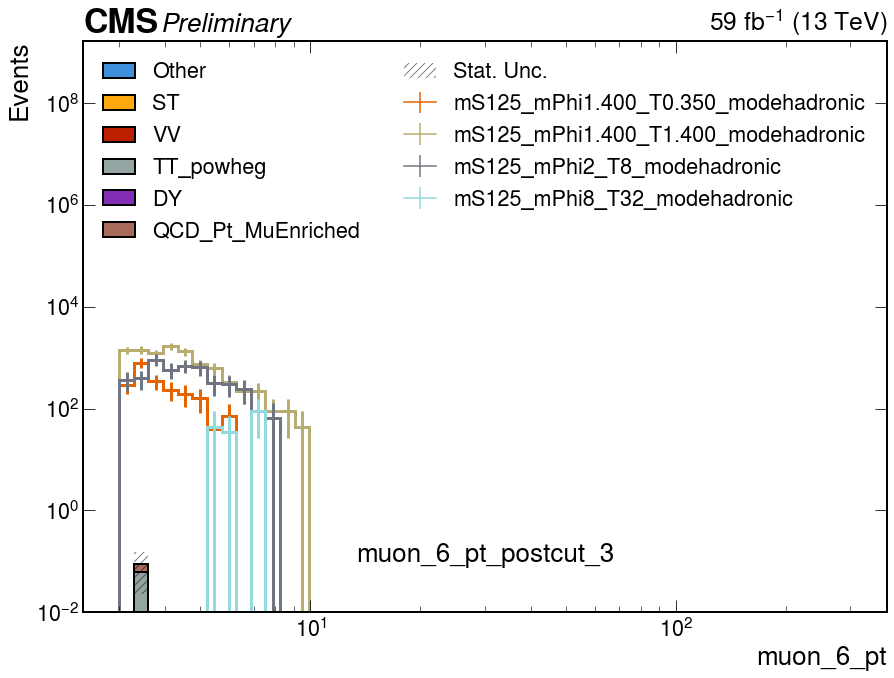

In [43]:
processes = [
    "Other_2018",
    "ST_2018",
    "VV_2018",
    "TT_powheg_2018",
    "DY_2018",
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi1.400_T1.400_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]
int_lumi = 59

plot_set = []
for muon_i in range(7):
    plot_set += [
        [
            (f"muon_{muon_i}_pt_precut", f"muon_{muon_i}_pt"),
            {"slc": slice(None, None, 2j)},
        ],
        [
            (f"muon_{muon_i}_pt_postcut_2", f"muon_{muon_i}_pt"),
            {"slc": slice(None, None, 2j)},
        ],
        [
            (f"muon_{muon_i}_pt_postcut_3", f"muon_{muon_i}_pt"),
            {"slc": slice(None, None, 2j)},
        ],
    ]

output_path = "kinematics_plots/interiso_cut_comparisons"
if not os.path.exists(output_path):
    os.makedirs(output_path)

for plot_i in plot_set:
    if plot_i[0][0] not in plots[processes[0]].keys():
        continue
    print("Plotting: ", plot_i[0])

    fig, ax = plt.subplots(1, 1, figsize=(13, 10))
    plot_utils_extras.plot_stack(
        plots=plots,
        bkg_list=processes,
        sig_list=signals,
        label=plot_i[0],
        fig=fig,
        ax=ax,
        xlog=True,
        ylog=True,
        override_slice=False,
        int_lumi=int_lumi,
        text_to_show=plot_i[0][0],
        **plot_i[1],
    )
    plt.tight_layout()
    plt.show()
    fig.savefig(f"{output_path}/{plot_i[0][0]}.pdf")

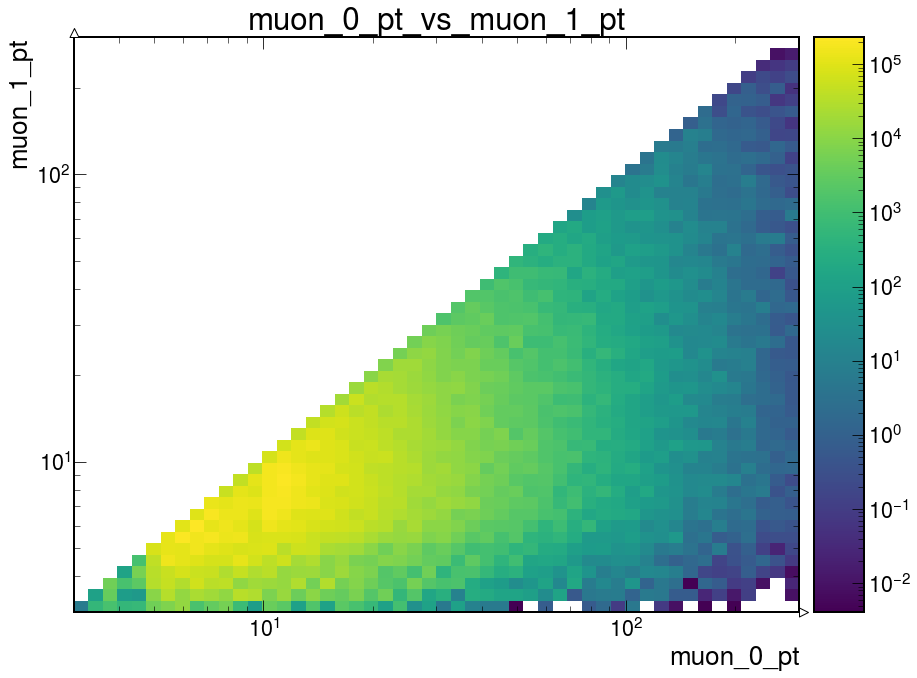

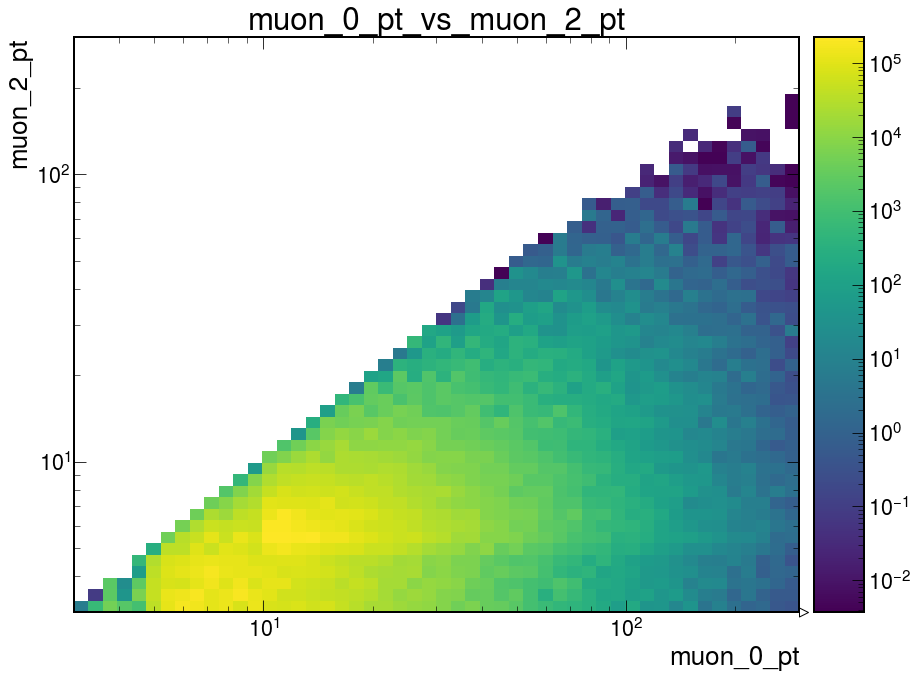

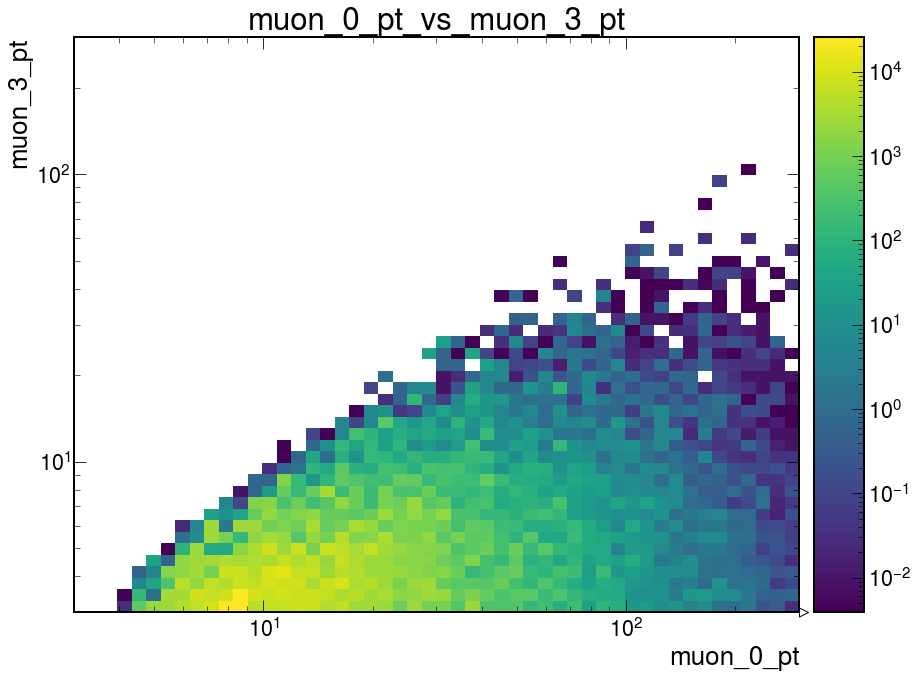

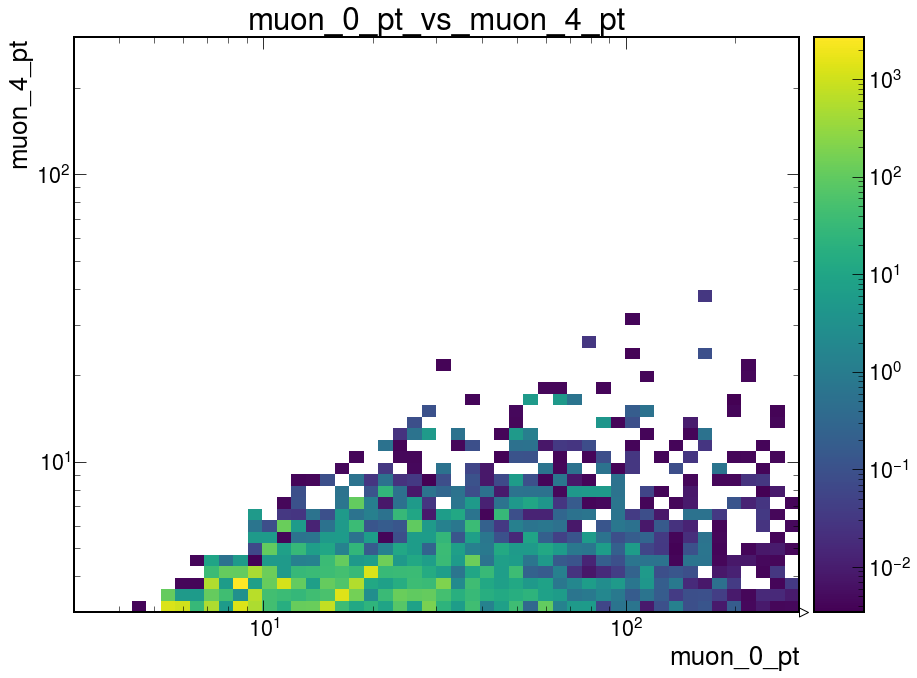

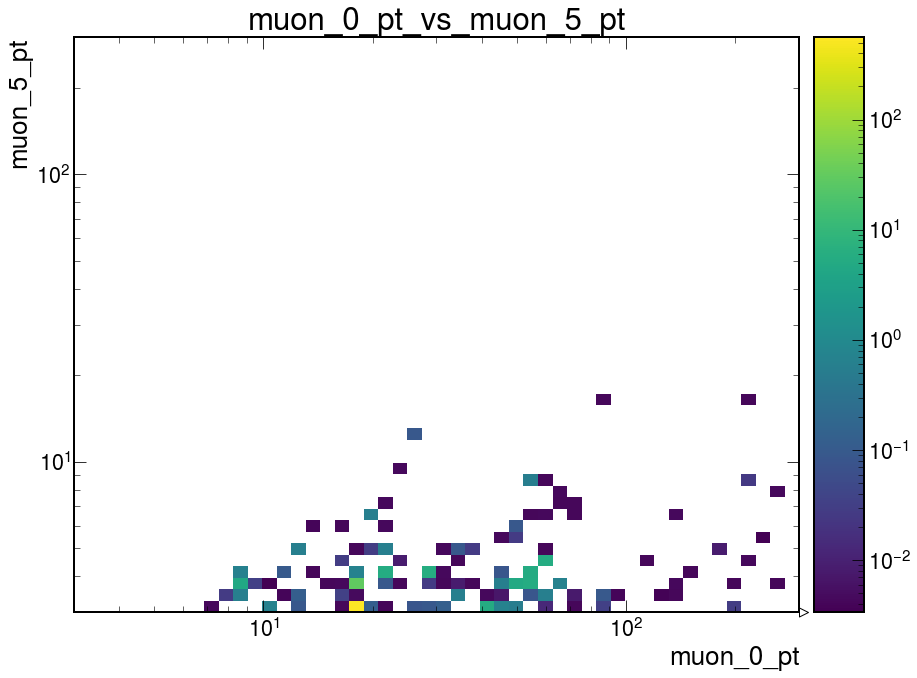

...

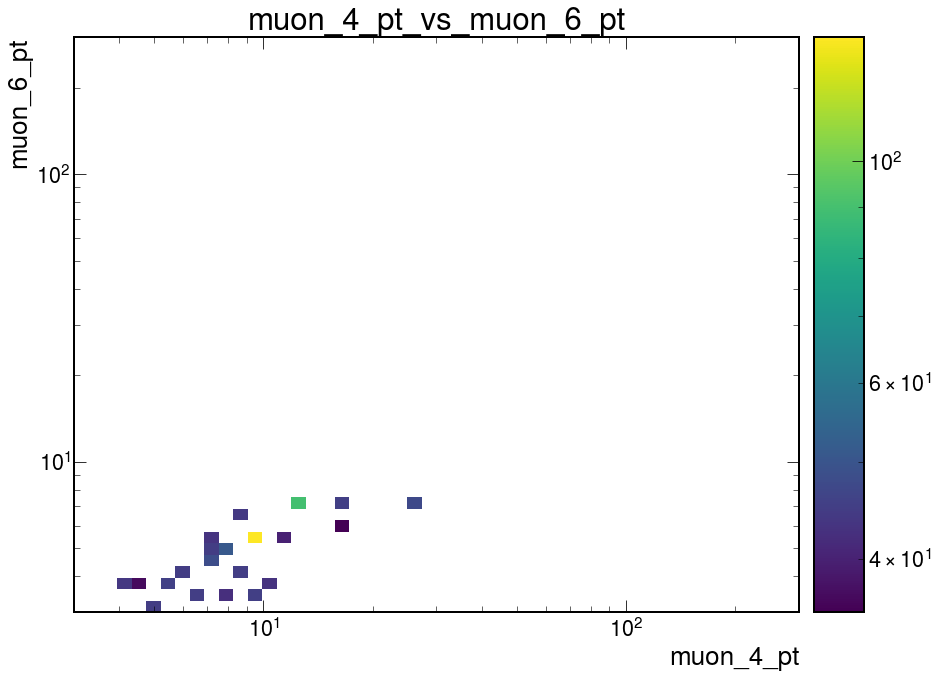

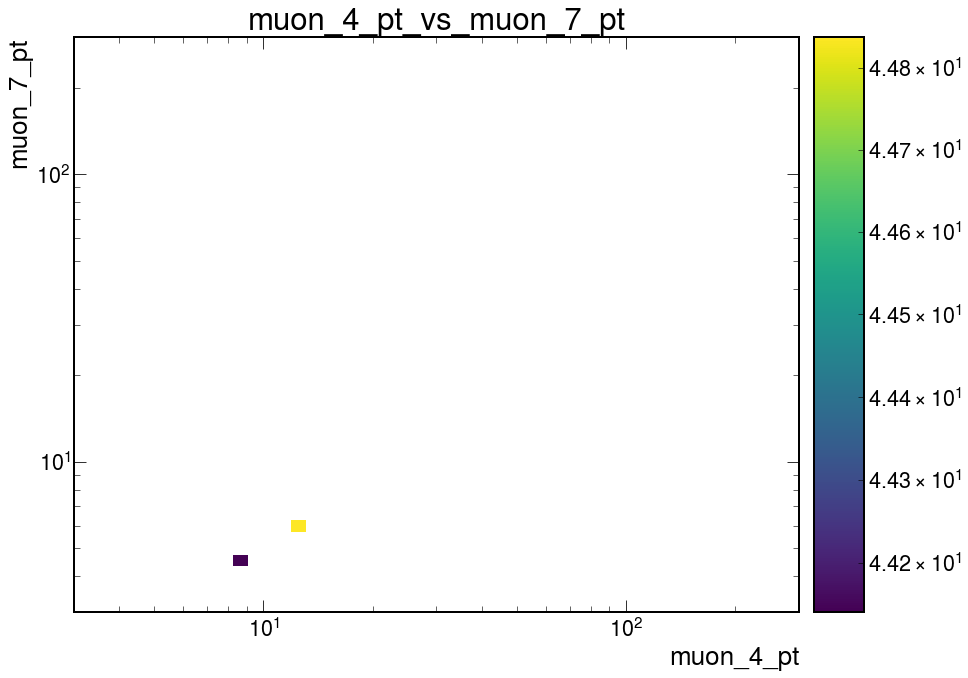

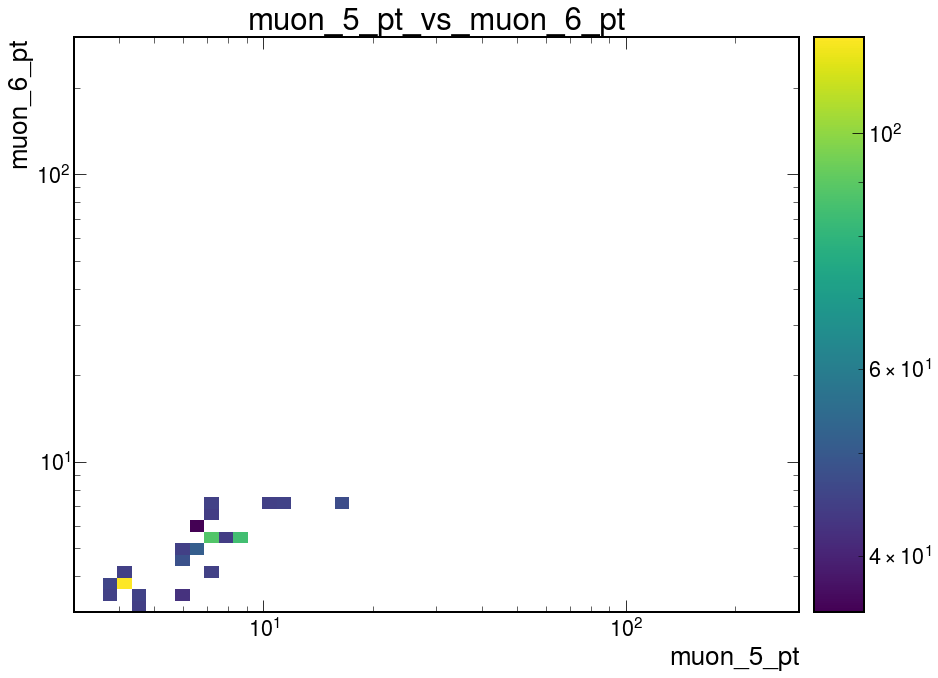

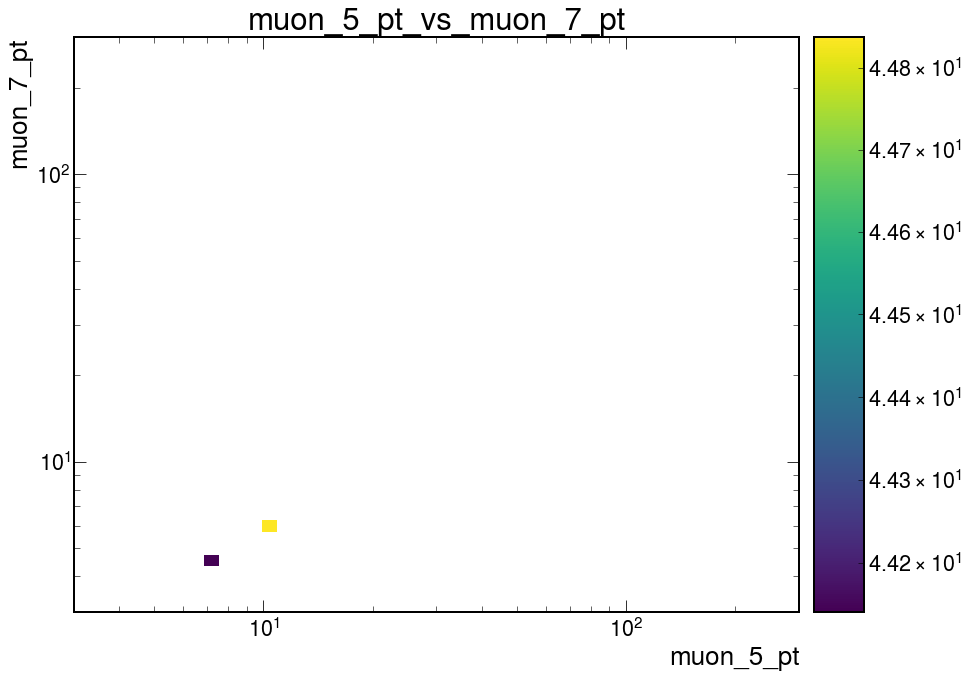

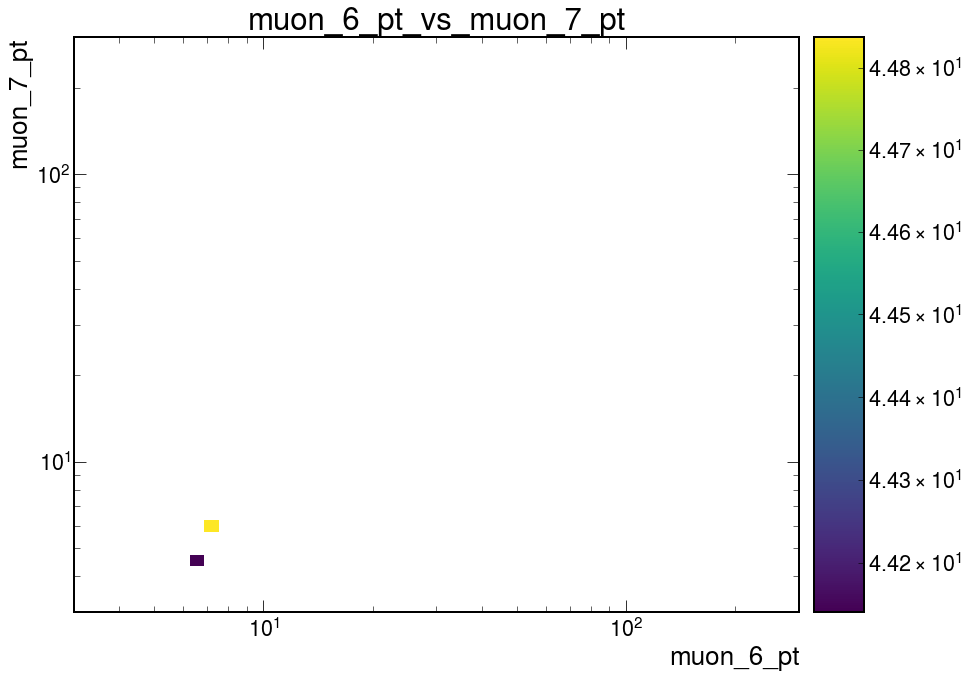

In [60]:
processes = [
    "QCD_Pt_MuEnriched_2018",
]
signals = [
    "GluGluToSUEP_mS125.000_mPhi1.400_T0.350_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi1.400_T1.400_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi2.000_T8.000_modehadronic_13TeV_2018",
    "GluGluToSUEP_mS125.000_mPhi8.000_T32.000_modehadronic_13TeV_2018",
]

for process in processes + signals:
    output_path = f"kinematics_plots/muon_pt_scatter_plots/{process}"
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for muon_i in range(7):
        for muon_j in range(muon_i + 1, 8):
            title = f"muon_{muon_i}_pt_vs_muon_{muon_j}_pt_vs_nMuon"
            if plots[process][title].sum().value == 0:
                continue
            fig, ax = plt.subplots(1, 1, figsize=(13, 10))
            hep.hist2dplot(
                plots[process][title][:, :, ::sum], norm=mpl.colors.LogNorm()
            )
            plt.title(title[:-9])
            plt.xscale("log")
            plt.yscale("log")
            plt.tight_layout()
            plt.show()
            fig.savefig(f"{output_path}/{title}.pdf")

In [65]:
# Deploy plots
!tar -cf kinematics_plots.tar kinematics_plots
!xrdcp -f kinematics_plots.tar root://eosuser.cern.ch//eos/user/c/chpapage/

[5.811MB/5.811MB][100%][==================================================][2.905MB/s]  
